# We will take Red channel from R/IR, Green channel from G, and separetely R/G/B channels from UV images. White - images are already extracted with splitted channels.

In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))

In [2]:
import sys
import os

# sys.path.append(os.path.abspath("/mnt/skin_cancer_nas/eye_vein_pulse/pipelines"))
# sys.path.append(os.path.abspath("/mnt/skin_cancer_nas/eye_vein_pulse/pipelines/frames_from_video"))
# sys.path.append(os.path.abspath("/mnt/skin_cancer_nas/eye_vein_pulse/data/torch_generator"))
# sys.path.append(os.path.abspath("/mnt/skin_cancer_nas/eye_vein_pulse/nas/darts_torch"))
# sys.path.append('/mnt')
# sys.path.append('/mnt/src')
# sys.path.append('/mnt/src/eye_vein_pulse')

# from src.eye_vein_pulse.pipelines.frames_from_video import nodes as frames_from_video_nodes

import PIL
from PIL import Image
from numpy import *
from pylab import *

import cv2

from tqdm.notebook import tqdm

import numpy as np
import matplotlib.pyplot as plt

from matplotlib import animation, rc
from IPython.display import HTML
from matplotlib.pyplot import imshow

from sklearn.decomposition import PCA



import cv2

# from skimage.filters import meijering

In [3]:
%matplotlib inline

In [4]:
# import cv2 
# import numpy as np 
# import matplotlib.pyplot as plt
# def register_frames_matrix(frames_matrix, registration_func):
    
    
    
#     # Read the images to be aligned
#     im1_gray = frames_matrix[i, :, :]    # the image that the alignment is based on
#     im2_gray = frames_matrix[i+1, :, :]  # the image that will be aligned

def register_opencv_findTransformECC(im1_gray, im2_gray, warp_mode=cv2.MOTION_TRANSLATION, mask=None, number_of_iterations=500):
    '''
    We will register starting from first image, and will move forward (each pair of images will be registered)
    First image in the stack can be currapted, thus it is desirable to align propagating pairs of images:
    1 vs 2, 2nd aligned to first with 3rd.
    
    Image will be skipped from alignment if too large shift/rotation will be detected.
    '''
    
    im1 = im1_gray
    # Find size of image1
    sz = im1.shape

    # Define 2x3 or 3x3 matrices and initialize the matrix to identity
    if warp_mode == cv2.MOTION_HOMOGRAPHY :
        warp_matrix = np.eye(3, 3, dtype=np.float32)
    else :
        warp_matrix = np.eye(2, 3, dtype=np.float32)

    # Specify the threshold of the increment
    # in the correlation coefficient between two iterations
    termination_eps = 1e-10;

    # Define termination criteria
    criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, number_of_iterations,  termination_eps)

    # Run the ECC algorithm. The results are stored in warp_matrix.
    try:
        cc, warp_matrix = cv2.findTransformECC(im1_gray, im2_gray, warp_matrix, warp_mode, criteria, inputMask=mask, gaussFiltSize=1)
    except Exception:
        print('Error occured!')
#         cc, warp_matrix = cv2.findTransformECC(im1_gray, im2_gray, warp_matrix, warp_mode, criteria, inputMask=None, gaussFiltSize=0)
        cc = -1.0
        im2_aligned = np.zeros(im2_gray.shape)

    im2 = im2_gray
    # Use warpPerspective for Homography
    if warp_mode == cv2.MOTION_HOMOGRAPHY :
        im2_aligned = cv2.warpPerspective (im2, warp_matrix, (sz[1],sz[0]), flags=cv2.INTER_LINEAR + cv2.WARP_INVERSE_MAP)

    else :
        # Use warpAffine for Translation, Euclidean and Affine
        im2_aligned = cv2.warpAffine(im2, warp_matrix, (sz[1],sz[0]), flags=cv2.INTER_LINEAR + cv2.WARP_INVERSE_MAP, borderMode=cv2.BORDER_REPLICATE);
        
    return im2_aligned, cc, warp_matrix

# # Show final results
# fig = plt.figure() #define figure
# #plt.rcParams.update({'font.size': 40}) #label text size
# fig.subplots_adjust(hspace=0.2, wspace=0.47) #spaces between the sub-plots
# fig=plt.figure(figsize=(25, 25), dpi= 100, facecolor='w', edgecolor='k') #change size of the output figure

# ax1 = fig.add_subplot(1, 1, 1)
# #turn off matlab graph ticks
# ax1.set_yticklabels([])
# ax1.set_xticklabels([])

# #Show image
# ax1.imshow(im2_aligned)

# #Save figure
# plt.savefig(path + folder_nr + "//uv//uv_aligned.png", bbox_inches='tight', pad_inches=0)
# print('Aligned UV image saved!')

In [5]:
def register_frames_matrix(frames_matrix, number_of_iterations=500, warp_mode=cv2.MOTION_TRANSLATION): 

    registered_frames = []
    cc_list = []
    warp_matrix_list = []
    ref_image = frames_matrix[2, :, :] # Red channel of RED image
    
#     registered_frames.append(ref_image)
#     cc_list.append(1.0)
#     warp_matrix_list.append(np.eye(2, 3, dtype=np.float32))
    
    for i in tqdm(range(0, frames_matrix.shape[0])):
        if i == 2:
            im2_aligned = frames_matrix[i, :, :] 
            registered_frames.append(im2_aligned)
            cc_list.append(1.0)
            warp_matrix_list.append(np.eye(2, 3, dtype=np.float32))
        else:
            im_to_register = frames_matrix[i, :, :]
            im2_aligned, cc, warp_matrix = register_opencv_findTransformECC( im1_gray=ref_image, 
                                                                             im2_gray=im_to_register, 
                                                                             warp_mode=warp_mode, 
                                                                             mask=None, 
                                                                             number_of_iterations=number_of_iterations)
            registered_frames.append(im2_aligned)
            cc_list.append(cc)
            warp_matrix_list.append(warp_matrix)
            
    return registered_frames, cc_list, warp_matrix_list


In [39]:
def frames_matrix_from_images_folder(folder):
    
    r_folder = os.path.join(folder, 'r')
    ir_folder = os.path.join(folder, 'ir')
    g_folder = os.path.join(folder, 'g')
    # UV folder contains set of images
    uv_folder = os.path.join(folder, 'uv')
    white_folder = os.path.join(folder, 'white')
    
    files_dict = {}
    
    if os.path.isdir(r_folder):
        r_files = list(os.listdir(r_folder))
        if len(r_files) > 0:
            r_file_path = os.path.join(r_folder, r_files[0])
            r = cv2.imread(r_file_path, cv2.IMREAD_COLOR)
            files_dict['r-b'] = (r[:, :, 0], r_file_path)
            files_dict['r-g'] = (r[:, :, 1], r_file_path)
            files_dict['r-r'] = (r[:, :, 2], r_file_path)
            
    if os.path.isdir(ir_folder):
        ir_files = list(os.listdir(ir_folder))
        if len(ir_files) > 0:
            ir_file_path = os.path.join(ir_folder, ir_files[0])
            ir = cv2.imread(ir_file_path, cv2.IMREAD_COLOR)
            files_dict['ir-b'] = (ir[:, :, 0], ir_file_path)
            files_dict['ir-g'] = (ir[:, :, 1], ir_file_path)
            files_dict['ir-r'] = (ir[:, :, 2], ir_file_path)
            
    if os.path.isdir(g_folder):
        g_files = list(os.listdir(g_folder))
        if len(g_files) > 0:
            g_file_path = os.path.join(g_folder, g_files[0])
            g = cv2.imread(g_file_path, cv2.IMREAD_COLOR)
            files_dict['g-b'] = (g[:, :, 0], g_file_path)
            files_dict['g-g'] = (g[:, :, 1], g_file_path)
            files_dict['g-r'] = (g[:, :, 2], g_file_path)
            
    if os.path.isdir(uv_folder):
        uv_files = list(os.listdir(uv_folder))
        if len(uv_files) > 0:
            i = 0
            for uv_file in uv_files:
                uv_file_path = os.path.join(uv_folder, uv_file)
                uv = cv2.imread(uv_file_path, cv2.IMREAD_COLOR)
                files_dict['uv-{}-b'.format(i)] = (uv[:, :, 0], uv_file_path)
                files_dict['uv-{}-g'.format(i)] = (uv[:, :, 1], uv_file_path)
                files_dict['uv-{}-r'.format(i)] = (uv[:, :, 2], uv_file_path)
                i = i + 1
                
    if os.path.isdir(white_folder):
        white_files = list(os.listdir(white_folder))
        if len(white_files) > 0:
            white_file_path = os.path.join(white_folder, white_files[0])
            white = cv2.imread(white_file_path, cv2.IMREAD_COLOR)
            files_dict['white-b'] = (white[:, :, 0], white_file_path)
            files_dict['white-g'] = (white[:, :, 1], white_file_path)
            files_dict['white-r'] = (white[:, :, 2], white_file_path)
#             files_dict['white'] = (white, white_file_path)
    
    files_list = []
    if 'r-b' in files_dict:
        files_list.append(files_dict['r-b'][0])
        files_list.append(files_dict['r-g'][0])
        files_list.append(files_dict['r-r'][0])
    if 'ir-b' in files_dict:
        files_list.append(files_dict['ir-b'][0])
        files_list.append(files_dict['ir-g'][0])
        files_list.append(files_dict['ir-r'][0])
    if 'g-b' in files_dict:
        files_list.append(files_dict['g-b'][0])
        files_list.append(files_dict['g-g'][0])
        files_list.append(files_dict['g-r'][0])
    if 'uv-0-b' in files_dict:
        keys = files_dict.keys()
        def is_uv_key(k):
            return 'uv-0-b' in k

        uv_keys = list(filter(is_uv_key, keys))
        uv_keys.sort()
        for uv_k in uv_keys:
            files_list.append(files_dict[uv_k][0])
            break
    if 'uv-0-g' in files_dict:
        keys = files_dict.keys()
        def is_uv_key(k):
            return 'uv-0-g' in k

        uv_keys = list(filter(is_uv_key, keys))
        uv_keys.sort()
        for uv_k in uv_keys:
            files_list.append(files_dict[uv_k][0])
            break
    if 'uv-0-r' in files_dict:
        keys = files_dict.keys()
        def is_uv_key(k):
            return 'uv-0-r' in k

        uv_keys = list(filter(is_uv_key, keys))
        uv_keys.sort()
        for uv_k in uv_keys:
            files_list.append(files_dict[uv_k][0])
            break
            
    # It is assumed that white images if present are the last ones! See registration function.
    if 'white-b' in files_dict:
        files_list.append(files_dict['white-b'][0])
    if 'white-g' in files_dict:
        files_list.append(files_dict['white-g'][0])
    if 'white-r' in files_dict:
        files_list.append(files_dict['white-r'][0])
#     if 'white' in files_dict:
#         files_list.append(files_dict['white'][0])
    
    return files_dict, files_list
    
    
#     only_tif_files = [f for f in os.listdir(captured_video_folder) if os.path.isfile(os.path.join(captured_video_folder, f)) and f.endswith('.tif')]
#     only_tif_files.sort()
    
#     allfiles=only_tif_files
#     imlist=[]
#     for ff in tqdm(allfiles):
#         imlist.append(os.path.join(captured_video_folder, ff))

# #     im = array(Image.open(imlist[0]))
# #     m,n=im.shape[0:2]
# #     imnbr= list(imlist)

#     #create matrix to store all flattened images
#     frames_matrix = asarray([array(PIL.Image.open(im)) for im in imlist], 'f')
#     return frames_matrix

In [40]:
fmat_white = frames_matrix_from_images_folder('/mnt/data/interim/_melanoma_20200728/loc/B07.9/2019-08-21_10-59-37/')

In [41]:
fmat_white[0].keys()

dict_keys(['r-b', 'r-g', 'r-r', 'ir-b', 'ir-g', 'ir-r', 'g-b', 'g-g', 'g-r', 'uv-0-b', 'uv-0-g', 'uv-0-r', 'uv-1-b', 'uv-1-g', 'uv-1-r', 'uv-2-b', 'uv-2-g', 'uv-2-r', 'uv-3-b', 'uv-3-g', 'uv-3-r', 'uv-4-b', 'uv-4-g', 'uv-4-r', 'uv-5-b', 'uv-5-g', 'uv-5-r', 'uv-6-b', 'uv-6-g', 'uv-6-r', 'uv-7-b', 'uv-7-g', 'uv-7-r', 'uv-8-b', 'uv-8-g', 'uv-8-r', 'uv-9-b', 'uv-9-g', 'uv-9-r', 'uv-10-b', 'uv-10-g', 'uv-10-r', 'uv-11-b', 'uv-11-g', 'uv-11-r', 'uv-12-b', 'uv-12-g', 'uv-12-r', 'uv-13-b', 'uv-13-g', 'uv-13-r', 'uv-14-b', 'uv-14-g', 'uv-14-r', 'uv-15-b', 'uv-15-g', 'uv-15-r', 'uv-16-b', 'uv-16-g', 'uv-16-r', 'uv-17-b', 'uv-17-g', 'uv-17-r', 'uv-18-b', 'uv-18-g', 'uv-18-r', 'uv-19-b', 'uv-19-g', 'uv-19-r', 'white-b', 'white-g', 'white-r'])

In [42]:
fmat_white[1][5].shape

(512, 460)

In [10]:
# let's register r/ir/g/uv (grayscale) & bGR - Color images
frames_matrix_white = np.stack(fmat_white[1])
registered_frames_white, cc_list_white, warp_matrix_list_white = register_frames_matrix(frames_matrix_white, number_of_iterations=500, warp_mode=cv2.MOTION_EUCLIDEAN)

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!



In [11]:
# w = cv2.imread('/mnt/data/interim/_melanoma_20200728/loc/B07.9/2019-08-21_10-59-37/white/White_10ms.png')

In [12]:
# w[10,10,0]  # OpenCV reads images as BGR - hence first dimension is zeroes - there are no blue channel

In [13]:
files_dict, files_list = frames_matrix_from_images_folder('/mnt/data/interim/_melanoma_20200728/checkyourskin/A63/2019-03-25_11-39-21')

In [14]:
len(files_list)

12

In [15]:
# files_dict

In [16]:
files_dict.keys()

dict_keys(['r-b', 'r-g', 'r-r', 'ir-b', 'ir-g', 'ir-r', 'g-b', 'g-g', 'g-r', 'uv-0-b', 'uv-0-g', 'uv-0-r', 'uv-1-b', 'uv-1-g', 'uv-1-r', 'uv-2-b', 'uv-2-g', 'uv-2-r', 'uv-3-b', 'uv-3-g', 'uv-3-r', 'uv-4-b', 'uv-4-g', 'uv-4-r', 'uv-5-b', 'uv-5-g', 'uv-5-r', 'uv-6-b', 'uv-6-g', 'uv-6-r', 'uv-7-b', 'uv-7-g', 'uv-7-r', 'uv-8-b', 'uv-8-g', 'uv-8-r', 'uv-9-b', 'uv-9-g', 'uv-9-r'])

In [17]:
frames_matrix = np.stack(files_list)

In [18]:
frames_matrix.shape

(12, 448, 466)

In [19]:
registered_frames, cc_list, warp_matrix_list = register_frames_matrix(frames_matrix, number_of_iterations=500, warp_mode=cv2.MOTION_EUCLIDEAN)

Error occured!
Error occured!
Error occured!



In [20]:
frames_matrix.shape

(12, 448, 466)

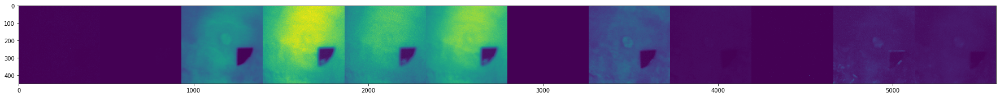

In [21]:
fig = plt.figure(figsize=(31,5))
imshow(np.hstack(frames_matrix))

In [22]:
# kernel = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
# im = cv2.filter2D(registered_frames[1], -1, kernel)
# # im = cv2.filter2D(im, -1, kernel)
# imshow(im)

In [23]:
fig = plt.figure(figsize=(5,5))
registered_frames[1].shape

(448, 466)

<Figure size 360x360 with 0 Axes>

In [24]:
res = cv2.resize(registered_frames[1],None,fx=0.5, fy=0.5, interpolation = cv2.INTER_CUBIC)
fig = plt.figure(figsize=(5,5))
# imshow(res)
res.shape

(224, 233)

<Figure size 360x360 with 0 Axes>

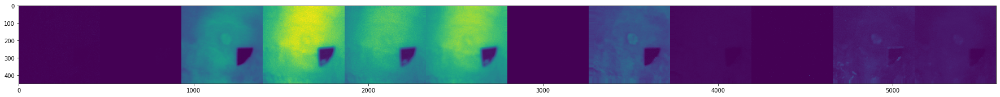

In [25]:
fig = plt.figure(figsize=(31,5))
imshow(np.hstack(registered_frames))

# Downscale, then register and apply warpMatrices on original iamges

In [26]:
# !pip install scikit-image

In [29]:
# from skimage.transform import rescale, resize, downscale_local_mean

In [30]:
# image = frames_matrix[0]  #color.rgb2gray(data.astronaut())

# image_rescaled = rescale(image, 0.25, anti_aliasing=True)
# image_resized = resize(image, (image.shape[0] // 4, image.shape[1] // 4),
#                        anti_aliasing=True)
# image_downscaled = downscale_local_mean(image, (4, 4))

In [27]:
# imshow(image)

In [28]:
# imshow(image_rescaled)

In [29]:
# imshow(image_resized)

In [30]:
# imshow(image_downscaled)

In [31]:
# from skimage.transform import rescale, resize, downscale_local_mean

# registered_frames_, cc_list, warp_matrix_list = register_frames_matrix(frames_matrix, number_of_iterations=500, warp_mode=cv2.MOTION_EUCLIDEAN)

# Let's try downscale by factor of 2 and then upscale by factor of 2

In [32]:
# !pip list

In [33]:
# !pip install --upgrade opencv-python
# !pip install --upgrade opencv-contrib-python

In [34]:
# !pip list

In [35]:
# from cv2 import dnn_superres

In [ ]:
# import cv2
# from cv2 import dnn_superres

# # Create an SR object
# sr = dnn_superres.DnnSuperResImpl_create()

# # Read image
# image_ = registered_frames[0]  #cv2.imread('./input.png')

# # Read the desired model
# path = "/mnt/data/EDSR_x2.pb"
# sr.readModel(path)

# # Set the desired model and scale to get correct pre- and post-processing
# sr.setModel("edsr", 2)

# # Upscale the image
# result_ = sr.upsample(image_)

# # Save the image
# # cv2.imwrite("./upscaled.png", result)
# imshow(result_)

In [27]:
def register_folder(folder):
    files_dict, files_list = frames_matrix_from_images_folder(folder)
    registered_frames, cc_list, warp_matrix_list = register_frames_matrix(frames_matrix, number_of_iterations=500, warp_mode=cv2.MOTION_EUCLIDEAN)

In [28]:
def get_files_and_register(folder='/mnt/data/interim/_melanoma_20200728/checkyourskin/C43/2019-01-22_09-41-18'):
    files_dict, files_list = frames_matrix_from_images_folder(folder)
    frames_matrix = np.stack(files_list)
    registered_frames, cc_list, warp_matrix_list = register_frames_matrix(frames_matrix, number_of_iterations=500, warp_mode=cv2.MOTION_EUCLIDEAN)
    
    fig = plt.figure(figsize=(31,5), dpi=150)
    imshow(np.vstack((np.hstack(frames_matrix), np.hstack(registered_frames))))

Error occured!
Error occured!
Error occured!



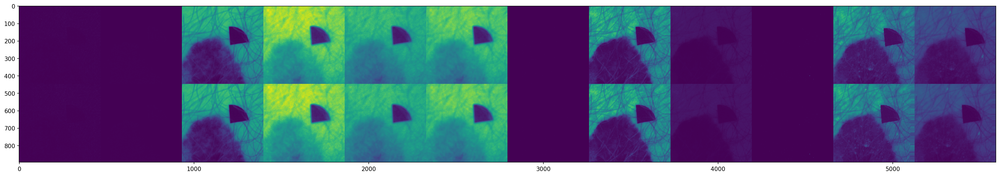

In [29]:
get_files_and_register(folder='/mnt/data/interim/_melanoma_20200728/checkyourskin/C43/2019-04-15_11-06-06')

In [30]:
def get_files_and_register(folder='/mnt/data/interim/_melanoma_20200728/checkyourskin/C43/2019-04-15_11-06-06'):
    files_dict, files_list = frames_matrix_from_images_folder(folder)
    registered_frames, cc_list, warp_matrix_list = register_frames_matrix(np.stack(files_list), number_of_iterations=500, warp_mode=cv2.MOTION_EUCLIDEAN)
    fig = plt.figure(figsize=(31,5), dpi=150)
    imshow(np.vstack((np.hstack(np.stack(files_list)), np.hstack(registered_frames))))

Error occured!
Error occured!
Error occured!



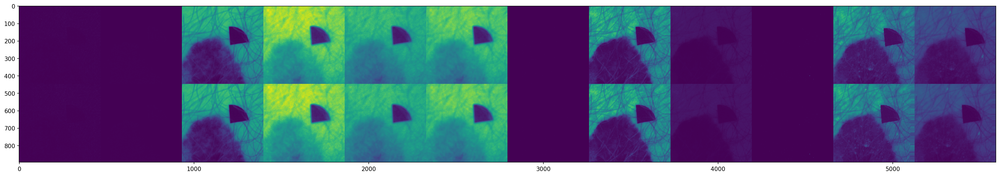

In [31]:
get_files_and_register(folder='/mnt/data/interim/_melanoma_20200728/checkyourskin/C43/2019-04-15_11-06-06')

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!



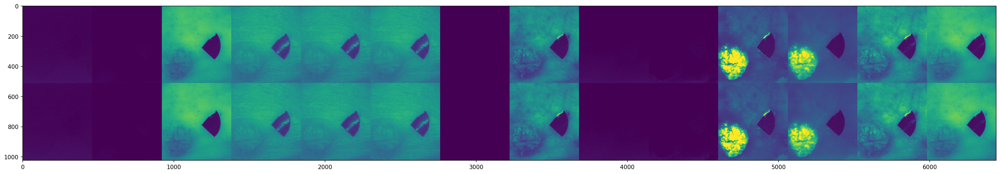

In [32]:
# BORDER_REPLICATE
get_files_and_register(folder='/mnt/data/interim/_melanoma_20200728/loc/B07.9/2019-08-21_10-59-37/')

In [42]:
get_files_and_register(folder='/mnt/data/interim/_melanoma_20200728/checkyourskin/C43/'+C43_folder[16])

NameError: name 'C43_folder' is not defined

# REGISTERING DATASET

In [45]:
def register_dataset(in_folder, out_folder):
    dataset_diagnozes = list(os.listdir(in_folder))
#     print(dataset_diagnozes)
    for diagnoze in dataset_diagnozes:
#         print(diagnoze)
        diagnoze_folders = list(os.listdir(os.path.join(in_folder, diagnoze)))
#         print(diagnoze_folders)
        for diagnoze_sample in diagnoze_folders:
            diagnoze_sample_path = os.path.join(in_folder, diagnoze, diagnoze_sample)
            print('diagnoze_sample_path -', diagnoze_sample_path)
            if True: #not os.path.isdir(diagnoze_sample_path.replace(in_folder, out_folder)):
                try:
                    files_dict, files_list = frames_matrix_from_images_folder(folder=diagnoze_sample_path)
                    frames_matrix = np.stack(files_list)
                    registered_frames, cc_list, warp_matrix_list = register_frames_matrix(frames_matrix, number_of_iterations=500, warp_mode=cv2.MOTION_EUCLIDEAN)
                    
        #             print('Frames registered ...')
                    for i in range(len(files_list)):
                        print('Looking for i={} frame'.format(i))
                        key = None #next((key for key, value in files_dict.items() if value[0] == files_list[i]), None)
                        orig_file_path = None
                        for k, value in files_dict.items():
                            if np.array_equal(value[0], files_list[i]):
                                key = k
                                orig_file_path = value[1]
                                break

                        print('key -', key)
                        
                        # now we have to recreate all folders
                        rf = registered_frames[i]
                        new_path = orig_file_path
                        new_path = new_path.replace(in_folder, out_folder)
                        new_path = os.path.join(os.path.dirname(os.path.dirname(new_path)), key, os.path.basename(orig_file_path))
                        os.makedirs(os.path.dirname(new_path), exist_ok = True)
                        print('  makedirs invoked for parent dir of {}'.format(new_path))
                        cv2.imwrite(new_path, rf)
#                         print('  cv image written..')
                        
                        # Let's save original images - because sometimes registraion produces really bad results and we will manually replace registered images with original ones
                        new_path_orig = os.path.join(os.path.dirname(os.path.dirname(new_path)), 'original', key, os.path.basename(orig_file_path))
                        os.makedirs(os.path.dirname(new_path_orig), exist_ok = True)
                        orig_img = frames_matrix_[i, :, :]
                        cv2.imwrite(new_path_orig, orig_img)

                    diagnostic_img_filepath = os.path.join(out_folder, diagnoze, diagnoze_sample, 'registration_diagnostic.png')
                    diagnostic_img = np.vstack((np.hstack(np.stack(files_list)), np.hstack(registered_frames)))
                    print('diagnostic_img_filepath -', diagnostic_img_filepath)
                    os.makedirs(os.path.dirname(diagnostic_img_filepath), exist_ok=True)
                    cv2.imwrite(diagnostic_img_filepath, diagnostic_img)
                except Exception as e:
                    print(e)
            else:
                print('    Already processed, skipping...')

In [52]:
files_dict_, files_list_ = frames_matrix_from_images_folder(folder='/mnt/data/interim/_melanoma_20200728/loc/benign/2019-11-29_10-57-23')
frames_matrix_ = np.stack(files_list_)
registered_frames_, cc_list_, warp_matrix_list_ = register_frames_matrix(frames_matrix, number_of_iterations=500, warp_mode=cv2.MOTION_EUCLIDEAN)

Error occured!
Error occured!
Error occured!



In [58]:
files_list_

[array([[ 8,  8,  7, ...,  4,  3,  4],
        [ 6,  5,  5, ...,  5,  3,  4],
        [ 4,  3,  5, ...,  8,  6,  4],
        ...,
        [18, 16, 16, ..., 24, 29, 31],
        [19, 20, 20, ..., 20, 22, 26],
        [21, 20, 22, ..., 20, 20, 24]], dtype=uint8),
 array([[ 0,  0,  0, ...,  0,  0,  0],
        [ 0,  0,  0, ...,  0,  0,  0],
        [ 0,  0,  0, ...,  0,  0,  0],
        ...,
        [ 8, 11,  5, ...,  0,  0,  0],
        [10,  8,  3, ...,  2,  2,  0],
        [10,  8,  3, ...,  2,  2,  0]], dtype=uint8),
 array([[147, 148, 149, ..., 181, 181, 181],
        [145, 147, 148, ..., 182, 183, 183],
        [145, 146, 147, ..., 182, 182, 182],
        ...,
        [174, 176, 178, ..., 190, 191, 191],
        [173, 175, 177, ..., 189, 191, 192],
        [173, 175, 177, ..., 189, 191, 192]], dtype=uint8),
 array([[123, 121, 123, ..., 151, 150, 150],
        [123, 122, 125, ..., 151, 150, 147],
        [124, 126, 128, ..., 150, 147, 147],
        ...,
        [145, 143, 144, ..., 1

In [57]:
files_dict_

{'r-b': (array([[ 8,  8,  7, ...,  4,  3,  4],
         [ 6,  5,  5, ...,  5,  3,  4],
         [ 4,  3,  5, ...,  8,  6,  4],
         ...,
         [18, 16, 16, ..., 24, 29, 31],
         [19, 20, 20, ..., 20, 22, 26],
         [21, 20, 22, ..., 20, 20, 24]], dtype=uint8),
  '/mnt/data/interim/_melanoma_20200728/loc/benign/2019-11-29_10-57-23/r/R_2ms.png'),
 'r-g': (array([[ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         ...,
         [ 8, 11,  5, ...,  0,  0,  0],
         [10,  8,  3, ...,  2,  2,  0],
         [10,  8,  3, ...,  2,  2,  0]], dtype=uint8),
  '/mnt/data/interim/_melanoma_20200728/loc/benign/2019-11-29_10-57-23/r/R_2ms.png'),
 'r-r': (array([[147, 148, 149, ..., 181, 181, 181],
         [145, 147, 148, ..., 182, 183, 183],
         [145, 146, 147, ..., 182, 182, 182],
         ...,
         [174, 176, 178, ..., 190, 191, 191],
         [173, 175, 177, ..., 189, 191, 192],
         [173, 175, 177, 

In [36]:
register_dataset(in_folder='/mnt/data/interim/_melanoma_20200728/checkyourskin', out_folder='/mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin')

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L92/2019-03-18_10-20-29


Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L92/2019-03-18_10-20-29/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L92/2019-03-18_10-20-29/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L92/2019-03-18_10-20-29/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L92/2019-03-18_10-20-29/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L92/2019-03-18_10-20-29/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L92/2019-03-18_10-12-14/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L92/2019-03-18_10-12-14/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L92/2019-03-18_10-12-14/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L92/2019-03-18_10-12-14/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L92/2019-03-18_10-12-14/ir-g/IR.png
key - ir-r
  makedirs invoked for pare

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L92/2019-03-18_10-10-35/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L92/2019-03-18_10-10-35/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L92/2019-03-18_10-10-35/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L92/2019-03-18_10-10-35/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L92/2019-03-18_10-10-35/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L92/2019-03-18_10-16-25/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L92/2019-03-18_10-16-25/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L92/2019-03-18_10-16-25/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L92/2019-03-18_10-16-25/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L92/2019-03-18_10-16-25/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L92/2019-03-18_10-18-30/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L92/2019-03-18_10-18-30/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L92/2019-03-18_10-18-30/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L92/2019-03-18_10-18-30/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L92/2019-03-18_10-18-30/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L92/2019-03-18_10-14-54/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L92/2019-03-18_10-14-54/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L92/2019-03-18_10-14-54/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L92/2019-03-18_10-14-54/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L92/2019-03-18_10-14-54/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-02-05_11-53-28/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-02-05_11-53-28/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-02-05_11-53-28/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-02-05_11-53-28/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-02-05_11-53-28/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-03-29_10-16-36/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-03-29_10-16-36/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-03-29_10-16-36/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-03-29_10-16-36/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-03-29_10-16-36/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-02-12_11-41-26/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-02-12_11-41-26/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-02-12_11-41-26/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-02-12_11-41-26/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-02-12_11-41-26/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-02-05_11-54-33/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-02-05_11-54-33/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-02-05_11-54-33/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-02-05_11-54-33/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-02-05_11-54-33/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-02-05_11-50-08/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-02-05_11-50-08/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-02-05_11-50-08/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-02-05_11-50-08/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-02-05_11-50-08/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-04-11_09-53-42/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-04-11_09-53-42/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-04-11_09-53-42/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-04-11_09-53-42/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-04-11_09-53-42/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-02-05_11-51-01/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-02-05_11-51-01/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-02-05_11-51-01/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-02-05_11-51-01/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-02-05_11-51-01/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-03-28_10-15-08/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-03-28_10-15-08/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-03-28_10-15-08/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-03-28_10-15-08/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-03-28_10-15-08/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-01-30_11-09-50/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-01-30_11-09-50/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-01-30_11-09-50/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-01-30_11-09-50/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-01-30_11-09-50/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-01-21_10-53-00/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-01-21_10-53-00/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-01-21_10-53-00/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-01-21_10-53-00/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-01-21_10-53-00/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-01-30_11-34-39/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-01-30_11-34-39/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-01-30_11-34-39/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-01-30_11-34-39/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-01-30_11-34-39/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-03-05_12-39-29/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-03-05_12-39-29/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-03-05_12-39-29/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-03-05_12-39-29/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-03-05_12-39-29/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-04-01_11-23-46/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-04-01_11-23-46/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-04-01_11-23-46/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-04-01_11-23-46/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-04-01_11-23-46/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-01-23_12-34-41/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-01-23_12-34-41/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-01-23_12-34-41/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-01-23_12-34-41/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-01-23_12-34-41/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-03-28_11-50-18/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-03-28_11-50-18/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-03-28_11-50-18/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-03-28_11-50-18/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-03-28_11-50-18/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-02-05_11-49-04/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-02-05_11-49-04/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-02-05_11-49-04/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-02-05_11-49-04/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-02-05_11-49-04/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-03-05_11-42-58/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-03-05_11-42-58/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-03-05_11-42-58/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-03-05_11-42-58/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-03-05_11-42-58/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-01-23_12-36-01/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-01-23_12-36-01/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-01-23_12-36-01/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-01-23_12-36-01/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-01-23_12-36-01/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-04-01_11-48-30/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-04-01_11-48-30/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-04-01_11-48-30/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-04-01_11-48-30/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-04-01_11-48-30/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-02-05_11-47-58/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-02-05_11-47-58/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-02-05_11-47-58/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-02-05_11-47-58/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-02-05_11-47-58/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-03-28_11-19-36/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-03-28_11-19-36/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-03-28_11-19-36/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-03-28_11-19-36/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-03-28_11-19-36/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-02-05_11-52-21/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-02-05_11-52-21/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-02-05_11-52-21/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-02-05_11-52-21/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D48/2019-02-05_11-52-21/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L85.5/2019-03-11_11-45-07/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L85.5/2019-03-11_11-45-07/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L85.5/2019-03-11_11-45-07/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L85.5/2019-03-11_11-45-07/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L85.5/2019-03-11_11-45-07/ir-g/IR.png
key - ir-r
  makedirs invoked for parent di

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L85.5/2019-02-06_11-51-40/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L85.5/2019-02-06_11-51-40/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L85.5/2019-02-06_11-51-40/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L85.5/2019-02-06_11-51-40/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L85.5/2019-02-06_11-51-40/ir-g/IR.png
key - ir-r
  makedirs invoked for parent di

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D03.9/2019-02-18_11-01-45/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D03.9/2019-02-18_11-01-45/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D03.9/2019-02-18_11-01-45/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D03.9/2019-02-18_11-01-45/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D03.9/2019-02-18_11-01-45/ir-g/IR.png
key - ir-r
  makedirs invoked for parent di

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D03.9/2019-02-21_11-31-30/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D03.9/2019-02-21_11-31-30/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D03.9/2019-02-21_11-31-30/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D03.9/2019-02-21_11-31-30/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D03.9/2019-02-21_11-31-30/ir-g/IR.png
key - ir-r
  makedirs invoked for parent di

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D03.9/2019-02-12_11-59-27/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D03.9/2019-02-12_11-59-27/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D03.9/2019-02-12_11-59-27/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D03.9/2019-02-12_11-59-27/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D03.9/2019-02-12_11-59-27/ir-g/IR.png
key - ir-r
  makedirs invoked for parent di

Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D03.9/2019-02-12_11-57-13/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D03.9/2019-02-12_11-57-13/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D03.9/2019-02-12_11-57-13/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D03.9/2019-02-12_11-57-13/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D03.9/2019-02-12_11-57-13/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/data/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-12_09-19-27/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-12_09-19-27/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-12_09-19-27/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-12_09-19-27/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-12_09-19-27/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-11_10-46-02/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-11_10-46-02/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-11_10-46-02/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-11_10-46-02/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-11_10-46-02/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-04-11_12-04-41/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-04-11_12-04-41/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-04-11_12-04-41/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-04-11_12-04-41/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-04-11_12-04-41/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-04-12_10-45-44/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-04-12_10-45-44/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-04-12_10-45-44/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-04-12_10-45-44/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-04-12_10-45-44/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-01_10-22-56/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-01_10-22-56/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-01_10-22-56/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-01_10-22-56/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-01_10-22-56/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-25_10-31-10/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-25_10-31-10/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-25_10-31-10/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-25_10-31-10/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-25_10-31-10/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-18_10-55-25/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-18_10-55-25/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-18_10-55-25/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-18_10-55-25/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-18_10-55-25/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-06_11-05-40/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-06_11-05-40/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-06_11-05-40/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-06_11-05-40/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-06_11-05-40/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-28_10-10-46/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-28_10-10-46/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-28_10-10-46/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-28_10-10-46/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-28_10-10-46/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-12_12-14-56/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-12_12-14-56/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-12_12-14-56/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-12_12-14-56/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-12_12-14-56/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-06_11-59-11/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-06_11-59-11/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-06_11-59-11/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-06_11-59-11/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-06_11-59-11/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-23_11-46-19/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-23_11-46-19/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-23_11-46-19/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-23_11-46-19/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-23_11-46-19/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-11_10-47-46/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-11_10-47-46/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-11_10-47-46/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-11_10-47-46/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-11_10-47-46/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-22_18-16-52/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-22_18-16-52/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-22_18-16-52/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-22_18-16-52/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-22_18-16-52/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-11_11-12-15/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-11_11-12-15/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-11_11-12-15/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-11_11-12-15/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-11_11-12-15/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-11_10-48-53/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-11_10-48-53/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-11_10-48-53/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-11_10-48-53/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-11_10-48-53/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-25_10-29-38/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-25_10-29-38/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-25_10-29-38/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-25_10-29-38/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-25_10-29-38/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-22_18-14-41/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-22_18-14-41/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-22_18-14-41/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-22_18-14-41/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-22_18-14-41/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-08_10-18-55/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-08_10-18-55/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-08_10-18-55/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-08_10-18-55/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-08_10-18-55/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-04-11_09-59-01/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-04-11_09-59-01/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-04-11_09-59-01/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-04-11_09-59-01/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-04-11_09-59-01/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-30_10-13-45/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-30_10-13-45/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-30_10-13-45/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-30_10-13-45/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-30_10-13-45/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-12_11-42-25/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-12_11-42-25/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-12_11-42-25/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-12_11-42-25/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-12_11-42-25/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-06_12-08-47/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-06_12-08-47/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-06_12-08-47/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-06_12-08-47/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-06_12-08-47/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-21_11-29-30/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-21_11-29-30/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-21_11-29-30/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-21_11-29-30/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-21_11-29-30/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-23_11-44-37/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-23_11-44-37/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-23_11-44-37/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-23_11-44-37/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-23_11-44-37/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-12_12-17-31/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-12_12-17-31/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-12_12-17-31/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-12_12-17-31/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-12_12-17-31/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-25_11-53-43/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-25_11-53-43/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-25_11-53-43/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-25_11-53-43/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-25_11-53-43/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-21_11-48-08/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-21_11-48-08/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-21_11-48-08/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-21_11-48-08/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-21_11-48-08/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-04-09_10-01-09/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-04-09_10-01-09/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-04-09_10-01-09/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-04-09_10-01-09/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-04-09_10-01-09/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-06_12-02-24/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-06_12-02-24/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-06_12-02-24/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-06_12-02-24/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-06_12-02-24/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-22_18-12-21/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-22_18-12-21/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-22_18-12-21/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-22_18-12-21/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-22_18-12-21/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-06_10-36-07/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-06_10-36-07/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-06_10-36-07/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-06_10-36-07/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-06_10-36-07/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-22_10-17-50/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-22_10-17-50/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-22_10-17-50/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-22_10-17-50/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-22_10-17-50/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-04_09-55-56/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-04_09-55-56/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-04_09-55-56/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-04_09-55-56/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-04_09-55-56/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-06_11-19-15/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-06_11-19-15/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-06_11-19-15/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-06_11-19-15/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-06_11-19-15/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-30_10-22-58/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-30_10-22-58/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-30_10-22-58/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-30_10-22-58/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-30_10-22-58/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-06_09-51-08/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-06_09-51-08/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-06_09-51-08/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-06_09-51-08/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-06_09-51-08/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-25_10-15-16/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-25_10-15-16/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-25_10-15-16/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-25_10-15-16/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-25_10-15-16/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-25_11-54-49/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-25_11-54-49/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-25_11-54-49/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-25_11-54-49/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-25_11-54-49/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-04-11_09-57-54/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-04-11_09-57-54/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-04-11_09-57-54/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-04-11_09-57-54/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-04-11_09-57-54/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-22_18-13-18/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-22_18-13-18/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-22_18-13-18/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-22_18-13-18/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-22_18-13-18/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-06_12-07-01/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-06_12-07-01/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-06_12-07-01/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-06_12-07-01/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-06_12-07-01/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-18_10-27-48/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-18_10-27-48/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-18_10-27-48/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-18_10-27-48/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-18_10-27-48/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-04-02_10-26-34/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-04-02_10-26-34/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-04-02_10-26-34/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-04-02_10-26-34/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-04-02_10-26-34/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-25_11-00-40/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-25_11-00-40/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-25_11-00-40/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-25_11-00-40/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-01-25_11-00-40/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-05_11-44-51/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-05_11-44-51/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-05_11-44-51/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-05_11-44-51/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-05_11-44-51/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-11_11-17-52/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-11_11-17-52/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-11_11-17-52/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-11_11-17-52/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-11_11-17-52/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-04_09-57-26/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-04_09-57-26/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-04_09-57-26/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-04_09-57-26/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-03-04_09-57-26/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-06_11-57-14/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-06_11-57-14/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-06_11-57-14/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-06_11-57-14/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-06_11-57-14/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-27_12-09-59/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-27_12-09-59/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-27_12-09-59/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-27_12-09-59/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D22/2019-02-27_12-09-59/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Rm/2019-03-11_12-05-42/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Rm/2019-03-11_12-05-42/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Rm/2019-03-11_12-05-42/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Rm/2019-03-11_12-05-42/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Rm/2019-03-11_12-05-42/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/data/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Rm/2019-03-11_12-04-05/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Rm/2019-03-11_12-04-05/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Rm/2019-03-11_12-04-05/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Rm/2019-03-11_12-04-05/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Rm/2019-03-11_12-04-05/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/data/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Rm/2019-03-11_12-07-35/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Rm/2019-03-11_12-07-35/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Rm/2019-03-11_12-07-35/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Rm/2019-03-11_12-07-35/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Rm/2019-03-11_12-07-35/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/data/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Rm/2019-02-11_10-45-01/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Rm/2019-02-11_10-45-01/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Rm/2019-02-11_10-45-01/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Rm/2019-02-11_10-45-01/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Rm/2019-02-11_10-45-01/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/data/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-04-09_10-30-42/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-04-09_10-30-42/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-04-09_10-30-42/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-04-09_10-30-42/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-04-09_10-30-42/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-03-05_13-10-05/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-03-05_13-10-05/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-03-05_13-10-05/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-03-05_13-10-05/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-03-05_13-10-05/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-01-24_11-53-39/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-01-24_11-53-39/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-01-24_11-53-39/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-01-24_11-53-39/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-01-24_11-53-39/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-04-09_10-31-35/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-04-09_10-31-35/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-04-09_10-31-35/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-04-09_10-31-35/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-04-09_10-31-35/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/data/interim/_m

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-01-23_12-16-23/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-01-23_12-16-23/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-01-23_12-16-23/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-01-23_12-16-23/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-01-23_12-16-23/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-01-30_12-22-17/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-01-30_12-22-17/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-01-30_12-22-17/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-01-30_12-22-17/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-01-30_12-22-17/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-03-04_10-45-54/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-03-04_10-45-54/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-03-04_10-45-54/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-03-04_10-45-54/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-03-04_10-45-54/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-01-23_12-19-00/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-01-23_12-19-00/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-01-23_12-19-00/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-01-23_12-19-00/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-01-23_12-19-00/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-02-06_11-49-50/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-02-06_11-49-50/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-02-06_11-49-50/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-02-06_11-49-50/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L57/2019-02-06_11-49-50/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D21.9/2019-04-12_10-28-04/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D21.9/2019-04-12_10-28-04/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D21.9/2019-04-12_10-28-04/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D21.9/2019-04-12_10-28-04/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D21.9/2019-04-12_10-28-04/ir-g/IR.png
key - ir-r
  makedirs invoked for parent di

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D21.9/2019-04-12_10-23-22/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D21.9/2019-04-12_10-23-22/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D21.9/2019-04-12_10-23-22/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D21.9/2019-04-12_10-23-22/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D21.9/2019-04-12_10-23-22/ir-g/IR.png
key - ir-r
  makedirs invoked for parent di

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D21.9/2019-04-12_10-29-44/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D21.9/2019-04-12_10-29-44/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D21.9/2019-04-12_10-29-44/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D21.9/2019-04-12_10-29-44/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D21.9/2019-04-12_10-29-44/ir-g/IR.png
key - ir-r
  makedirs invoked for parent di

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D21.9/2019-04-12_10-24-53/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D21.9/2019-04-12_10-24-53/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D21.9/2019-04-12_10-24-53/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D21.9/2019-04-12_10-24-53/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D21.9/2019-04-12_10-24-53/ir-g/IR.png
key - ir-r
  makedirs invoked for parent di

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D21.9/2019-04-12_10-26-39/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D21.9/2019-04-12_10-26-39/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D21.9/2019-04-12_10-26-39/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D21.9/2019-04-12_10-26-39/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D21.9/2019-04-12_10-26-39/ir-g/IR.png
key - ir-r
  makedirs invoked for parent di

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-05_12-38-06/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-05_12-38-06/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-05_12-38-06/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-05_12-38-06/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-05_12-38-06/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-47-48/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-47-48/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-47-48/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-47-48/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-47-48/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-01_10-27-44/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-01_10-27-44/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-01_10-27-44/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-01_10-27-44/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-01_10-27-44/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_11-13-14/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_11-13-14/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_11-13-14/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_11-13-14/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_11-13-14/ir-g/IR.png
key - ir-r
  makedirs i


key - uv-0-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-10_11-04-35/uv-0-b/16.png
key - uv-0-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-10_11-04-35/uv-0-g/16.png
key - uv-0-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-10_11-04-35/uv-0-r/16.png
diagnostic_img_filepath - /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-10_11-04-35/registration_diagnostic.png
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-02-14_10-19-07


Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-14_10-19-07/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-14_10-19-07/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-14_10-19-07/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-14_10-19-07/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-14_10-19-07/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-30_12-20-47/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-30_12-20-47/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-30_12-20-47/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-30_12-20-47/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-30_12-20-47/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-10_11-23-01/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-10_11-23-01/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-10_11-23-01/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-10_11-23-01/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-10_11-23-01/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_11-30-43/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_11-30-43/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_11-30-43/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_11-30-43/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_11-30-43/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-49-01/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-49-01/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-49-01/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-49-01/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-49-01/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-51-19/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-51-19/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-51-19/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-51-19/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-51-19/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-02_10-39-10/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-02_10-39-10/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-02_10-39-10/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-02_10-39-10/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-02_10-39-10/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-18_11-19-46/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-18_11-19-46/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-18_11-19-46/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-18_11-19-46/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-18_11-19-46/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-02_10-37-34/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-02_10-37-34/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-02_10-37-34/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-02_10-37-34/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-02_10-37-34/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-11_11-38-08/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-11_11-38-08/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-11_11-38-08/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-11_11-38-08/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-11_11-38-08/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-21_10-56-30/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-21_10-56-30/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-21_10-56-30/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-21_10-56-30/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-21_10-56-30/ir-g/IR.png
key - ir

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-41-49/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-41-49/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-41-49/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-41-49/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-41-49/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_2020072

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_12-12-46/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_12-12-46/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_12-12-46/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_12-12-46/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_12-12-46/ir-g/IR.png
key - ir-r
  makedirs i

Error occured!
Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-06_11-32-34/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-06_11-32-34/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-06_11-32-34/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-06_11-32-34/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-06_11-32-34/ir-g/IR.png
key - ir-r
  makedirs invoked for pare

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-11_10-59-57/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-11_10-59-57/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-11_10-59-57/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-11_10-59-57/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-11_10-59-57/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-02_10-36-37/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-02_10-36-37/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-02_10-36-37/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-02_10-36-37/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-02_10-36-37/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-21_10-48-09/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-21_10-48-09/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-21_10-48-09/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-21_10-48-09/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-21_10-48-09/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-46-40/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-46-40/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-46-40/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-46-40/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-46-40/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_11-07-51/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_11-07-51/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_11-07-51/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_11-07-51/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_11-07-51/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-36-31/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-36-31/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-36-31/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-36-31/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-36-31/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_13-16-46/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_13-16-46/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_13-16-46/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_13-16-46/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_13-16-46/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-34-24/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-34-24/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-34-24/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-34-24/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-34-24/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-22_10-21-43/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-22_10-21-43/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-22_10-21-43/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-22_10-21-43/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-22_10-21-43/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-11_11-35-39/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-11_11-35-39/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-11_11-35-39/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-11_11-35-39/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-11_11-35-39/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-22_11-44-32/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-22_11-44-32/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-22_11-44-32/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-22_11-44-32/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-22_11-44-32/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-44-49/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-44-49/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-44-49/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-44-49/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-44-49/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_11-28-33/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_11-28-33/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_11-28-33/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_11-28-33/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_11-28-33/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-21_11-57-36/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-21_11-57-36/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-21_11-57-36/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-21_11-57-36/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-21_11-57-36/ir-g/IR.png
key - ir-r
  makedirs i

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-26_12-10-12/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-26_12-10-12/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-26_12-10-12/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-26_12-10-12/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-26_12-10-12/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_11-29-27/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_11-29-27/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_11-29-27/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_11-29-27/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_11-29-27/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-43-50/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-43-50/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-43-50/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-43-50/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-43-50/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-14_09-58-33/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-14_09-58-33/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-14_09-58-33/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-14_09-58-33/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-14_09-58-33/ir-g/IR.png
key - ir-r
  makedirs i

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-07_11-53-05/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-07_11-53-05/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-07_11-53-05/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-07_11-53-05/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-07_11-53-05/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-38-30/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-38-30/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-38-30/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-38-30/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-38-30/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-40-41/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-40-41/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-40-41/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-40-41/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-40-41/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-11_11-01-35/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-11_11-01-35/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-11_11-01-35/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-11_11-01-35/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-11_11-01-35/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-22_10-02-50/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-22_10-02-50/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-22_10-02-50/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-22_10-02-50/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-22_10-02-50/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-11_11-03-10/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-11_11-03-10/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-11_11-03-10/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-11_11-03-10/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-11_11-03-10/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-42-20/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-42-20/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-42-20/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-42-20/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-42-20/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-30_12-24-05/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-30_12-24-05/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-30_12-24-05/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-30_12-24-05/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-30_12-24-05/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-08_10-26-17/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-08_10-26-17/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-08_10-26-17/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-08_10-26-17/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-08_10-26-17/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_13-12-32/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_13-12-32/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_13-12-32/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_13-12-32/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_13-12-32/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_10-29-39/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_10-29-39/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_10-29-39/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_10-29-39/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_10-29-39/ir-g/IR.png
key - ir-r
  makedirs i

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-53-01/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-53-01/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-53-01/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-53-01/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-53-01/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-10_11-06-21/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-10_11-06-21/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-10_11-06-21/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-10_11-06-21/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-10_11-06-21/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_11-11-22/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_11-11-22/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_11-11-22/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_11-11-22/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_11-11-22/ir-g/IR.png
key - ir

Error occured!
Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-49-03/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-49-03/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-49-03/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-49-03/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-49-03/ir-g/IR.png
key - ir-r
  makedirs invoked for pare

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-25_11-01-49/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-25_11-01-49/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-25_11-01-49/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-25_11-01-49/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-25_11-01-49/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-01_11-15-41/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-01_11-15-41/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-01_11-15-41/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-01_11-15-41/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-01_11-15-41/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-06_11-46-32/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-06_11-46-32/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-06_11-46-32/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-06_11-46-32/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-06_11-46-32/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-25_10-27-08/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-25_10-27-08/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-25_10-27-08/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-25_10-27-08/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-25_10-27-08/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-44-08/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-44-08/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-44-08/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-44-08/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-44-08/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-30_12-34-10/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-30_12-34-10/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-30_12-34-10/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-30_12-34-10/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-30_12-34-10/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-22_10-04-28/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-22_10-04-28/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-22_10-04-28/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-22_10-04-28/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-22_10-04-28/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-14_10-16-25/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-14_10-16-25/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-14_10-16-25/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-14_10-16-25/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-14_10-16-25/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_11-48-07/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_11-48-07/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_11-48-07/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_11-48-07/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_11-48-07/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-30_12-19-35/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-30_12-19-35/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-30_12-19-35/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-30_12-19-35/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-30_12-19-35/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-18_10-27-03/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-18_10-27-03/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-18_10-27-03/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-18_10-27-03/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-18_10-27-03/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-49-52/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-49-52/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-49-52/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-49-52/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-49-52/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-21_11-35-42/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-21_11-35-42/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-21_11-35-42/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-21_11-35-42/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-21_11-35-42/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-07_10-53-41/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-07_10-53-41/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-07_10-53-41/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-07_10-53-41/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-07_10-53-41/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-42-49/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-42-49/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-42-49/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-42-49/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-42-49/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-30_10-54-21/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-30_10-54-21/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-30_10-54-21/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-30_10-54-21/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-30_10-54-21/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-05_12-11-20/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-05_12-11-20/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-05_12-11-20/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-05_12-11-20/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-05_12-11-20/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-54-28/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-54-28/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-54-28/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-54-28/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-54-28/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-56-39/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-56-39/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-56-39/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-56-39/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-56-39/ir-g/IR.png
key - ir-r
  makedirs invoked for pare

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-02_10-40-03/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-02_10-40-03/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-02_10-40-03/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-02_10-40-03/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-04-02_10-40-03/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-58-32/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-58-32/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-58-32/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-58-32/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-58-32/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-21_11-18-41/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-21_11-18-41/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-21_11-18-41/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-21_11-18-41/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-01-21_11-18-41/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-46-18/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-46-18/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-46-18/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-46-18/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-46-18/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_11-27-37/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_11-27-37/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_11-27-37/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_11-27-37/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_11-27-37/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/data/interim/_m

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-40-25/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-40-25/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-40-25/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-40-25/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-25_09-40-25/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-39-36/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-39-36/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-39-36/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-39-36/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-03-20_12-39-36/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_10-31-03/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_10-31-03/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_10-31-03/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_10-31-03/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C44/2019-02-12_10-31-03/ir-g/IR.png
key - ir

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q80/2019-03-20_14-38-19/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q80/2019-03-20_14-38-19/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q80/2019-03-20_14-38-19/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q80/2019-03-20_14-38-19/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q80/2019-03-20_14-38-19/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q80/2019-03-20_14-40-28/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q80/2019-03-20_14-40-28/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q80/2019-03-20_14-40-28/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q80/2019-03-20_14-40-28/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q80/2019-03-20_14-40-28/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q80/2019-03-20_14-42-16/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q80/2019-03-20_14-42-16/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q80/2019-03-20_14-42-16/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q80/2019-03-20_14-42-16/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q80/2019-03-20_14-42-16/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q80/2019-03-20_14-44-39/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q80/2019-03-20_14-44-39/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q80/2019-03-20_14-44-39/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q80/2019-03-20_14-44-39/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q80/2019-03-20_14-44-39/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q80/2019-03-20_14-36-39/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q80/2019-03-20_14-36-39/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q80/2019-03-20_14-36-39/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q80/2019-03-20_14-36-39/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q80/2019-03-20_14-36-39/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q80/2019-03-20_14-46-13/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q80/2019-03-20_14-46-13/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q80/2019-03-20_14-46-13/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q80/2019-03-20_14-46-13/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q80/2019-03-20_14-46-13/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L72/2019-04-08_11-54-01/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L72/2019-04-08_11-54-01/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L72/2019-04-08_11-54-01/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L72/2019-04-08_11-54-01/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L72/2019-04-08_11-54-01/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L80/2019-04-12_13-00-13/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L80/2019-04-12_13-00-13/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L80/2019-04-12_13-00-13/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L80/2019-04-12_13-00-13/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L80/2019-04-12_13-00-13/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D09/2019-02-11_11-02-58/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D09/2019-02-11_11-02-58/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D09/2019-02-11_11-02-58/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D09/2019-02-11_11-02-58/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D09/2019-02-11_11-02-58/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D09/2019-02-11_11-04-11/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D09/2019-02-11_11-04-11/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D09/2019-02-11_11-04-11/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D09/2019-02-11_11-04-11/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D09/2019-02-11_11-04-11/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D09/2019-02-11_11-00-38/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D09/2019-02-11_11-00-38/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D09/2019-02-11_11-00-38/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D09/2019-02-11_11-00-38/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D09/2019-02-11_11-00-38/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D09/2019-02-12_10-54-17/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D09/2019-02-12_10-54-17/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D09/2019-02-12_10-54-17/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D09/2019-02-12_10-54-17/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D09/2019-02-12_10-54-17/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D09/2019-02-12_10-56-58/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D09/2019-02-12_10-56-58/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D09/2019-02-12_10-56-58/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D09/2019-02-12_10-56-58/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D09/2019-02-12_10-56-58/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D09/2019-02-12_10-55-32/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D09/2019-02-12_10-55-32/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D09/2019-02-12_10-55-32/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D09/2019-02-12_10-55-32/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D09/2019-02-12_10-55-32/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L81.4/2019-01-23_11-26-11/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L81.4/2019-01-23_11-26-11/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L81.4/2019-01-23_11-26-11/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L81.4/2019-01-23_11-26-11/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L81.4/2019-01-23_11-26-11/ir-g/IR.png
key - ir-r
  makedirs invoked for parent di

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L81.4/2019-03-11_11-24-00/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L81.4/2019-03-11_11-24-00/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L81.4/2019-03-11_11-24-00/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L81.4/2019-03-11_11-24-00/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L81.4/2019-03-11_11-24-00/ir-g/IR.png
key - ir-r
  makedirs invoked for parent di

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L81.4/2019-01-21_11-34-02/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L81.4/2019-01-21_11-34-02/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L81.4/2019-01-21_11-34-02/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L81.4/2019-01-21_11-34-02/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L81.4/2019-01-21_11-34-02/ir-g/IR.png
key - ir-r
  makedirs invoked for parent di

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L81.4/2019-02-05_12-04-32/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L81.4/2019-02-05_12-04-32/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L81.4/2019-02-05_12-04-32/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L81.4/2019-02-05_12-04-32/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L81.4/2019-02-05_12-04-32/ir-g/IR.png
key - ir-r
  makedirs invoked for parent di

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L81.4/2019-04-15_13-36-23/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L81.4/2019-04-15_13-36-23/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L81.4/2019-04-15_13-36-23/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L81.4/2019-04-15_13-36-23/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L81.4/2019-04-15_13-36-23/ir-g/IR.png
key - ir-r
  makedirs invoked for parent di

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L81.4/2019-01-21_11-27-55/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L81.4/2019-01-21_11-27-55/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L81.4/2019-01-21_11-27-55/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L81.4/2019-01-21_11-27-55/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L81.4/2019-01-21_11-27-55/ir-g/IR.png
key - ir-r
  makedirs invoked for parent di

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L81.4/2019-03-05_11-27-48/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L81.4/2019-03-05_11-27-48/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L81.4/2019-03-05_11-27-48/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L81.4/2019-03-05_11-27-48/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L81.4/2019-03-05_11-27-48/ir-g/IR.png
key - ir-r
  makedirs invoked for parent di

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D18/2019-01-25_13-14-13/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D18/2019-01-25_13-14-13/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D18/2019-01-25_13-14-13/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D18/2019-01-25_13-14-13/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D18/2019-01-25_13-14-13/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D18/2019-01-25_13-02-39/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D18/2019-01-25_13-02-39/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D18/2019-01-25_13-02-39/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D18/2019-01-25_13-02-39/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D18/2019-01-25_13-02-39/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D18/2019-01-22_10-07-25/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D18/2019-01-22_10-07-25/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D18/2019-01-22_10-07-25/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D18/2019-01-22_10-07-25/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D18/2019-01-22_10-07-25/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D18/2019-01-25_13-01-41/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D18/2019-01-25_13-01-41/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D18/2019-01-25_13-01-41/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D18/2019-01-25_13-01-41/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D18/2019-01-25_13-01-41/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D18/2019-03-22_12-46-54/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D18/2019-03-22_12-46-54/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D18/2019-03-22_12-46-54/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D18/2019-03-22_12-46-54/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D18/2019-03-22_12-46-54/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D18/2019-01-25_13-15-54/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D18/2019-01-25_13-15-54/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D18/2019-01-25_13-15-54/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D18/2019-01-25_13-15-54/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D18/2019-01-25_13-15-54/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L72.3/2019-01-30_11-48-40/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L72.3/2019-01-30_11-48-40/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L72.3/2019-01-30_11-48-40/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L72.3/2019-01-30_11-48-40/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L72.3/2019-01-30_11-48-40/ir-g/IR.png
key - ir-r
  makedirs invoked for parent di

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/A63/2019-03-25_11-39-21/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/A63/2019-03-25_11-39-21/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/A63/2019-03-25_11-39-21/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/A63/2019-03-25_11-39-21/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/A63/2019-03-25_11-39-21/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/A63/2019-03-27_13-14-20/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/A63/2019-03-27_13-14-20/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/A63/2019-03-27_13-14-20/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/A63/2019-03-27_13-14-20/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/A63/2019-03-27_13-14-20/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/A63/2019-03-25_11-41-13/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/A63/2019-03-25_11-41-13/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/A63/2019-03-25_11-41-13/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/A63/2019-03-25_11-41-13/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/A63/2019-03-25_11-41-13/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/A63/2019-03-27_13-13-24/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/A63/2019-03-27_13-13-24/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/A63/2019-03-27_13-13-24/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/A63/2019-03-27_13-13-24/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/A63/2019-03-27_13-13-24/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/A63/2019-03-25_11-40-13/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/A63/2019-03-25_11-40-13/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/A63/2019-03-25_11-40-13/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/A63/2019-03-25_11-40-13/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/A63/2019-03-25_11-40-13/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/A63/2019-03-27_13-15-16/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/A63/2019-03-27_13-15-16/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/A63/2019-03-27_13-15-16/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/A63/2019-03-27_13-15-16/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/A63/2019-03-27_13-15-16/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-30_10-32-39/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-30_10-32-39/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-30_10-32-39/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-30_10-32-39/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-30_10-32-39/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-01_10-12-58/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-01_10-12-58/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-01_10-12-58/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-01_10-12-58/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-01_10-12-58/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-23_13-30-47/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-23_13-30-47/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-23_13-30-47/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-23_13-30-47/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-23_13-30-47/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-23_13-29-19/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-23_13-29-19/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-23_13-29-19/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-23_13-29-19/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-23_13-29-19/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-30_10-33-57/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-30_10-33-57/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-30_10-33-57/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-30_10-33-57/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-30_10-33-57/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-03-28_12-08-55/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-03-28_12-08-55/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-03-28_12-08-55/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-03-28_12-08-55/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-03-28_12-08-55/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-02-21_10-46-47/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-02-21_10-46-47/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-02-21_10-46-47/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-02-21_10-46-47/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-02-21_10-46-47/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/data/interim/_m

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-03-28_12-10-12/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-03-28_12-10-12/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-03-28_12-10-12/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-03-28_12-10-12/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-03-28_12-10-12/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-01_10-09-58/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-01_10-09-58/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-01_10-09-58/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-01_10-09-58/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-01_10-09-58/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/data/interim/_m

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-15_10-22-09/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-15_10-22-09/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-15_10-22-09/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-15_10-22-09/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-15_10-22-09/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-02-26_12-19-24/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-02-26_12-19-24/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-02-26_12-19-24/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-02-26_12-19-24/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-02-26_12-19-24/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-30_10-12-03/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-30_10-12-03/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-30_10-12-03/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-30_10-12-03/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-30_10-12-03/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-03-28_12-07-47/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-03-28_12-07-47/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-03-28_12-07-47/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-03-28_12-07-47/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-03-28_12-07-47/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-11_10-53-32/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-11_10-53-32/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-11_10-53-32/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-11_10-53-32/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-11_10-53-32/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-25_10-13-58/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-25_10-13-58/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-25_10-13-58/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-25_10-13-58/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-25_10-13-58/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-15_11-05-11/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-15_11-05-11/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-15_11-05-11/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-15_11-05-11/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-15_11-05-11/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-25_09-51-46/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-25_09-51-46/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-25_09-51-46/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-25_09-51-46/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-25_09-51-46/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-15_10-25-21/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-15_10-25-21/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-15_10-25-21/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-15_10-25-21/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-15_10-25-21/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-23_13-32-01/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-23_13-32-01/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-23_13-32-01/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-23_13-32-01/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-23_13-32-01/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-15_11-06-06/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-15_11-06-06/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-15_11-06-06/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-15_11-06-06/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-15_11-06-06/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-02-26_12-17-32/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-02-26_12-17-32/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-02-26_12-17-32/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-02-26_12-17-32/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-02-26_12-17-32/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-02-06_12-20-28/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-02-06_12-20-28/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-02-06_12-20-28/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-02-06_12-20-28/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-02-06_12-20-28/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-02-26_12-21-07/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-02-26_12-21-07/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-02-26_12-21-07/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-02-26_12-21-07/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-02-26_12-21-07/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-22_09-41-18/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-22_09-41-18/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-22_09-41-18/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-22_09-41-18/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-22_09-41-18/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-15_10-24-18/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-15_10-24-18/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-15_10-24-18/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-15_10-24-18/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-15_10-24-18/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-30_10-21-28/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-30_10-21-28/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-30_10-21-28/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-30_10-21-28/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-01-30_10-21-28/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-03-07_11-51-27/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-03-07_11-51-27/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-03-07_11-51-27/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-03-07_11-51-27/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-03-07_11-51-27/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-11_11-38-55/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-11_11-38-55/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-11_11-38-55/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-11_11-38-55/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-04-11_11-38-55/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-02-26_12-22-22/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-02-26_12-22-22/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-02-26_12-22-22/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-02-26_12-22-22/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-02-26_12-22-22/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-03-14_10-49-39/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-03-14_10-49-39/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-03-14_10-49-39/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-03-14_10-49-39/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/C43/2019-03-14_10-49-39/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Rb/2019-02-05_12-03-20/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Rb/2019-02-05_12-03-20/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Rb/2019-02-05_12-03-20/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Rb/2019-02-05_12-03-20/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Rb/2019-02-05_12-03-20/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/data/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-55-59/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-55-59/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-55-59/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-55-59/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-55-59/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-43-09/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-43-09/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-43-09/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-43-09/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-43-09/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-12-37/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-12-37/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-12-37/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-12-37/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-12-37/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-47-18/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-47-18/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-47-18/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-47-18/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-47-18/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-39-30/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-39-30/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-39-30/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-39-30/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-39-30/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-10-05/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-10-05/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-10-05/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-10-05/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-10-05/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-49-35/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-49-35/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-49-35/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-49-35/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-49-35/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-54-53/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-54-53/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-54-53/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-54-53/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-54-53/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-51-09/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-51-09/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-51-09/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-51-09/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-51-09/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-50-09/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-50-09/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-50-09/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-50-09/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-50-09/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-38-37/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-38-37/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-38-37/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-38-37/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-38-37/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-28-06/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-28-06/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-28-06/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-28-06/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-28-06/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-32-13/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-32-13/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-32-13/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-32-13/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-32-13/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-29-34/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-29-34/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-29-34/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-29-34/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-29-34/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-46-01/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-46-01/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-46-01/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-46-01/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-46-01/ir-g/IR.png
key - ir-r
  makedirs i

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-06-19/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-06-19/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-06-19/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-06-19/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-06-19/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-41-05/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-41-05/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-41-05/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-41-05/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-41-05/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-49-39/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-49-39/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-49-39/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-49-39/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-49-39/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-30-09/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-30-09/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-30-09/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-30-09/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-30-09/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-56-58/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-56-58/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-56-58/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-56-58/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-56-58/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-43-56/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-43-56/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-43-56/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-43-56/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-43-56/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-53-24/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-53-24/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-53-24/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-53-24/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-53-24/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-32-28/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-32-28/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-32-28/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-32-28/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-32-28/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-45-08/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-45-08/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-45-08/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-45-08/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-45-08/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-33-59/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-33-59/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-33-59/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-33-59/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-33-59/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-42-29/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-42-29/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-42-29/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-42-29/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-42-29/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-48-19/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-48-19/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-48-19/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-48-19/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-48-19/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-08-08/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-08-08/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-08-08/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-08-08/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-08-08/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-02-53/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-02-53/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-02-53/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-02-53/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-02-53/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-51-45/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-51-45/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-51-45/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-51-45/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-51-45/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-35-35/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-35-35/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-35-35/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-35-35/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-35-35/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-54-44/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-54-44/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-54-44/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-54-44/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-54-44/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-05-07/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-05-07/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-05-07/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-05-07/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-05-07/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-31-08/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-31-08/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-31-08/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-31-08/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-31-08/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-46-31/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-46-31/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-46-31/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-46-31/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-46-31/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-57-49/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-57-49/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-57-49/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-57-49/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-57-49/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-50-27/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-50-27/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-50-27/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-50-27/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-50-27/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-48-27/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-48-27/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-48-27/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-48-27/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-48-27/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-07-09/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-07-09/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-07-09/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-07-09/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-07-09/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-01-49/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-01-49/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-01-49/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-01-49/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-01-49/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-47-22/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-47-22/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-47-22/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-47-22/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-47-22/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-35-53/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-35-53/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-35-53/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-35-53/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-35-53/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-33-08/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-33-08/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-33-08/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-33-08/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-33-08/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-51-45/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-51-45/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-51-45/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-51-45/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-51-45/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-26-33/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-26-33/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-26-33/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-26-33/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-26-33/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-35-01/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-35-01/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-35-01/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-35-01/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-35-01/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-04-12/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-04-12/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-04-12/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-04-12/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-04-12/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-48-40/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-48-40/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-48-40/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-48-40/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-48-40/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-28-03/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-28-03/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-28-03/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-28-03/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-28-03/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-29-11/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-29-11/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-29-11/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-29-11/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_11-29-11/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-53-37/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-53-37/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-53-37/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-53-37/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-53-37/ir-g/IR.png
key - ir-r
  makedirs invoked for pare

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-57-26/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-57-26/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-57-26/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-57-26/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-03-07_13-57-26/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-13-25/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-13-25/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-13-25/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-13-25/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_13-13-25/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-46-19/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-46-19/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-46-19/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-46-19/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/PXE/2019-04-08_12-46-19/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D86.3/2019-03-18_12-12-05/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D86.3/2019-03-18_12-12-05/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D86.3/2019-03-18_12-12-05/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D86.3/2019-03-18_12-12-05/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D86.3/2019-03-18_12-12-05/ir-g/IR.png
key - ir-r
  makedirs invoked for parent di

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D86.3/2019-03-18_12-10-19/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D86.3/2019-03-18_12-10-19/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D86.3/2019-03-18_12-10-19/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D86.3/2019-03-18_12-10-19/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D86.3/2019-03-18_12-10-19/ir-g/IR.png
key - ir-r
  makedirs invoked for parent di

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D86.3/2019-03-18_12-14-19/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D86.3/2019-03-18_12-14-19/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D86.3/2019-03-18_12-14-19/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D86.3/2019-03-18_12-14-19/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D86.3/2019-03-18_12-14-19/ir-g/IR.png
key - ir-r
  makedirs invoked for parent di

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D86.3/2019-03-18_12-15-19/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D86.3/2019-03-18_12-15-19/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D86.3/2019-03-18_12-15-19/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D86.3/2019-03-18_12-15-19/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D86.3/2019-03-18_12-15-19/ir-g/IR.png
key - ir-r
  makedirs invoked for parent di

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D86.3/2019-03-18_12-17-35/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D86.3/2019-03-18_12-17-35/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D86.3/2019-03-18_12-17-35/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D86.3/2019-03-18_12-17-35/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/D86.3/2019-03-18_12-17-35/ir-g/IR.png
key - ir-r
  makedirs invoked for parent di

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-02-07_11-48-58/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-02-07_11-48-58/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-02-07_11-48-58/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-02-07_11-48-58/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-02-07_11-48-58/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-02-07_11-45-14/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-02-07_11-45-14/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-02-07_11-45-14/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-02-07_11-45-14/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-02-07_11-45-14/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-30_12-35-08/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-30_12-35-08/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-30_12-35-08/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-30_12-35-08/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-30_12-35-08/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-21_11-19-33/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-21_11-19-33/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-21_11-19-33/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-21_11-19-33/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-21_11-19-33/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-30_10-35-27/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-30_10-35-27/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-30_10-35-27/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-30_10-35-27/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-30_10-35-27/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-25_11-03-54/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-25_11-03-54/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-25_11-03-54/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-25_11-03-54/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-25_11-03-54/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-02-07_11-47-37/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-02-07_11-47-37/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-02-07_11-47-37/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-02-07_11-47-37/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-02-07_11-47-37/ir-g/IR.png
key - ir-r
  makedirs invoked for pare

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-02-06_10-30-53/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-02-06_10-30-53/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-02-06_10-30-53/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-02-06_10-30-53/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-02-06_10-30-53/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-25_10-16-13/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-25_10-16-13/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-25_10-16-13/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-25_10-16-13/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-25_10-16-13/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-03-22_12-45-25/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-03-22_12-45-25/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-03-22_12-45-25/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-03-22_12-45-25/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-03-22_12-45-25/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-03-29_09-52-18/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-03-29_09-52-18/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-03-29_09-52-18/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-03-29_09-52-18/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-03-29_09-52-18/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-25_11-39-37/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-25_11-39-37/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-25_11-39-37/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-25_11-39-37/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-25_11-39-37/ir-g/IR.png
key - ir

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-25_11-42-05/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-25_11-42-05/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-25_11-42-05/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-25_11-42-05/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-25_11-42-05/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-22_10-11-13/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-22_10-11-13/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-22_10-11-13/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-22_10-11-13/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-22_10-11-13/ir-g/IR.png
key - ir-r
  makedirs i

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-02-07_11-46-15/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-02-07_11-46-15/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-02-07_11-46-15/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-02-07_11-46-15/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-02-07_11-46-15/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-02-28_10-18-06/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-02-28_10-18-06/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-02-28_10-18-06/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-02-28_10-18-06/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-02-28_10-18-06/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-22_10-10-02/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-22_10-10-02/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-22_10-10-02/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-22_10-10-02/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-22_10-10-02/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-03-01_11-08-50/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-03-01_11-08-50/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-03-01_11-08-50/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-03-01_11-08-50/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-03-01_11-08-50/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-21_11-15-30/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-21_11-15-30/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-21_11-15-30/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-21_11-15-30/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L82/2019-01-21_11-15-30/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L98.9/2019-03-20_12-34-28/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L98.9/2019-03-20_12-34-28/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L98.9/2019-03-20_12-34-28/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L98.9/2019-03-20_12-34-28/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L98.9/2019-03-20_12-34-28/ir-g/IR.png
key - ir-r
  makedirs invoked for parent di

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q82.5/2019-04-11_11-33-17/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q82.5/2019-04-11_11-33-17/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q82.5/2019-04-11_11-33-17/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q82.5/2019-04-11_11-33-17/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q82.5/2019-04-11_11-33-17/ir-g/IR.png
key - ir-r
  makedirs invoked for parent di

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q82.5/2019-04-11_11-31-55/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q82.5/2019-04-11_11-31-55/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q82.5/2019-04-11_11-31-55/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q82.5/2019-04-11_11-31-55/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q82.5/2019-04-11_11-31-55/ir-g/IR.png
key - ir-r
  makedirs invoked for parent di

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q82.5/2019-04-11_11-30-19/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q82.5/2019-04-11_11-30-19/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q82.5/2019-04-11_11-30-19/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q82.5/2019-04-11_11-30-19/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/Q82.5/2019-04-11_11-30-19/ir-g/IR.png
key - ir-r
  makedirs invoked for parent di

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L21/2019-04-01_13-02-28/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L21/2019-04-01_13-02-28/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L21/2019-04-01_13-02-28/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L21/2019-04-01_13-02-28/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L21/2019-04-01_13-02-28/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L21/2019-04-01_13-04-37/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L21/2019-04-01_13-04-37/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L21/2019-04-01_13-04-37/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L21/2019-04-01_13-04-37/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L21/2019-04-01_13-04-37/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L21/2019-04-01_13-03-37/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L21/2019-04-01_13-03-37/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L21/2019-04-01_13-03-37/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L21/2019-04-01_13-03-37/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L21/2019-04-01_13-03-37/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L85.8/2019-03-13_10-22-30/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L85.8/2019-03-13_10-22-30/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L85.8/2019-03-13_10-22-30/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L85.8/2019-03-13_10-22-30/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L85.8/2019-03-13_10-22-30/ir-g/IR.png
key - ir-r
  makedirs invoked for parent di

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_09-15-12/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_09-15-12/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_09-15-12/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_09-15-12/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_09-15-12/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_12-02-50/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_12-02-50/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_12-02-50/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_12-02-50/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_12-02-50/ir-g/IR.png
key - ir-r
  makedirs invoked for pare

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-11_11-04-47/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-11_11-04-47/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-11_11-04-47/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-11_11-04-47/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-11_11-04-47/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-04_16-04-55/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-04_16-04-55/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-04_16-04-55/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-04_16-04-55/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-04_16-04-55/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/data/interim/_m

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-30_10-46-53/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-30_10-46-53/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-30_10-46-53/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-30_10-46-53/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-30_10-46-53/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_12-18-20/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_12-18-20/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_12-18-20/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_12-18-20/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_12-18-20/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-26_12-32-04/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-26_12-32-04/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-26_12-32-04/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-26_12-32-04/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-26_12-32-04/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-22_12-37-46/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-22_12-37-46/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-22_12-37-46/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-22_12-37-46/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-22_12-37-46/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-01_23-07-28/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-01_23-07-28/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-01_23-07-28/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-01_23-07-28/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-01_23-07-28/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_11-35-01/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_11-35-01/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_11-35-01/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_11-35-01/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_11-35-01/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_12-57-24/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_12-57-24/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_12-57-24/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_12-57-24/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_12-57-24/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_14-08-44/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_14-08-44/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_14-08-44/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_14-08-44/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_14-08-44/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-26_11-08-34/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-26_11-08-34/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-26_11-08-34/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-26_11-08-34/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-26_11-08-34/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-04_16-08-20/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-04_16-08-20/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-04_16-08-20/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-04_16-08-20/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-04_16-08-20/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-01_23-15-08/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-01_23-15-08/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-01_23-15-08/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-01_23-15-08/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-01_23-15-08/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-05_12-15-39/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-05_12-15-39/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-05_12-15-39/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-05_12-15-39/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-05_12-15-39/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/data/interim/_m

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-11_09-56-20/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-11_09-56-20/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-11_09-56-20/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-11_09-56-20/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-11_09-56-20/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-05_12-41-27/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-05_12-41-27/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-05_12-41-27/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-05_12-41-27/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-05_12-41-27/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-08_13-11-24/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-08_13-11-24/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-08_13-11-24/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-08_13-11-24/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-08_13-11-24/ir-g/IR.png
key - ir-r
  makedirs invoked for pare

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-31-44/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-31-44/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-31-44/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-31-44/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-31-44/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-30_11-27-29/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-30_11-27-29/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-30_11-27-29/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-30_11-27-29/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-30_11-27-29/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_11-59-43/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_11-59-43/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_11-59-43/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_11-59-43/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_11-59-43/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-20_12-36-22/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-20_12-36-22/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-20_12-36-22/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-20_12-36-22/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-20_12-36-22/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_09-32-03/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_09-32-03/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_09-32-03/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_09-32-03/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_09-32-03/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-25_10-47-16/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-25_10-47-16/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-25_10-47-16/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-25_10-47-16/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-25_10-47-16/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!

key - uv-0-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-01_22-08-45/uv-0-b/48.png
key - uv-0-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-01_22-08-45/uv-0-g/48.png
key - uv-0-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-01_22-08-45/uv-0-r/48.png
diagnostic_img_filepath - /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-01_22-08-45/registration_diagnostic.png
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-04_15-33-44


Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-04_15-33-44/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-04_15-33-44/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-04_15-33-44/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-04_15-33-44/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-04_15-33-44/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!

key - uv-0-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2018-12-13_14-55-24/uv-0-b/48.png
key - uv-0-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2018-12-13_14-55-24/uv-0-g/48.png
key - uv-0-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2018-12-13_14-55-24/uv-0-r/48.png
diagnostic_img_filepath - /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2018-12-13_14-55-24/registration_diagnostic.png
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-24_12-21-42


Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-24_12-21-42/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-24_12-21-42/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-24_12-21-42/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-24_12-21-42/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-24_12-21-42/ir-g/IR.png
key - ir-r
  makedirs i

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_12-02-36/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_12-02-36/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_12-02-36/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_12-02-36/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_12-02-36/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-13_11-49-08/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-13_11-49-08/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-13_11-49-08/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-13_11-49-08/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-13_11-49-08/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!

key - uv-0-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2018-12-12_20-13-50/uv-0-b/48.png
key - uv-0-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2018-12-12_20-13-50/uv-0-g/48.png
key - uv-0-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2018-12-12_20-13-50/uv-0-r/48.png
diagnostic_img_filepath - /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2018-12-12_20-13-50/registration_diagnostic.png
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-02-18_11-11-26


Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-18_11-11-26/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-18_11-11-26/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-18_11-11-26/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-18_11-11-26/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-18_11-11-26/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-35-05/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-35-05/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-35-05/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-35-05/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-35-05/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-23_11-24-35/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-23_11-24-35/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-23_11-24-35/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-23_11-24-35/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-23_11-24-35/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-08_12-58-54/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-08_12-58-54/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-08_12-58-54/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-08_12-58-54/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-08_12-58-54/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-29_17-43-18/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-29_17-43-18/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-29_17-43-18/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-29_17-43-18/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-29_17-43-18/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-05_10-56-30/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-05_10-56-30/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-05_10-56-30/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-05_10-56-30/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-05_10-56-30/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-30_11-30-33/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-30_11-30-33/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-30_11-30-33/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-30_11-30-33/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-30_11-30-33/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-03_14-08-57/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-03_14-08-57/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-03_14-08-57/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-03_14-08-57/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-03_14-08-57/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!

key - uv-0-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2018-12-13_12-58-03/uv-0-b/48.png
key - uv-0-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2018-12-13_12-58-03/uv-0-g/48.png
key - uv-0-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2018-12-13_12-58-03/uv-0-r/48.png
diagnostic_img_filepath - /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2018-12-13_12-58-03/registration_diagnostic.png
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-29_17-44-13


Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-29_17-44-13/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-29_17-44-13/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-29_17-44-13/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-29_17-44-13/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-29_17-44-13/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-51-05/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-51-05/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-51-05/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-51-05/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-51-05/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-04_10-50-58/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-04_10-50-58/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-04_10-50-58/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-04_10-50-58/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-04_10-50-58/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-29_17-38-28/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-29_17-38-28/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-29_17-38-28/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-29_17-38-28/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-29_17-38-28/ir-g/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-26_12-34-44/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-26_12-34-44/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-26_12-34-44/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-26_12-34-44/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-26_12-34-44/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-04_15-37-21/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-04_15-37-21/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-04_15-37-21/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-04_15-37-21/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-04_15-37-21/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-29_17-55-33/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-29_17-55-33/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-29_17-55-33/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-29_17-55-33/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-29_17-55-33/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_14-06-31/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_14-06-31/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_14-06-31/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_14-06-31/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_14-06-31/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-26_11-52-10/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-26_11-52-10/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-26_11-52-10/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-26_11-52-10/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-26_11-52-10/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-30_10-55-26/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-30_10-55-26/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-30_10-55-26/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-30_10-55-26/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-30_10-55-26/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-20_12-51-04/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-20_12-51-04/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-20_12-51-04/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-20_12-51-04/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-20_12-51-04/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_09-36-14/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_09-36-14/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_09-36-14/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_09-36-14/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_09-36-14/ir-g/IR.png
key - ir-r
  makedirs invoked for pare

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-28-10/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-28-10/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-28-10/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-28-10/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-28-10/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-11_11-17-15/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-11_11-17-15/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-11_11-17-15/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-11_11-17-15/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-11_11-17-15/ir-g/IR.png
key - ir-r
  makedirs invoked for pare

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-24-13/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-24-13/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-24-13/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-24-13/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-24-13/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-01_11-05-51/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-01_11-05-51/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-01_11-05-51/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-01_11-05-51/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-01_11-05-51/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-03_14-15-10/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-03_14-15-10/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-03_14-15-10/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-03_14-15-10/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-03_14-15-10/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-21_11-50-03/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-21_11-50-03/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-21_11-50-03/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-21_11-50-03/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-21_11-50-03/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-17_12-35-22/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-17_12-35-22/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-17_12-35-22/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-17_12-35-22/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-17_12-35-22/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-06_00-36-28/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-06_00-36-28/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-06_00-36-28/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-06_00-36-28/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-06_00-36-28/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_10-08-35/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_10-08-35/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_10-08-35/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_10-08-35/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_10-08-35/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-12_12-11-45/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-12_12-11-45/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-12_12-11-45/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-12_12-11-45/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-12_12-11-45/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-01_23-12-17/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-01_23-12-17/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-01_23-12-17/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-01_23-12-17/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-01_23-12-17/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-37-26/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-37-26/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-37-26/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-37-26/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-37-26/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-29_17-52-51/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-29_17-52-51/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-29_17-52-51/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-29_17-52-51/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-29_17-52-51/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_15-20-32/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_15-20-32/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_15-20-32/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_15-20-32/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_15-20-32/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/data/interim/_m

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-26_11-58-58/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-26_11-58-58/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-26_11-58-58/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-26_11-58-58/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-26_11-58-58/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-12_12-58-36/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-12_12-58-36/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-12_12-58-36/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-12_12-58-36/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-12_12-58-36/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-08_11-02-58/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-08_11-02-58/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-08_11-02-58/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-08_11-02-58/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-08_11-02-58/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-29_17-51-46/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-29_17-51-46/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-29_17-51-46/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-29_17-51-46/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-29_17-51-46/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-32-45/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-32-45/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-32-45/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-32-45/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-32-45/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-01_09-55-15/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-01_09-55-15/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-01_09-55-15/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-01_09-55-15/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-01_09-55-15/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-03_16-00-45/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-03_16-00-45/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-03_16-00-45/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-03_16-00-45/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-03_16-00-45/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!

key - uv-0-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2018-12-13_13-01-32/uv-0-b/48.png
key - uv-0-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2018-12-13_13-01-32/uv-0-g/48.png
key - uv-0-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2018-12-13_13-01-32/uv-0-r/48.png
diagnostic_img_filepath - /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2018-12-13_13-01-32/registration_diagnostic.png
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-03_15-41-37
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-22_19-29-10


Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_19-29-10/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_19-29-10/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_19-29-10/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_19-29-10/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_19-29-10/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-18_10-18-58/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-18_10-18-58/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-18_10-18-58/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-18_10-18-58/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-18_10-18-58/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_11-17-31/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_11-17-31/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_11-17-31/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_11-17-31/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_11-17-31/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_12-05-52/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_12-05-52/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_12-05-52/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_12-05-52/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_12-05-52/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_15-08-45/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_15-08-45/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_15-08-45/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_15-08-45/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_15-08-45/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-48-05/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-48-05/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-48-05/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-48-05/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-48-05/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-11_11-28-46/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-11_11-28-46/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-11_11-28-46/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-11_11-28-46/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-11_11-28-46/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-06_11-33-33/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-06_11-33-33/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-06_11-33-33/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-06_11-33-33/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-06_11-33-33/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_12-03-44/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_12-03-44/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_12-03-44/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_12-03-44/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_12-03-44/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-18_11-12-56/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-18_11-12-56/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-18_11-12-56/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-18_11-12-56/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-18_11-12-56/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-26_11-50-52/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-26_11-50-52/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-26_11-50-52/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-26_11-50-52/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-26_11-50-52/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-08_11-52-20/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-08_11-52-20/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-08_11-52-20/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-08_11-52-20/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-08_11-52-20/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-15_12-38-53/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-15_12-38-53/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-15_12-38-53/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-15_12-38-53/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-15_12-38-53/ir-g/IR.png
key - ir-r
  makedirs i

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-01_23-19-53/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-01_23-19-53/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-01_23-19-53/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-01_23-19-53/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-01_23-19-53/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_18-06-28/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_18-06-28/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_18-06-28/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_18-06-28/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_18-06-28/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-24_11-17-58/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-24_11-17-58/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-24_11-17-58/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-24_11-17-58/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-24_11-17-58/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/data/interim/_m

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-18_10-33-36/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-18_10-33-36/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-18_10-33-36/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-18_10-33-36/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-18_10-33-36/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-01_10-31-44/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-01_10-31-44/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-01_10-31-44/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-01_10-31-44/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-01_10-31-44/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_09-10-42/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_09-10-42/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_09-10-42/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_09-10-42/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_09-10-42/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-21_11-42-56/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-21_11-42-56/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-21_11-42-56/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-21_11-42-56/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-21_11-42-56/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_09-07-23/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_09-07-23/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_09-07-23/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_09-07-23/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_09-07-23/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-29_17-53-58/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-29_17-53-58/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-29_17-53-58/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-29_17-53-58/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-29_17-53-58/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-11_11-18-56/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-11_11-18-56/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-11_11-18-56/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-11_11-18-56/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-03-11_11-18-56/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_14-17-28/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_14-17-28/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_14-17-28/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_14-17-28/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_14-17-28/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-17_12-33-40/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-17_12-33-40/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-17_12-33-40/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-17_12-33-40/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-17_12-33-40/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/


key - uv-0-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2018-12-13_16-02-50/uv-0-b/48.png
key - uv-0-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2018-12-13_16-02-50/uv-0-g/48.png
key - uv-0-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2018-12-13_16-02-50/uv-0-r/48.png
diagnostic_img_filepath - /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2018-12-13_16-02-50/registration_diagnostic.png
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-02-12_12-25-51


Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-12_12-25-51/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-12_12-25-51/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-12_12-25-51/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-12_12-25-51/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-12_12-25-51/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-06_11-31-30/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-06_11-31-30/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-06_11-31-30/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-06_11-31-30/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-06_11-31-30/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-52-32/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-52-32/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-52-32/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-52-32/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_09-52-32/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_12-21-33/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_12-21-33/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_12-21-33/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_12-21-33/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_12-21-33/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-05_10-58-39/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-05_10-58-39/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-05_10-58-39/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-05_10-58-39/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-05_10-58-39/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_18-20-57/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_18-20-57/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_18-20-57/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_18-20-57/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-21_18-20-57/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-01_23-17-10/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-01_23-17-10/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-01_23-17-10/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-01_23-17-10/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-01_23-17-10/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_19-33-21/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_19-33-21/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_19-33-21/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_19-33-21/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-01-22_19-33-21/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-12_12-13-20/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-12_12-13-20/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-12_12-13-20/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-12_12-13-20/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-12_12-13-20/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-02_10-24-36/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-02_10-24-36/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-02_10-24-36/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-02_10-24-36/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-02_10-24-36/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-17_13-00-52/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-17_13-00-52/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-17_13-00-52/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-17_13-00-52/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-17_13-00-52/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-08_12-52-41/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-08_12-52-41/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-08_12-52-41/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-08_12-52-41/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-04-08_12-52-41/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-05_11-46-52/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-05_11-46-52/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-05_11-46-52/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-05_11-46-52/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/nan/2019-02-05_11-46-52/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L94.2/2019-04-11_12-45-06/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L94.2/2019-04-11_12-45-06/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L94.2/2019-04-11_12-45-06/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L94.2/2019-04-11_12-45-06/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L94.2/2019-04-11_12-45-06/ir-g/IR.png
key - ir-r
  makedirs invoked for parent di

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L94.2/2019-04-11_12-42-32/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L94.2/2019-04-11_12-42-32/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L94.2/2019-04-11_12-42-32/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L94.2/2019-04-11_12-42-32/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L94.2/2019-04-11_12-42-32/ir-g/IR.png
key - ir-r
  makedirs invoked for parent di

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L94.2/2019-04-11_12-46-54/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L94.2/2019-04-11_12-46-54/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L94.2/2019-04-11_12-46-54/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L94.2/2019-04-11_12-46-54/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L94.2/2019-04-11_12-46-54/ir-g/IR.png
key - ir-r
  makedirs invoked for parent di

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L94.2/2019-04-11_12-48-18/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L94.2/2019-04-11_12-48-18/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L94.2/2019-04-11_12-48-18/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L94.2/2019-04-11_12-48-18/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L94.2/2019-04-11_12-48-18/ir-g/IR.png
key - ir-r
  makedirs invoked for parent di

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L94.2/2019-04-11_12-44-11/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L94.2/2019-04-11_12-44-11/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L94.2/2019-04-11_12-44-11/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L94.2/2019-04-11_12-44-11/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L94.2/2019-04-11_12-44-11/ir-g/IR.png
key - ir-r
  makedirs invoked for parent di

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L98.8/2019-04-01_10-11-48/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L98.8/2019-04-01_10-11-48/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L98.8/2019-04-01_10-11-48/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L98.8/2019-04-01_10-11-48/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L98.8/2019-04-01_10-11-48/ir-g/IR.png
key - ir-r
  makedirs invoked for parent di

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L98.8/2019-01-23_12-08-48/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L98.8/2019-01-23_12-08-48/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L98.8/2019-01-23_12-08-48/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L98.8/2019-01-23_12-08-48/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L98.8/2019-01-23_12-08-48/ir-g/IR.png
key - ir-r
  makedirs invoked for parent di

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L98.8/2019-01-23_12-06-50/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L98.8/2019-01-23_12-06-50/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L98.8/2019-01-23_12-06-50/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L98.8/2019-01-23_12-06-50/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L98.8/2019-01-23_12-06-50/ir-g/IR.png
key - ir-r
  makedirs invoked for parent di

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L98.8/2019-01-23_12-05-36/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L98.8/2019-01-23_12-05-36/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L98.8/2019-01-23_12-05-36/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L98.8/2019-01-23_12-05-36/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L98.8/2019-01-23_12-05-36/ir-g/IR.png
key - ir-r
  makedirs invoked for parent di

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L98.8/2019-03-11_11-03-19/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L98.8/2019-03-11_11-03-19/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L98.8/2019-03-11_11-03-19/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L98.8/2019-03-11_11-03-19/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L98.8/2019-03-11_11-03-19/ir-g/IR.png
key - ir-r
  makedirs invoked for parent di

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L98.8/2019-01-23_12-07-48/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L98.8/2019-01-23_12-07-48/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L98.8/2019-01-23_12-07-48/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L98.8/2019-01-23_12-07-48/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L98.8/2019-01-23_12-07-48/ir-g/IR.png
key - ir-r
  makedirs invoked for parent di

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L93/2019-01-25_11-46-30/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L93/2019-01-25_11-46-30/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L93/2019-01-25_11-46-30/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L93/2019-01-25_11-46-30/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L93/2019-01-25_11-46-30/ir-g/IR.png
key - ir-r
  makedirs i

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L93/2019-01-25_11-44-14/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L93/2019-01-25_11-44-14/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L93/2019-01-25_11-44-14/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L93/2019-01-25_11-44-14/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L93/2019-01-25_11-44-14/ir-g/IR.png
key - ir-r
  makedirs invoked for parent dir of /mnt/

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L85.1/2019-04-12_12-10-40/r-b/R.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L85.1/2019-04-12_12-10-40/r-g/R.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L85.1/2019-04-12_12-10-40/r-r/R.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L85.1/2019-04-12_12-10-40/ir-b/IR.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/checkyourskin/L85.1/2019-04-12_12-10-40/ir-g/IR.png
key - ir-r
  makedirs invoked for parent di

In [59]:
register_dataset(in_folder='/mnt/data/interim/_melanoma_20200728/loc', out_folder='/mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc')

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2020-01-13_10-02-06


Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2020-01-13_10-02-06/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2020-01-13_10-02-06/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2020-01-13_10-02-06/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2020-01-13_10-02-06/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_RE

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-11-29_10-57-23/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-11-29_10-57-23/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-11-29_10-57-23/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-11-29_10-57-23/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melan

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-05-10_10-35-13/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-05-10_10-35-13/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-05-10_10-35-13/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-05-10_10-35-13/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Chann

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-13_11-22-25/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-13_11-22-25/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-13_11-22-25/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-13_11-22-25/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WH

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-09-02_10-17-51/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-09-02_10-17-51/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-09-02_10-17-51/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-09-02_10-17-51/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WH

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-08-14_10-57-03/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-08-14_10-57-03/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-08-14_10-57-03/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-08-14_10-57-03/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_RE

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-06-26_09-57-52/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-06-26_09-57-52/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-06-26_09-57-52/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-06-26_09-57-52/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_RE

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-23_10-56-44/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-23_10-56-44/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-23_10-56-44/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-23_10-56-44/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WH

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-06-26_09-52-00/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-06-26_09-52-00/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-06-26_09-52-00/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-06-26_09-52-00/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Chann

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-06_11-37-43/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-06_11-37-43/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-06_11-37-43/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-06_11-37-43/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WH

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-11-29_13-02-10/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-11-29_13-02-10/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-11-29_13-02-10/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-11-29_13-02-10/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WH

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-08-30_10-14-40/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-08-30_10-14-40/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-08-30_10-14-40/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-08-30_10-14-40/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_RE

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-16_10-48-54/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-16_10-48-54/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-16_10-48-54/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-16_10-48-54/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melan

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-10-25_11-00-13/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-10-25_11-00-13/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-10-25_11-00-13/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-10-25_11-00-13/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WH

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-23_09-46-31/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-23_09-46-31/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-23_09-46-31/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-23_09-46-31/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_RE

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-06_11-40-37/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-06_11-40-37/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-06_11-40-37/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-06_11-40-37/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WH

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-06-26_09-50-08/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-06-26_09-50-08/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-06-26_09-50-08/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-06-26_09-50-08/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WH

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-16_09-12-42/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-16_09-12-42/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-16_09-12-42/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-16_09-12-42/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melan

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-06-26_09-54-31/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-06-26_09-54-31/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-06-26_09-54-31/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-06-26_09-54-31/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WH

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-06_11-43-14/r-b/R_3ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-06_11-43-14/r-g/R_3ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-06_11-43-14/r-r/R_3ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-06_11-43-14/ir-b/IR_7ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melan

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-06-26_09-47-02/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-06-26_09-47-02/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-06-26_09-47-02/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-06-26_09-47-02/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Chann

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-09-06_10-32-05/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-09-06_10-32-05/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-09-06_10-32-05/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-09-06_10-32-05/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_RE

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-10-25_10-23-56/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-10-25_10-23-56/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-10-25_10-23-56/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-10-25_10-23-56/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WH

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-10-25_10-59-02/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-10-25_10-59-02/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-10-25_10-59-02/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-10-25_10-59-02/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_RE

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2020-01-10_09-02-50/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2020-01-10_09-02-50/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2020-01-10_09-02-50/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2020-01-10_09-02-50/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_RE

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-06_11-39-59/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-06_11-39-59/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-06_11-39-59/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-06_11-39-59/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WH

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-16_11-45-44/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-16_11-45-44/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-16_11-45-44/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-16_11-45-44/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WH

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-07-24_09-40-54/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-07-24_09-40-54/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-07-24_09-40-54/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-07-24_09-40-54/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WH

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-09-02_10-18-03/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-09-02_10-18-03/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-09-02_10-18-03/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-09-02_10-18-03/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WH

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-23_10-55-19/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-23_10-55-19/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-23_10-55-19/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-23_10-55-19/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WH

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-06_11-39-17/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-06_11-39-17/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-06_11-39-17/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-06_11-39-17/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WH

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-05-13_09-49-46/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-05-13_09-49-46/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-05-13_09-49-46/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-05-13_09-49-46/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Chann

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-06_11-36-33/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-06_11-36-33/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-06_11-36-33/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-06_11-36-33/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melan

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-10-25_11-53-31/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-10-25_11-53-31/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-10-25_11-53-31/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-10-25_11-53-31/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WH

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-06_11-44-51/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-06_11-44-51/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-06_11-44-51/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-06_11-44-51/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WH

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-10-25_10-23-24/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-10-25_10-23-24/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-10-25_10-23-24/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-10-25_10-23-24/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WH

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-06_09-18-48/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-06_09-18-48/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-06_09-18-48/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-06_09-18-48/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WH

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-10-25_10-20-12/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-10-25_10-20-12/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-10-25_10-20-12/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-10-25_10-20-12/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_RE

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-06-26_09-50-57/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-06-26_09-50-57/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-06-26_09-50-57/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-06-26_09-50-57/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Chann

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-16_11-46-55/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-16_11-46-55/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-16_11-46-55/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-16_11-46-55/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_RE

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-11-29_09-53-47/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-11-29_09-53-47/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-11-29_09-53-47/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-11-29_09-53-47/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_RE

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-11-29_09-52-55/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-11-29_09-52-55/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-11-29_09-52-55/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-11-29_09-52-55/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_RE

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-10-25_10-58-39/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-10-25_10-58-39/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-10-25_10-58-39/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-10-25_10-58-39/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_RE

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-23_10-54-18/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-23_10-54-18/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-23_10-54-18/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-23_10-54-18/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melan

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2020-01-10_09-02-02/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2020-01-10_09-02-02/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2020-01-10_09-02-02/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2020-01-10_09-02-02/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_RE

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-06-28_11-36-01/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-06-28_11-36-01/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-06-28_11-36-01/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-06-28_11-36-01/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WH

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-08-30_10-15-14/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-08-30_10-15-14/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-08-30_10-15-14/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-08-30_10-15-14/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melan

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-08-09_10-22-54/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-08-09_10-22-54/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-08-09_10-22-54/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-08-09_10-22-54/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_RE

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-06_09-15-48/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-06_09-15-48/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-06_09-15-48/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-12-06_09-15-48/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_RE

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-06-26_09-57-02/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-06-26_09-57-02/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-06-26_09-57-02/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-06-26_09-57-02/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WH

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-06-26_09-48-02/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-06-26_09-48-02/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-06-26_09-48-02/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-06-26_09-48-02/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Chann

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-09-06_13-46-26/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-09-06_13-46-26/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-09-06_13-46-26/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-09-06_13-46-26/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_RE

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-10-25_11-54-47/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-10-25_11-54-47/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-10-25_11-54-47/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-10-25_11-54-47/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_RE

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-06-26_09-55-35/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-06-26_09-55-35/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-06-26_09-55-35/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-06-26_09-55-35/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WH

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-11-29_09-54-34/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-11-29_09-54-34/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-11-29_09-54-34/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-11-29_09-54-34/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_RE

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-10-14_10-39-54/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-10-14_10-39-54/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-10-14_10-39-54/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-10-14_10-39-54/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_RE

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-09-16_11-33-23/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-09-16_11-33-23/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-09-16_11-33-23/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/benign/2019-09-16_11-33-23/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_RE

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-06-14_10-33-13/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-06-14_10-33-13/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-06-14_10-33-13/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-06-14_10-33-13/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-07-10_11-46-47/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-07-10_11-46-47/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-07-10_11-46-47/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-07-10_11-46-47/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-07-10_11-45-13/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-07-10_11-45-13/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-07-10_11-45-13/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-07-10_11-45-13/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-07-22_10-23-04/r-b/R_2ms (1).png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-07-22_10-23-04/r-g/R_2ms (1).png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-07-22_10-23-04/r-r/R_2ms (1).png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-07-22_10-23-04/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WH

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2020-01-06_10-16-20/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2020-01-06_10-16-20/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2020-01-06_10-16-20/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2020-01-06_10-16-20/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-08-19_10-58-28/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-08-19_10-58-28/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-08-19_10-58-28/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-08-19_10-58-28/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-08-19_11-01-33/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-08-19_11-01-33/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-08-19_11-01-33/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-08-19_11-01-33/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2020-01-06_10-13-26/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2020-01-06_10-13-26/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2020-01-06_10-13-26/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2020-01-06_10-13-26/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-07-22_11-16-19/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-07-22_11-16-19/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-07-22_11-16-19/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-07-22_11-16-19/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-12-09_10-55-16/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-12-09_10-55-16/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-12-09_10-55-16/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-12-09_10-55-16/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-05-13_09-50-23/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-05-13_09-50-23/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-05-13_09-50-23/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-05-13_09-50-23/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-05-10_12-59-18/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-05-10_12-59-18/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-05-10_12-59-18/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-05-10_12-59-18/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-12-20_10-13-33/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-12-20_10-13-33/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-12-20_10-13-33/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-12-20_10-13-33/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-10-25_10-29-16/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-10-25_10-29-16/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-10-25_10-29-16/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-10-25_10-29-16/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-04-05_12-06-23/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-04-05_12-06-23/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-04-05_12-06-23/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-04-05_12-06-23/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-05-10_10-14-24/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-05-10_10-14-24/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-05-10_10-14-24/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-05-10_10-14-24/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-09-20_12-52-49/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-09-20_12-52-49/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-09-20_12-52-49/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-09-20_12-52-49/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-06-10_11-20-20/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-06-10_11-20-20/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-06-10_11-20-20/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-06-10_11-20-20/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-07-22_11-17-11/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-07-22_11-17-11/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-07-22_11-17-11/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-07-22_11-17-11/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-09-20_12-52-13/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-09-20_12-52-13/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-09-20_12-52-13/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-09-20_12-52-13/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-12-20_10-14-38/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-12-20_10-14-38/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-12-20_10-14-38/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-12-20_10-14-38/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-06-10_11-21-21/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-06-10_11-21-21/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-06-10_11-21-21/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-06-10_11-21-21/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-10-25_11-42-13/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-10-25_11-42-13/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-10-25_11-42-13/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-10-25_11-42-13/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_me

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-06-26_09-49-07/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-06-26_09-49-07/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-06-26_09-49-07/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-06-26_09-49-07/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-06-10_11-07-36/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-06-10_11-07-36/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-06-10_11-07-36/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-06-10_11-07-36/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-10-18_09-22-10/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-10-18_09-22-10/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-10-18_09-22-10/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-10-18_09-22-10/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-07-10_11-45-53/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-07-10_11-45-53/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-07-10_11-45-53/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-07-10_11-45-53/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-12-06_11-41-48/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-12-06_11-41-48/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-12-06_11-41-48/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-12-06_11-41-48/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-11-25_09-26-58/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-11-25_09-26-58/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-11-25_09-26-58/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48/2019-11-25_09-26-58/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-09-06_09-53-11/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-09-06_09-53-11/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-09-06_09-53-11/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-09-06_09-53-11/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-12-09_10-52-40/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-12-09_10-52-40/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-12-09_10-52-40/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-12-09_10-52-40/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-09-06_13-56-24/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-09-06_13-56-24/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-09-06_13-56-24/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-09-06_13-56-24/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-12-16_11-44-12/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-12-16_11-44-12/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-12-16_11-44-12/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-12-16_11-44-12/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-09-20_12-49-33/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-09-20_12-49-33/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-09-20_12-49-33/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-09-20_12-49-33/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-12-13_11-23-03/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-12-13_11-23-03/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-12-13_11-23-03/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-12-13_11-23-03/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-12-09_10-47-55/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-12-09_10-47-55/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-12-09_10-47-55/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-12-09_10-47-55/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-12-13_11-19-21/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-12-13_11-19-21/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-12-13_11-19-21/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-12-13_11-19-21/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-09-20_12-49-44/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-09-20_12-49-44/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-09-20_12-49-44/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-09-20_12-49-44/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-10-25_10-26-58/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-10-25_10-26-58/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-10-25_10-26-58/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-10-25_10-26-58/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-09-06_09-55-13/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-09-06_09-55-13/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-09-06_09-55-13/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-09-06_09-55-13/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-05-13_09-48-11/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-05-13_09-48-11/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-05-13_09-48-11/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-05-13_09-48-11/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-11-29_09-57-12/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-11-29_09-57-12/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-11-29_09-57-12/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-11-29_09-57-12/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-05-27_13-30-08/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-05-27_13-30-08/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-05-27_13-30-08/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-05-27_13-30-08/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-09-06_13-55-43/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-09-06_13-55-43/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-09-06_13-55-43/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-09-06_13-55-43/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-09-20_12-05-52/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-09-20_12-05-52/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-09-20_12-05-52/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-09-20_12-05-52/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-09-06_13-53-51/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-09-06_13-53-51/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-09-06_13-53-51/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-09-06_13-53-51/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-09-06_09-54-30/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-09-06_09-54-30/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-09-06_09-54-30/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L85/2019-09-06_09-54-30/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_12-35-26/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_12-35-26/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_12-35-26/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_12-35-26/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-11-08_10-47-13/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-11-08_10-47-13/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-11-08_10-47-13/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-11-08_10-47-13/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-10_13-00-20/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-10_13-00-20/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-10_13-00-20/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-10_13-00-20/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-16_11-50-56/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-16_11-50-56/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-16_11-50-56/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-16_11-50-56/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-34-15/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-34-15/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-34-15/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-34-15/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-27_13-31-52/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-27_13-31-52/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-27_13-31-52/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-27_13-31-52/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-09_10-28-31/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-09_10-28-31/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-09_10-28-31/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-09_10-28-31/ir-b/IR_3ms (1).png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Spli

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-09-18_10-50-30/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-09-18_10-50-30/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-09-18_10-50-30/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-09-18_10-50-30/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-16_11-47-33/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-16_11-47-33/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-16_11-47-33/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-16_11-47-33/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-04-17_11-44-38/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-04-17_11-44-38/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-04-17_11-44-38/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-04-17_11-44-38/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-06-14_10-35-47/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-06-14_10-35-47/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-06-14_10-35-47/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-06-14_10-35-47/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-28-49/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-28-49/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-28-49/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-28-49/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_10-14-45/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_10-14-45/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_10-14-45/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_10-14-45/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-26_10-06-04/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-26_10-06-04/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-26_10-06-04/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-26_10-06-04/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-09-04/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-09-04/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-09-04/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-09-04/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-10_13-04-39/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-10_13-04-39/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-10_13-04-39/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-10_13-04-39/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-12-38/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-12-38/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-12-38/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-12-38/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-05_11-33-46/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-05_11-33-46/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-05_11-33-46/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-05_11-33-46/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-10_10-15-21/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-10_10-15-21/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-10_10-15-21/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-10_10-15-21/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_11-25-28/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_11-25-28/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_11-25-28/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_11-25-28/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_12-35-48/r-b/R_3ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_12-35-48/r-g/R_3ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_12-35-48/r-r/R_3ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_12-35-48/ir-b/IR_7ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-09-18_10-50-49/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-09-18_10-50-49/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-09-18_10-50-49/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-09-18_10-50-49/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_11-23-46/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_11-23-46/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_11-23-46/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_11-23-46/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-10-25_11-01-35/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-10-25_11-01-35/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-10-25_11-01-35/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-10-25_11-01-35/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-09_10-29-30/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-09_10-29-30/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-09_10-29-30/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-09_10-29-30/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-37-57/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-37-57/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-37-57/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-37-57/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_11-26-57/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_11-26-57/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_11-26-57/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_11-26-57/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_09-03-04/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_09-03-04/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_09-03-04/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_09-03-04/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-09-02_10-14-49/r-b/R_3ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-09-02_10-14-49/r-g/R_3ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-09-02_10-14-49/r-r/R_3ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-09-02_10-14-49/ir-b/IR_7ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-05_11-31-23/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-05_11-31-23/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-05_11-31-23/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-05_11-31-23/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-04-05_12-05-38/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-04-05_12-05-38/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-04-05_12-05-38/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-04-05_12-05-38/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-10-25_11-06-24/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-10-25_11-06-24/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-10-25_11-06-24/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-10-25_11-06-24/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_10-15-55/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_10-15-55/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_10-15-55/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_10-15-55/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-04-17_11-43-53/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-04-17_11-43-53/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-04-17_11-43-53/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-04-17_11-43-53/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_12-34-33/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_12-34-33/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_12-34-33/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_12-34-33/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-04-05_12-04-48/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-04-05_12-04-48/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-04-05_12-04-48/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-04-05_12-04-48/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-09-48/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-09-48/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-09-48/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-09-48/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_11-21-39/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_11-21-39/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_11-21-39/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_11-21-39/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-09-20_12-51-25/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-09-20_12-51-25/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-09-20_12-51-25/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-09-20_12-51-25/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-10-25_11-04-08/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-10-25_11-04-08/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-10-25_11-04-08/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-10-25_11-04-08/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-09_10-23-56/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-09_10-23-56/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-09_10-23-56/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-09_10-23-56/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-09-18_10-49-24/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-09-18_10-49-24/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-09-18_10-49-24/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-09-18_10-49-24/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-10-01/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-10-01/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-10-01/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-10-01/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-09_10-30-15/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-09_10-30-15/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-09_10-30-15/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-09_10-30-15/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-09-18_10-45-15/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-09-18_10-45-15/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-09-18_10-45-15/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-09-18_10-45-15/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-23_09-41-53/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-23_09-41-53/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-23_09-41-53/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-23_09-41-53/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-26_10-06-44/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-26_10-06-44/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-26_10-06-44/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-26_10-06-44/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_12-27-24/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_12-27-24/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_12-27-24/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_12-27-24/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-27_13-37-51/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-27_13-37-51/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-27_13-37-51/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-27_13-37-51/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-06-14_10-43-16/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-06-14_10-43-16/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-06-14_10-43-16/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-06-14_10-43-16/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-06-14_10-34-19/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-06-14_10-34-19/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-06-14_10-34-19/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-06-14_10-34-19/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-10-39/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-10-39/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-10-39/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-10-39/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-26_10-09-55/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-26_10-09-55/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-26_10-09-55/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-26_10-09-55/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-06-10_11-09-38/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-06-10_11-09-38/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-06-10_11-09-38/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-06-10_11-09-38/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-26_10-11-39/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-26_10-11-39/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-26_10-11-39/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-26_10-11-39/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-20-31/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-20-31/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-20-31/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-20-31/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-11-25_09-30-38/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-11-25_09-30-38/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-11-25_09-30-38/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-11-25_09-30-38/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-10_13-01-14/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-10_13-01-14/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-10_13-01-14/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-10_13-01-14/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-04-17_11-42-53/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-04-17_11-42-53/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-04-17_11-42-53/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-04-17_11-42-53/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-09-18_10-52-48/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-09-18_10-52-48/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-09-18_10-52-48/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-09-18_10-52-48/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_12-34-58/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_12-34-58/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_12-34-58/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_12-34-58/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-10_11-42-23/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-10_11-42-23/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-10_11-42-23/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-10_11-42-23/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-31-01/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-31-01/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-31-01/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-31-01/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-04-17_11-41-44/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-04-17_11-41-44/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-04-17_11-41-44/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-04-17_11-41-44/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-27_13-35-05/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-27_13-35-05/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-27_13-35-05/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-27_13-35-05/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-26_10-11-49/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-26_10-11-49/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-26_10-11-49/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-26_10-11-49/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-10_10-13-41/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-10_10-13-41/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-10_10-13-41/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-10_10-13-41/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-24_09-28-58/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-24_09-28-58/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-24_09-28-58/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-24_09-28-58/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-24_09-22-17/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-24_09-22-17/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-24_09-22-17/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-24_09-22-17/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_11-20-36/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_11-20-36/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_11-20-36/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_11-20-36/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_11-20-01/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_11-20-01/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_11-20-01/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_11-20-01/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-10-25_10-28-37/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-10-25_10-28-37/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-10-25_10-28-37/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-10-25_10-28-37/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-09_09-37-45/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-09_09-37-45/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-09_09-37-45/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-09_09-37-45/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-11-08_10-48-48/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-11-08_10-48-48/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-11-08_10-48-48/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-11-08_10-48-48/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_me

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-28-10/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-28-10/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-28-10/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-28-10/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-12-23/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-12-23/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-12-23/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-12-23/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_11-26-42/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_11-26-42/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_11-26-42/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_11-26-42/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-11-25_09-23-54/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-11-25_09-23-54/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-11-25_09-23-54/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-11-25_09-23-54/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-09_10-25-36/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-09_10-25-36/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-09_10-25-36/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-09_10-25-36/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-15-31/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-15-31/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-15-31/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-15-31/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_11-22-30/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_11-22-30/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_11-22-30/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_11-22-30/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-06-10_11-08-43/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-06-10_11-08-43/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-06-10_11-08-43/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-06-10_11-08-43/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-11-46/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-11-46/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-11-46/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-11-46/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-06-14_10-42-24/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-06-14_10-42-24/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-06-14_10-42-24/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-06-14_10-42-24/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-09-20_12-04-08/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-09-20_12-04-08/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-09-20_12-04-08/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-09-20_12-04-08/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-10_13-03-51/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-10_13-03-51/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-10_13-03-51/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-10_13-03-51/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_10-16-08/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_10-16-08/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_10-16-08/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_10-16-08/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-22-33/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-22-33/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-22-33/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-22-33/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-13-43/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-13-43/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-13-43/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-13-43/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-24-53/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-24-53/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-24-53/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-24-53/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-05_11-31-55/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-05_11-31-55/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-05_11-31-55/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-05_11-31-55/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-04-17_11-45-11/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-04-17_11-45-11/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-04-17_11-45-11/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-04-17_11-45-11/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-09_10-27-42/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-09_10-27-42/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-09_10-27-42/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-09_10-27-42/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-06-10_12-45-02/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-06-10_12-45-02/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-06-10_12-45-02/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-06-10_12-45-02/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-26_10-08-25/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-26_10-08-25/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-26_10-08-25/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-26_10-08-25/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_12-33-09/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_12-33-09/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_12-33-09/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_12-33-09/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-11-08_10-48-17/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-11-08_10-48-17/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-11-08_10-48-17/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-11-08_10-48-17/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-14-53/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-14-53/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-14-53/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_10-14-53/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-26_10-09-01/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-26_10-09-01/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-26_10-09-01/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-26_10-09-01/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-16_11-46-00/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-16_11-46-00/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-16_11-46-00/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-16_11-46-00/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_10-17-51/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_10-17-51/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_10-17-51/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_10-17-51/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-10_13-02-57/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-10_13-02-57/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-10_13-02-57/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-10_13-02-57/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-05_11-35-23/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-05_11-35-23/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-05_11-35-23/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-05_11-35-23/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-14_10-55-54/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-14_10-55-54/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-14_10-55-54/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-14_10-55-54/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-09-02_10-12-35/r-b/R_3ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-09-02_10-12-35/r-g/R_3ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-09-02_10-12-35/r-r/R_3ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-09-02_10-12-35/ir-b/IR_7ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-29-49/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-29-49/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-29-49/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-29-49/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_11-24-47/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_11-24-47/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_11-24-47/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_11-24-47/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_10-18-32/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_10-18-32/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_10-18-32/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_10-18-32/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-04-17_11-46-59/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-04-17_11-46-59/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-04-17_11-46-59/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-04-17_11-46-59/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-05_11-34-33/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-05_11-34-33/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-05_11-34-33/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-05_11-34-33/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_11-37-57/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_11-37-57/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_11-37-57/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-06_11-37-57/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-06-14_10-35-00/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-06-14_10-35-00/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-06-14_10-35-00/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-06-14_10-35-00/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_12-36-13/r-b/R_3ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_12-36-13/r-g/R_3ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_12-36-13/r-r/R_3ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-12-20_12-36-13/ir-b/IR_7ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-24_09-28-06/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-24_09-28-06/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-24_09-28-06/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-24_09-28-06/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-36-05/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-36-05/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-36-05/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-36-05/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-24-02/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-24-02/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-24-02/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-24-02/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-09_10-28-45/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-09_10-28-45/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-09_10-28-45/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-09_10-28-45/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_11-22-25/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_11-22-25/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_11-22-25/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_11-22-25/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-10_10-12-59/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-10_10-12-59/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-10_10-12-59/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-10_10-12-59/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-31-51/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-31-51/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-31-51/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-31-51/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-09_10-26-45/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-09_10-26-45/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-09_10-26-45/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-09_10-26-45/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-24_09-29-55/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-24_09-29-55/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-24_09-29-55/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-07-24_09-29-55/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-09-06_13-53-38/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-09-06_13-53-38/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-09-06_13-53-38/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-09-06_13-53-38/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-09_10-24-58/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-09_10-24-58/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-09_10-24-58/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-09_10-24-58/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-22_10-12-32/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-22_10-12-32/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-22_10-12-32/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-22_10-12-32/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-26_10-09-38/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-26_10-09-38/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-26_10-09-38/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-08-26_10-09-38/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_11-25-38/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_11-25-38/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_11-25-38/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_11-25-38/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_11-21-50/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_11-21-50/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_11-21-50/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2020-01-10_11-21-50/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-33-22/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-33-22/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-33-22/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D22/2019-05-24_14-33-22/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2020-01-10_11-27-39/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2020-01-10_11-27-39/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2020-01-10_11-27-39/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2020-01-10_11-27-39/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_S

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-12-06_10-23-44/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-12-06_10-23-44/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-12-06_10-23-44/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-12-06_10-23-44/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-12-06_10-20-51/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-12-06_10-20-51/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-12-06_10-20-51/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-12-06_10-20-51/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_S

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-05-24_14-25-52/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-05-24_14-25-52/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-05-24_14-25-52/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-05-24_14-25-52/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-12-16_11-48-49/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-12-16_11-48-49/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-12-16_11-48-49/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-12-16_11-48-49/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTE

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-11-25_09-23-35/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-11-25_09-23-35/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-11-25_09-23-35/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-11-25_09-23-35/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-12-16_11-51-57/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-12-16_11-51-57/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-12-16_11-51-57/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-12-16_11-51-57/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTE

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-11-25_09-22-35/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-11-25_09-22-35/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-11-25_09-22-35/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-11-25_09-22-35/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTE

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-04-05_12-02-40/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-04-05_12-02-40/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-04-05_12-02-40/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-04-05_12-02-40/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_S

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-08-09_10-24-41/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-08-09_10-24-41/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-08-09_10-24-41/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-08-09_10-24-41/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-10-25_11-53-43/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-10-25_11-53-43/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-10-25_11-53-43/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-10-25_11-53-43/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_S

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-10-25_11-52-47/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-10-25_11-52-47/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-10-25_11-52-47/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-10-25_11-52-47/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_2

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-04-05_12-01-46/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-04-05_12-01-46/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-04-05_12-01-46/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-04-05_12-01-46/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-12-16_11-48-08/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-12-16_11-48-08/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-12-16_11-48-08/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R/2019-12-16_11-48-08/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTE

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rm/2019-07-05_11-32-58/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rm/2019-07-05_11-32-58/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rm/2019-07-05_11-32-58/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rm/2019-07-05_11-32-58/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_B

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rm/2019-07-03_09-40-08/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rm/2019-07-03_09-40-08/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rm/2019-07-03_09-40-08/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rm/2019-07-03_09-40-08/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_B

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rm/2019-10-25_10-22-11/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rm/2019-10-25_10-22-11/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rm/2019-10-25_10-22-11/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rm/2019-10-25_10-22-11/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channe

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rm/2019-04-05_12-00-44/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rm/2019-04-05_12-00-44/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rm/2019-04-05_12-00-44/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rm/2019-04-05_12-00-44/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHI

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-07-22_11-12-41/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-07-22_11-12-41/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-07-22_11-12-41/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-07-22_11-12-41/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-07-12_10-10-12/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-07-12_10-10-12/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-07-12_10-10-12/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-07-12_10-10-12/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-12-06_09-17-39/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-12-06_09-17-39/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-12-06_09-17-39/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-12-06_09-17-39/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-09-02_10-36-38/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-09-02_10-36-38/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-09-02_10-36-38/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-09-02_10-36-38/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-10-25_10-35-35/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-10-25_10-35-35/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-10-25_10-35-35/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-10-25_10-35-35/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_me

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-12-06_09-16-58/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-12-06_09-16-58/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-12-06_09-16-58/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-12-06_09-16-58/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-09-06_09-54-17/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-09-06_09-54-17/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-09-06_09-54-17/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-09-06_09-54-17/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-07-10_11-41-07/r-b/R_3ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-07-10_11-41-07/r-g/R_3ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-07-10_11-41-07/r-r/R_3ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-07-10_11-41-07/ir-b/IR_7ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-09-20_12-03-16/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-09-20_12-03-16/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-09-20_12-03-16/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-09-20_12-03-16/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-04-15_11-01-38/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-04-15_11-01-38/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-04-15_11-01-38/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-04-15_11-01-38/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-05-27_13-30-57/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-05-27_13-30-57/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-05-27_13-30-57/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44/2019-05-27_13-30-57/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48.5/2019-08-14_10-54-34/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48.5/2019-08-14_10-54-34/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48.5/2019-08-14_10-54-34/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D48.5/2019-08-14_10-54-34/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81/2019-09-06_09-52-24/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81/2019-09-06_09-52-24/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81/2019-09-06_09-52-24/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81/2019-09-06_09-52-24/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81/2020-01-13_10-03-37/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81/2020-01-13_10-03-37/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81/2020-01-13_10-03-37/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81/2020-01-13_10-03-37/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81/2019-09-06_09-51-22/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81/2019-09-06_09-51-22/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81/2019-09-06_09-51-22/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81/2019-09-06_09-51-22/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81/2019-11-01_10-02-49/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81/2019-11-01_10-02-49/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81/2019-11-01_10-02-49/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81/2019-11-01_10-02-49/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81/2019-11-01_10-04-23/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81/2019-11-01_10-04-23/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81/2019-11-01_10-04-23/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81/2019-11-01_10-04-23/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81/2019-10-25_10-35-50/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81/2019-10-25_10-35-50/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81/2019-10-25_10-35-50/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81/2019-10-25_10-35-50/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81/2019-10-25_10-20-48/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81/2019-10-25_10-20-48/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81/2019-10-25_10-20-48/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81/2019-10-25_10-20-48/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81/2019-12-16_10-50-06/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81/2019-12-16_10-50-06/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81/2019-12-16_10-50-06/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81/2019-12-16_10-50-06/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81/2019-06-14_11-05-04/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81/2019-06-14_11-05-04/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81/2019-06-14_11-05-04/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81/2019-06-14_11-05-04/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81/2020-01-13_10-03-02/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81/2020-01-13_10-03-02/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81/2020-01-13_10-03-02/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81/2020-01-13_10-03-02/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/M79.81/2019-12-09_10-49-48/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/M79.81/2019-12-09_10-49-48/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/M79.81/2019-12-09_10-49-48/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/M79.81/2019-12-09_10-49-48/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_RE

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/M79.81/2019-12-09_10-49-07/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/M79.81/2019-12-09_10-49-07/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/M79.81/2019-12-09_10-49-07/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/M79.81/2019-12-09_10-49-07/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WH

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/M79.81/2019-09-06_13-46-52/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/M79.81/2019-09-06_13-46-52/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/M79.81/2019-09-06_13-46-52/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/M79.81/2019-09-06_13-46-52/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_RE

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L80/2019-09-18_10-51-50/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L80/2019-09-18_10-51-50/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L80/2019-09-18_10-51-50/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L80/2019-09-18_10-51-50/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-09-20_12-47-01/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-09-20_12-47-01/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-09-20_12-47-01/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-09-20_12-47-01/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2020-01-13_10-02-48/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2020-01-13_10-02-48/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2020-01-13_10-02-48/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2020-01-13_10-02-48/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGIST

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-09-20_12-04-47/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-09-20_12-04-47/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-09-20_12-04-47/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-09-20_12-04-47/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGIST

Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-09-20_12-46-23/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-09-20_12-46-23/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-09-20_12-46-23/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-09-20_12-46-23/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-12-16_09-12-56/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-12-16_09-12-56/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-12-16_09-12-56/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-12-16_09-12-56/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-10-25_11-57-35/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-10-25_11-57-35/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-10-25_11-57-35/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-10-25_11-57-35/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir o

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-09-20_12-48-47/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-09-20_12-48-47/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-09-20_12-48-47/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-09-20_12-48-47/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-11-08_10-54-28/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-11-08_10-54-28/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-11-08_10-54-28/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-11-08_10-54-28/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGIST

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-09-20_12-48-07/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-09-20_12-48-07/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-09-20_12-48-07/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-09-20_12-48-07/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-05-13_09-53-56/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-05-13_09-53-56/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-05-13_09-53-56/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-05-13_09-53-56/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-11-08_10-52-07/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-11-08_10-52-07/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-11-08_10-52-07/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-11-08_10-52-07/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGIST

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-11-08_10-53-54/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-11-08_10-53-54/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-11-08_10-53-54/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-11-08_10-53-54/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGIST

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-11-08_10-52-46/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-11-08_10-52-46/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-11-08_10-52-46/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-11-08_10-52-46/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-05-13_09-47-21/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-05-13_09-47-21/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-05-13_09-47-21/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L57.9/2019-05-13_09-47-21/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rl/2019-10-25_11-41-30/r-b/R_3ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rl/2019-10-25_11-41-30/r-g/R_3ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rl/2019-10-25_11-41-30/r-r/R_3ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rl/2019-10-25_11-41-30/ir-b/IR_7ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REG

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rl/2019-05-24_14-37-06/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rl/2019-05-24_14-37-06/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rl/2019-05-24_14-37-06/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rl/2019-05-24_14-37-06/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channe

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rl/2019-12-06_11-45-54/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rl/2019-12-06_11-45-54/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rl/2019-12-06_11-45-54/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rl/2019-12-06_11-45-54/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REG

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rl/2019-07-22_11-13-36/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rl/2019-07-22_11-13-36/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rl/2019-07-22_11-13-36/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rl/2019-07-22_11-13-36/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_B

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rl/2019-12-16_11-44-44/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rl/2019-12-16_11-44-44/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rl/2019-12-16_11-44-44/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rl/2019-12-16_11-44-44/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REG

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R /2019-07-03_09-41-52/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R /2019-07-03_09-41-52/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R /2019-07-03_09-41-52/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R /2019-07-03_09-41-52/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channe

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R /2019-07-03_09-46-51/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R /2019-07-03_09-46-51/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R /2019-07-03_09-46-51/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R /2019-07-03_09-46-51/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_B

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R /2019-07-03_09-43-59/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R /2019-07-03_09-43-59/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R /2019-07-03_09-43-59/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R /2019-07-03_09-43-59/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHI

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R /2019-07-03_09-47-34/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R /2019-07-03_09-47-34/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R /2019-07-03_09-47-34/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R /2019-07-03_09-47-34/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_B

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R /2019-07-03_09-40-38/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R /2019-07-03_09-40-38/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R /2019-07-03_09-40-38/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R /2019-07-03_09-40-38/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channe

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R /2019-07-03_09-43-15/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R /2019-07-03_09-43-15/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R /2019-07-03_09-43-15/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/R /2019-07-03_09-43-15/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_B

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D18/2019-12-06_11-42-27/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D18/2019-12-06_11-42-27/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D18/2019-12-06_11-42-27/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D18/2019-12-06_11-42-27/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D18/2019-12-06_10-21-56/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D18/2019-12-06_10-21-56/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D18/2019-12-06_10-21-56/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D18/2019-12-06_10-21-56/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D18/2019-09-06_10-33-02/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D18/2019-09-06_10-33-02/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D18/2019-09-06_10-33-02/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D18/2019-09-06_10-33-02/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D18/2019-10-25_10-26-18/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D18/2019-10-25_10-26-18/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D18/2019-10-25_10-26-18/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D18/2019-10-25_10-26-18/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D18/2019-12-09_10-53-16/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D18/2019-12-09_10-53-16/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D18/2019-12-09_10-53-16/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D18/2019-12-09_10-53-16/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D18/2019-12-09_10-51-49/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D18/2019-12-09_10-51-49/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D18/2019-12-09_10-51-49/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D18/2019-12-09_10-51-49/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D18/2019-12-06_11-39-03/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D18/2019-12-06_11-39-03/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D18/2019-12-06_11-39-03/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D18/2019-12-06_11-39-03/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L72.3/2019-12-13_11-18-37/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L72.3/2019-12-13_11-18-37/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L72.3/2019-12-13_11-18-37/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L72.3/2019-12-13_11-18-37/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGIST

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C43/2019-10-25_10-57-23/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C43/2019-10-25_10-57-23/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C43/2019-10-25_10-57-23/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C43/2019-10-25_10-57-23/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-39-44/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-39-44/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-39-44/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-39-44/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REG

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-11_12-40-42/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-11_12-40-42/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-11_12-40-42/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-11_12-40-42/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REG

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-23_10-57-58/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-23_10-57-58/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-23_10-57-58/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-23_10-57-58/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_B

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-07-22_10-25-44/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-07-22_10-25-44/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-07-22_10-25-44/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-07-22_10-25-44/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHI

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-10_09-20-12/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-10_09-20-12/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-10_09-20-12/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-10_09-20-12/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channe

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-11_12-44-18/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-11_12-44-18/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-11_12-44-18/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-11_12-44-18/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REG

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-07-22_10-28-24/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-07-22_10-28-24/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-07-22_10-28-24/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-07-22_10-28-24/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REG

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-10_09-00-51/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-10_09-00-51/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-10_09-00-51/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-10_09-00-51/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHI

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-14_10-41-47/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-14_10-41-47/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-14_10-41-47/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-14_10-41-47/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channe

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-10_09-20-27/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-10_09-20-27/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-10_09-20-27/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-10_09-20-27/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REG

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-11_12-40-07/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-11_12-40-07/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-11_12-40-07/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-11_12-40-07/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channe

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-42-28/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-42-28/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-42-28/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-42-28/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REG

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_10-06-57/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_10-06-57/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_10-06-57/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_10-06-57/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channe

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-46-51/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-46-51/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-46-51/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-46-51/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHI

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-23_10-53-33/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-23_10-53-33/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-23_10-53-33/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-23_10-53-33/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channe

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_10-07-38/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_10-07-38/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_10-07-38/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_10-07-38/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channe

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-06_09-50-31/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-06_09-50-31/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-06_09-50-31/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-06_09-50-31/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channe

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-07-26_10-17-36/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-07-26_10-17-36/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-07-26_10-17-36/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-07-26_10-17-36/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channe

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_10-00-50/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_10-00-50/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_10-00-50/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_10-00-50/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melano

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_12-45-41/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_12-45-41/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_12-45-41/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_12-45-41/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHI

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-05_11-38-59/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-05_11-38-59/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-05_11-38-59/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-05_11-38-59/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHI

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-11_12-42-30/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-11_12-42-30/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-11_12-42-30/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-11_12-42-30/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHI

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-06_09-49-05/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-06_09-49-05/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-06_09-49-05/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-06_09-49-05/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channe

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-01_10-02-02/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-01_10-02-02/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-01_10-02-02/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-01_10-02-02/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melano

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-09_09-40-06/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-09_09-40-06/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-09_09-40-06/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-09_09-40-06/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channe

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-41-39/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-41-39/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-41-39/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-41-39/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channe

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-05_11-38-15/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-05_11-38-15/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-05_11-38-15/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-05_11-38-15/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHI

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-44-18/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-44-18/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-44-18/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-44-18/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channe

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-40-56/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-40-56/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-40-56/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-40-56/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channe

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-06_09-50-58/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-06_09-50-58/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-06_09-50-58/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-06_09-50-58/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channe

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-14_10-44-42/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-14_10-44-42/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-14_10-44-42/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-14_10-44-42/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHI

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-19_11-55-47/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-19_11-55-47/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-19_11-55-47/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-19_11-55-47/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REG

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_10-01-56/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_10-01-56/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_10-01-56/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_10-01-56/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHI

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-29_13-01-09/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-29_13-01-09/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-29_13-01-09/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-29_13-01-09/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channe

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-19_11-54-22/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-19_11-54-22/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-19_11-54-22/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-19_11-54-22/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channe

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_10-00-13/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_10-00-13/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_10-00-13/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_10-00-13/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHI

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-29_10-59-32/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-29_10-59-32/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-29_10-59-32/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-29_10-59-32/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REG

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-10_09-21-31/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-10_09-21-31/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-10_09-21-31/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-10_09-21-31/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHI

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-11_12-43-45/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-11_12-43-45/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-11_12-43-45/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-11_12-43-45/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHI

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_10-01-21/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_10-01-21/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_10-01-21/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_10-01-21/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channe

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-47-28/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-47-28/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-47-28/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-47-28/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REG

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-07-22_10-24-57/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-07-22_10-24-57/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-07-22_10-24-57/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-07-22_10-24-57/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REG

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-05_11-39-43/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-05_11-39-43/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-05_11-39-43/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-05_11-39-43/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHI

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-06_09-14-47/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-06_09-14-47/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-06_09-14-47/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-06_09-14-47/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channe

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_10-08-48/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_10-08-48/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_10-08-48/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_10-08-48/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REG

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-09-18_10-46-16/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-09-18_10-46-16/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-09-18_10-46-16/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-09-18_10-46-16/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channe

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-45-03/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-45-03/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-45-03/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-45-03/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channe

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_12-46-17/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_12-46-17/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_12-46-17/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_12-46-17/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHI

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-11_12-41-58/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-11_12-41-58/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-11_12-41-58/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-11_12-41-58/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHI

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-07-22_10-27-32/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-07-22_10-27-32/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-07-22_10-27-32/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-07-22_10-27-32/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channe

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-06_09-48-17/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-06_09-48-17/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-06_09-48-17/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-06_09-48-17/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHI

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-06_09-49-47/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-06_09-49-47/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-06_09-49-47/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-06_09-49-47/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channe

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-10_09-22-12/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-10_09-22-12/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-10_09-22-12/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-10_09-22-12/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHI

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-06_10-11-51/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-06_10-11-51/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-06_10-11-51/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-06_10-11-51/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channe

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-45-49/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-45-49/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-45-49/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-45-49/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channe

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-40-18/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-40-18/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-40-18/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-40-18/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHI

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-11_12-41-19/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-11_12-41-19/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-11_12-41-19/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-11_12-41-19/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHI

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-10_09-25-05/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-10_09-25-05/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-10_09-25-05/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-10_09-25-05/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHI

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-10_09-22-49/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-10_09-22-49/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-10_09-22-49/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-10_09-22-49/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHI

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-44-28/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-44-28/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-44-28/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-44-28/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_B

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-09_09-35-53/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-09_09-35-53/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-09_09-35-53/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-09_09-35-53/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHI

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-23_10-58-31/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-23_10-58-31/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-23_10-58-31/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-23_10-58-31/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channe

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-10_09-24-03/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-10_09-24-03/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-10_09-24-03/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-10_09-24-03/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channe

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-05_11-39-58/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-05_11-39-58/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-05_11-39-58/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-05_11-39-58/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHI

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-23_10-55-52/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-23_10-55-52/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-23_10-55-52/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-23_10-55-52/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REG

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-10_09-23-53/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-10_09-23-53/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-10_09-23-53/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-10_09-23-53/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHI

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-06_09-47-28/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-06_09-47-28/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-06_09-47-28/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2020-01-06_09-47-28/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channe

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-19_11-59-01/r-b/R_3ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-19_11-59-01/r-g/R_3ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-19_11-59-01/r-r/R_3ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-19_11-59-01/ir-b/IR_7ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melano

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_12-48-16/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_12-48-16/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_12-48-16/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_12-48-16/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHI

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_12-47-34/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_12-47-34/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_12-47-34/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-02_12-47-34/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channe

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-10-25_11-55-36/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-10-25_11-55-36/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-10-25_11-55-36/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-10-25_11-55-36/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channe

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-07-12_10-11-06/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-07-12_10-11-06/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-07-12_10-11-06/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-07-12_10-11-06/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_B

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-43-11/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-43-11/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-43-11/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-43-11/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHI

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-29_09-51-36/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-29_09-51-36/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-29_09-51-36/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-29_09-51-36/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channe

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-19_11-55-24/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-19_11-55-24/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-19_11-55-24/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-19_11-55-24/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHI

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-19_11-57-53/r-b/R_3ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-19_11-57-53/r-g/R_3ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-19_11-57-53/r-r/R_3ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-19_11-57-53/ir-b/IR_7ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melano

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-11_12-43-35/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-11_12-43-35/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-11_12-43-35/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-11-11_12-43-35/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHI

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-14_10-42-02/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-14_10-42-02/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-14_10-42-02/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-14_10-42-02/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHI

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-39-28/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-39-28/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-39-28/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-12-09_12-39-28/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REG

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-05_11-41-03/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-05_11-41-03/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-05_11-41-03/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-08-05_11-41-03/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHI

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-07-22_10-26-36/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-07-22_10-26-36/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-07-22_10-26-36/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rb/2019-07-22_10-26-36/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channe

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rs/2019-05-22_10-09-51/r-b/R_3ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rs/2019-05-22_10-09-51/r-g/R_3ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rs/2019-05-22_10-09-51/r-r/R_3ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rs/2019-05-22_10-09-51/ir-b/IR_7ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHI

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rs/2019-09-02_10-16-53/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rs/2019-09-02_10-16-53/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rs/2019-09-02_10-16-53/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rs/2019-09-02_10-16-53/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channe

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rs/2019-05-22_10-08-52/r-b/R_3ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rs/2019-05-22_10-08-52/r-g/R_3ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rs/2019-05-22_10-08-52/r-r/R_3ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/Rs/2019-05-22_10-08-52/ir-b/IR_7ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_B

Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-10-25_11-07-07/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-10-25_11-07-07/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-10-25_11-07-07/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-10-25_11-07-07/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-04-15_11-03-17/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-04-15_11-03-17/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-04-15_11-03-17/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-04-15_11-03-17/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-08-09_09-36-59/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-08-09_09-36-59/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-08-09_09-36-59/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-08-09_09-36-59/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-12-13_11-21-08/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-12-13_11-21-08/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-12-13_11-21-08/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-12-13_11-21-08/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-05-24_11-21-19/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-05-24_11-21-19/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-05-24_11-21-19/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-05-24_11-21-19/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-10-25_11-05-37/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-10-25_11-05-37/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-10-25_11-05-37/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-10-25_11-05-37/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-04-15_11-02-41/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-04-15_11-02-41/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-04-15_11-02-41/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-04-15_11-02-41/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-04-15_11-04-03/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-04-15_11-04-03/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-04-15_11-04-03/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-04-15_11-04-03/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-09-06_13-47-50/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-09-06_13-47-50/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-09-06_13-47-50/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-09-06_13-47-50/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-10-25_10-36-57/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-10-25_10-36-57/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-10-25_10-36-57/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-10-25_10-36-57/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-05-10_10-36-21/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-05-10_10-36-21/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-05-10_10-36-21/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07/2019-05-10_10-36-21/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L30/2019-06-28_11-37-04/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L30/2019-06-28_11-37-04/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L30/2019-06-28_11-37-04/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L30/2019-06-28_11-37-04/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L30/2019-09-02_10-37-11/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L30/2019-09-02_10-37-11/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L30/2019-09-02_10-37-11/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L30/2019-09-02_10-37-11/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728

Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-12-16_11-51-20/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-12-16_11-51-20/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-12-16_11-51-20/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-12-16_11-51-20/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-12-20_12-36-45/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-12-20_12-36-45/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-12-20_12-36-45/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-12-20_12-36-45/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-12-20_12-37-38/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-12-20_12-37-38/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-12-20_12-37-38/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-12-20_12-37-38/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-11-01_10-03-34/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-11-01_10-03-34/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-11-01_10-03-34/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-11-01_10-03-34/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-07-10_10-12-10/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-07-10_10-12-10/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-07-10_10-12-10/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-07-10_10-12-10/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-08-26_10-10-54/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-08-26_10-10-54/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-08-26_10-10-54/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-08-26_10-10-54/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-12-06_10-23-01/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-12-06_10-23-01/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-12-06_10-23-01/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-12-06_10-23-01/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-06-14_10-44-11/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-06-14_10-44-11/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-06-14_10-44-11/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-06-14_10-44-11/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-10-25_10-24-52/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-10-25_10-24-52/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-10-25_10-24-52/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-10-25_10-24-52/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-11-01_09-57-13/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-11-01_09-57-13/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-11-01_09-57-13/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-11-01_09-57-13/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-07-10_10-14-24/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-07-10_10-14-24/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-07-10_10-14-24/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-07-10_10-14-24/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-09-18_10-07-16/r-b/R_3ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-09-18_10-07-16/r-g/R_3ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-09-18_10-07-16/r-r/R_3ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-09-18_10-07-16/ir-b/IR_7ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-06-26_09-53-01/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-06-26_09-53-01/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-06-26_09-53-01/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-06-26_09-53-01/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-10-25_11-04-51/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-10-25_11-04-51/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-10-25_11-04-51/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-10-25_11-04-51/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-09-20_12-50-21/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-09-20_12-50-21/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-09-20_12-50-21/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-09-20_12-50-21/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-12-23_09-44-00/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-12-23_09-44-00/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-12-23_09-44-00/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-12-23_09-44-00/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-05-27_10-45-39/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-05-27_10-45-39/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-05-27_10-45-39/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-05-27_10-45-39/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-12-09_10-50-37/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-12-09_10-50-37/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-12-09_10-50-37/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-12-09_10-50-37/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-11-01_09-58-47/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-11-01_09-58-47/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-11-01_09-58-47/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-11-01_09-58-47/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-09-06_10-31-21/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-09-06_10-31-21/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-09-06_10-31-21/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-09-06_10-31-21/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-05-27_10-44-38/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-05-27_10-44-38/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-05-27_10-44-38/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-05-27_10-44-38/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-05-27_13-33-30/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-05-27_13-33-30/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-05-27_13-33-30/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-05-27_13-33-30/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-07-03_10-10-50/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-07-03_10-10-50/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-07-03_10-10-50/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-07-03_10-10-50/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-05-24_14-35-11/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-05-24_14-35-11/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-05-24_14-35-11/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-05-24_14-35-11/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-11-25_09-29-10/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-11-25_09-29-10/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-11-25_09-29-10/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-11-25_09-29-10/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-10-25_10-24-38/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-10-25_10-24-38/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-10-25_10-24-38/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-10-25_10-24-38/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-12-20_12-37-08/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-12-20_12-37-08/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-12-20_12-37-08/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-12-20_12-37-08/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-09-30_10-19-14/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-09-30_10-19-14/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-09-30_10-19-14/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-09-30_10-19-14/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-12-16_11-43-40/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-12-16_11-43-40/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-12-16_11-43-40/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-12-16_11-43-40/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-12-06_10-16-14/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-12-06_10-16-14/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-12-06_10-16-14/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-12-06_10-16-14/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-11-01_09-55-01/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-11-01_09-55-01/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-11-01_09-55-01/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-11-01_09-55-01/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-05-24_14-23-04/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-05-24_14-23-04/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-05-24_14-23-04/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-05-24_14-23-04/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-06-26_09-59-14/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-06-26_09-59-14/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-06-26_09-59-14/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-06-26_09-59-14/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-05-27_13-36-56/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-05-27_13-36-56/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-05-27_13-36-56/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-05-27_13-36-56/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-06-26_10-00-06/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-06-26_10-00-06/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-06-26_10-00-06/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-06-26_10-00-06/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-12-20_10-17-38/r-b/R_2ms (1).png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-12-20_10-17-38/r-g/R_2ms (1).png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-12-20_10-17-38/r-r/R_2ms (1).png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-12-20_10-17-38/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WH

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-11-01_09-56-54/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-11-01_09-56-54/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-11-01_09-56-54/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-11-01_09-56-54/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-05-24_14-38-55/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-05-24_14-38-55/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-05-24_14-38-55/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-05-24_14-38-55/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-09-30_10-20-22/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-09-30_10-20-22/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-09-30_10-20-22/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/D23/2019-09-30_10-20-22/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L90.9 /2019-12-06_10-19-30/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L90.9 /2019-12-06_10-19-30/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L90.9 /2019-12-06_10-19-30/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L90.9 /2019-12-06_10-19-30/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_RE

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-08-26_10-14-39/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-08-26_10-14-39/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-08-26_10-14-39/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-08-26_10-14-39/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-10-25_10-21-32/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-10-25_10-21-32/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-10-25_10-21-32/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-10-25_10-21-32/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-12-09_10-50-03/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-12-09_10-50-03/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-12-09_10-50-03/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-12-09_10-50-03/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-12-09_10-51-14/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-12-09_10-51-14/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-12-09_10-51-14/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-12-09_10-51-14/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-09-02_10-13-43/r-b/R_3ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-09-02_10-13-43/r-g/R_3ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-09-02_10-13-43/r-r/R_3ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-09-02_10-13-43/ir-b/IR_7ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-08-21_10-59-20/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-08-21_10-59-20/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-08-21_10-59-20/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-08-21_10-59-20/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-05-27_10-46-27/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-05-27_10-46-27/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-05-27_10-46-27/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-05-27_10-46-27/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-07-17_10-57-58/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-07-17_10-57-58/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-07-17_10-57-58/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-07-17_10-57-58/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-12-23_09-47-51/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-12-23_09-47-51/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-12-23_09-47-51/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-12-23_09-47-51/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-07-12_10-12-00/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-07-12_10-12-00/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-07-12_10-12-00/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-07-12_10-12-00/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-05-22_10-10-52/r-b/R_3ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-05-22_10-10-52/r-g/R_3ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-05-22_10-10-52/r-r/R_3ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-05-22_10-10-52/ir-b/IR_7ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-05-13_09-49-02/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-05-13_09-49-02/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-05-13_09-49-02/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-05-13_09-49-02/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-11-01_09-58-16/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-11-01_09-58-16/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-11-01_09-58-16/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-11-01_09-58-16/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-08-21_10-58-14/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-08-21_10-58-14/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-08-21_10-58-14/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-08-21_10-58-14/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-09-20_12-04-00/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-09-20_12-04-00/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-09-20_12-04-00/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-09-20_12-04-00/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-08-19_11-02-10/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-08-19_11-02-10/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-08-19_11-02-10/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-08-19_11-02-10/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-08-19_10-59-09/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-08-19_10-59-09/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-08-19_10-59-09/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-08-19_10-59-09/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-08-26_10-07-02/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-08-26_10-07-02/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-08-26_10-07-02/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-08-26_10-07-02/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-11-01_09-55-43/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-11-01_09-55-43/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-11-01_09-55-43/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-11-01_09-55-43/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-09-16_11-34-03/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-09-16_11-34-03/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-09-16_11-34-03/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-09-16_11-34-03/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-12-23_09-42-24/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-12-23_09-42-24/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-12-23_09-42-24/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-12-23_09-42-24/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-05-27_13-32-34/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-05-27_13-32-34/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-05-27_13-32-34/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-05-27_13-32-34/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-12-09_10-57-00/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-12-09_10-57-00/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-12-09_10-57-00/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-12-09_10-57-00/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-12-23_09-47-36/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-12-23_09-47-36/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-12-23_09-47-36/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-12-23_09-47-36/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-08-19_11-02-27/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-08-19_11-02-27/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-08-19_11-02-27/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-08-19_11-02-27/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-05-22_10-11-54/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-05-22_10-11-54/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-05-22_10-11-54/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-05-22_10-11-54/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-08-14_10-53-53/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-08-14_10-53-53/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-08-14_10-53-53/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-08-14_10-53-53/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-12-06_09-18-18/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-12-06_09-18-18/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-12-06_09-18-18/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-12-06_09-18-18/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Ch

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-07-17_10-56-48/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-07-17_10-56-48/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-07-17_10-56-48/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-07-17_10-56-48/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-09-02_10-15-26/r-b/R_3ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-09-02_10-15-26/r-g/R_3ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-09-02_10-15-26/r-r/R_3ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-09-02_10-15-26/ir-b/IR_7ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-09-16_11-32-38/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-09-16_11-32-38/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-09-16_11-32-38/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-09-16_11-32-38/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-09-16_11-31-47/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-09-16_11-31-47/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-09-16_11-31-47/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-09-16_11-31-47/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_me

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-08-19_11-00-13/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-08-19_11-00-13/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-08-19_11-00-13/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-08-19_11-00-13/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-09-02_10-13-01/r-b/R_3ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-09-02_10-13-01/r-g/R_3ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-09-02_10-13-01/r-r/R_3ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-09-02_10-13-01/ir-b/IR_7ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov20

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-08-19_11-00-49/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-08-19_11-00-49/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-08-19_11-00-49/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L82/2019-08-19_11-00-49/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L98.9/2019-06-10_11-10-45/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L98.9/2019-06-10_11-10-45/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L98.9/2019-06-10_11-10-45/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L98.9/2019-06-10_11-10-45/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44imi/2019-07-24_09-39-00/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44imi/2019-07-24_09-39-00/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44imi/2019-07-24_09-39-00/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44imi/2019-07-24_09-39-00/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melan

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44imi/2019-07-22_11-15-20/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44imi/2019-07-22_11-15-20/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44imi/2019-07-22_11-15-20/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44imi/2019-07-22_11-15-20/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melan

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44imi/2019-07-22_11-18-17/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44imi/2019-07-22_11-18-17/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44imi/2019-07-22_11-18-17/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44imi/2019-07-22_11-18-17/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Chann

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44imi/2019-07-22_11-14-34/r-b/R_1ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44imi/2019-07-22_11-14-34/r-g/R_1ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44imi/2019-07-22_11-14-34/r-r/R_1ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/C44imi/2019-07-22_11-14-34/ir-b/IR_3ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_RE

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07.9/2019-08-21_10-59-37/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07.9/2019-08-21_10-59-37/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07.9/2019-08-21_10-59-37/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/B07.9/2019-08-21_10-59-37/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir o

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L94.0/2019-05-24_11-13-07/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L94.0/2019-05-24_11-13-07/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L94.0/2019-05-24_11-13-07/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L94.0/2019-05-24_11-13-07/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGIST

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L94.0/2019-05-24_11-14-49/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L94.0/2019-05-24_11-14-49/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L94.0/2019-05-24_11-14-49/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L94.0/2019-05-24_11-14-49/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGIST

Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L94.0/2019-05-24_11-13-54/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L94.0/2019-05-24_11-13-54/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L94.0/2019-05-24_11-13-54/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L94.0/2019-05-24_11-13-54/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2

Error occured!
Error occured!
Error occured!
Error occured!

Looking for i=0 frame
key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81.2/2019-08-21_10-57-40/r-b/R_2ms.png
Looking for i=1 frame
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81.2/2019-08-21_10-57-40/r-g/R_2ms.png
Looking for i=2 frame
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81.2/2019-08-21_10-57-40/r-r/R_2ms.png
Looking for i=3 frame
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020_BGR3/loc/L81.2/2019-08-21_10-57-40/ir-b/IR_5ms.png
Looking for i=4 frame
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_

In [38]:
register_dataset(in_folder='/mnt/data/interim/_melanoma_20200728/loc_old_colored', out_folder='/mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored')

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2018-05-07_111_4



key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-07_111_4/r-b/R_a_10-06-37_3494.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-07_111_4/r-g/R_a_10-06-37_3494.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-07_111_4/r-r/R_a_10-06-37_3494.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-07_111_4/ir-b/IR_a_10-06-49_3495.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-07_111_4/ir-g/IR_a_10-06-49_3495.png
key - ir-r
  makedirs i


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2019-01-07_210_2/r-b/R_a_09-44-39_15676.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2019-01-07_210_2/r-g/R_a_09-44-39_15676.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2019-01-07_210_2/r-r/R_a_09-44-39_15676.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2019-01-07_210_2/ir-b/IR_a_09-44-45_15679.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2019-01-07_210_2/ir-g/IR_a_09-44-45_15679.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_01_77_3/r-b/R_77_2018-01-24_10-07-14.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_01_77_3/r-g/R_77_2018-01-24_10-07-14.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_01_77_3/r-r/R_77_2018-01-24_10-07-14.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_01_77_3/ir-b/IR_77_2018-01-24_10-07-27.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_01_77_3/ir-g/IR_77_2018-01-24_10-07-27.png
key - ir

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-07_111_7/r-b/R_a_10-15-22_3583.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-07_111_7/r-g/R_a_10-15-22_3583.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-07_111_7/r-r/R_a_10-15-22_3583.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-07_111_7/ir-b/IR_a_10-15-37_3586.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-07_111_7/ir-g/IR_a_10-15-37_3586.png
key - ir


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-07-27_152_4/r-b/R_152_665_13-13-47.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-07-27_152_4/r-g/R_152_665_13-13-47.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-07-27_152_4/r-r/R_152_665_13-13-47.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-07-27_152_4/ir-b/IR_152_667_13-13-56.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-07-27_152_4/ir-g/IR_152_667_13-13-56.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-12-14_207_1/r-b/R_a_10-35-07_15335.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-12-14_207_1/r-g/R_a_10-35-07_15335.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-12-14_207_1/r-r/R_a_10-35-07_15335.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-12-14_207_1/ir-b/IR_a_10-35-14_15338.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-12-14_207_1/ir-g/IR_a_10-35-14_15338.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_01_77_2/r-b/R_77_2018-01-24_10-05-13.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_01_77_2/r-g/R_77_2018-01-24_10-05-13.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_01_77_2/r-r/R_77_2018-01-24_10-05-13.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_01_77_2/ir-b/IR_77_2018-01-24_10-05-28.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_01_77_2/ir-g/IR_77_2018-01-24_10-05-28.png
key - ir


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-10-26_181_16/r-b/R_a_12-34-44_12907.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-10-26_181_16/r-g/R_a_12-34-44_12907.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-10-26_181_16/r-r/R_a_12-34-44_12907.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-10-26_181_16/ir-b/IR_a_12-34-51_12911.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-10-26_181_16/ir-g/IR_a_12-34-51_12911.png
key - ir-r
  


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-08-29_160_2/r-b/R_a_11-03-12_10420.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-08-29_160_2/r-g/R_a_11-03-12_10420.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-08-29_160_2/r-r/R_a_11-03-12_10420.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-08-29_160_2/ir-b/IR_a_11-03-23_10425.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-08-29_160_2/ir-g/IR_a_11-03-23_10425.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-08-24_93B_1B/r-b/R_a_09-32-24_10168.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-08-24_93B_1B/r-g/R_a_09-32-24_10168.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-08-24_93B_1B/r-r/R_a_09-32-24_10168.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-08-24_93B_1B/ir-b/IR_a_09-32-38_10173.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-08-24_93B_1B/ir-g/IR_a_09-32-38_10173.png
key - ir-r
  


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_12_08_60_3/r-b/R_a_11-11-23_7246.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_12_08_60_3/r-g/R_a_11-11-23_7246.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_12_08_60_3/r-r/R_a_11-11-23_7246.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_12_08_60_3/ir-b/IR_a_11-11-38_7249.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_12_08_60_3/ir-g/IR_a_11-11-38_7249.png
key - ir-r
  makedirs invoke


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_11_22_42_3/r-b/R_a_12-00-48_5022.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_11_22_42_3/r-g/R_a_12-00-48_5022.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_11_22_42_3/r-r/R_a_12-00-48_5022.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_11_22_42_3/ir-b/IR_a_12-00-59_5024.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_11_22_42_3/ir-g/IR_a_12-00-59_5024.png
key - ir-r
  makedirs invoke

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_02_07_85_5/r-b/R_a_10-42-05_621.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_02_07_85_5/r-g/R_a_10-42-05_621.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_02_07_85_5/r-r/R_a_10-42-05_621.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_02_07_85_5/ir-b/IR_a_10-42-24_625.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_02_07_85_5/ir-g/IR_a_10-42-24_625.png
key - ir-r
  maked

Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-07_114_3/r-b/R_a_11-39-01_3856.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-07_114_3/r-g/R_a_11-39-01_3856.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-07_114_3/r-r/R_a_11-39-01_3856.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-07_114_3/ir-b/IR_a_11-39-10_3860.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-07_114_3/ir-g/IR_a_11-39-10_38

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-14_117_2/r-b/R_a_12-18-09_4476.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-14_117_2/r-g/R_a_12-18-09_4476.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-14_117_2/r-r/R_a_12-18-09_4476.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-14_117_2/ir-b/IR_a_12-18-17_4479.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-14_117_2/ir-g/IR_a_12-18-17_4479.png
key - ir


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-14_116_11/r-b/R_a_10-36-27_4409.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-14_116_11/r-g/R_a_10-36-27_4409.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-14_116_11/r-r/R_a_10-36-27_4409.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-14_116_11/ir-b/IR_a_10-36-54_4414.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-14_116_11/ir-g/IR_a_10-36-54_4414.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-11-05_187_2/r-b/R_a_10-21-00_13343.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-11-05_187_2/r-g/R_a_10-21-00_13343.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-11-05_187_2/r-r/R_a_10-21-00_13343.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-11-05_187_2/ir-b/IR_a_10-21-08_13346.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-11-05_187_2/ir-g/IR_a_10-21-08_13346.png
key - ir-r
  maked

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_01_10_75_4/r-b/R_a_11-12-05_8187.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_01_10_75_4/r-g/R_a_11-12-05_8187.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_01_10_75_4/r-r/R_a_11-12-05_8187.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_01_10_75_4/ir-b/IR_a_11-12-12_8190.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_01_10_75_4/ir-g/IR_a_11-12-12_8190.png
key - ir-r
  


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_12_18_66_2/r-b/R_a_09-33-51_7675.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_12_18_66_2/r-g/R_a_09-33-51_7675.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_12_18_66_2/r-r/R_a_09-33-51_7675.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_12_18_66_2/ir-b/IR_a_09-34-00_7680.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_12_18_66_2/ir-g/IR_a_09-34-00_7680.png
key - ir-r
  makedirs invoke


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_12_08_60_5/r-b/R_a_11-12-47_7270.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_12_08_60_5/r-g/R_a_11-12-47_7270.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_12_08_60_5/r-r/R_a_11-12-47_7270.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_12_08_60_5/ir-b/IR_a_11-12-55_7274.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_12_08_60_5/ir-g/IR_a_11-12-55_7274.png
key - ir-r
  makedirs invoke

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_03_12_93_1/r-b/R_a_409_09-29-50.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_03_12_93_1/r-g/R_a_409_09-29-50.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_03_12_93_1/r-r/R_a_409_09-29-50.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_03_12_93_1/ir-b/IR_a_411_09-29-59.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_03_12_93_1/ir-g/IR_a_411_09-29-59.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_11_22_40_2/r-b/R_a_11-07-44_4822.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_11_22_40_2/r-g/R_a_11-07-44_4822.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_11_22_40_2/r-r/R_a_11-07-44_4822.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_11_22_40_2/ir-b/IR_a_11-08-00_4826.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_11_22_40_2/ir-g/IR_a_11-08-00_4826.png
key - ir-r
  makedirs invoke


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_01_77_1/r-b/R_77_2018-01-24_10-02-34.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_01_77_1/r-g/R_77_2018-01-24_10-02-34.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_01_77_1/r-r/R_77_2018-01-24_10-02-34.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_01_77_1/ir-b/IR_77_2018-01-24_10-02-52.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_01_77_1/ir-g/IR_77_2018-01-24_10-02-52.png
key - ir


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-10-29_184_7/r-b/R_a_10-42-12_682.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-10-29_184_7/r-g/R_a_10-42-12_682.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-10-29_184_7/r-r/R_a_10-42-12_682.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-10-29_184_7/ir-b/IR_a_10-42-27_689.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-10-29_184_7/ir-g/IR_a_10-42-27_689.png
key - ir-r
  makedirs invoke


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-08-29_160_1/r-b/R_a_11-01-58_10402.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-08-29_160_1/r-g/R_a_11-01-58_10402.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-08-29_160_1/r-r/R_a_11-01-58_10402.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-08-29_160_1/ir-b/IR_a_11-02-17_10407.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-08-29_160_1/ir-g/IR_a_11-02-17_10407.png
key - ir-r
  maked

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-21_118_3/r-b/R_a_10-12-13_4609.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-21_118_3/r-g/R_a_10-12-13_4609.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-21_118_3/r-r/R_a_10-12-13_4609.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-21_118_3/ir-b/IR_a_10-12-18_4612.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-21_118_3/ir-g/IR_a_10-12-18_4612.png
key - ir


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_11_24_45_4/r-b/R_a_10-13-40_5291.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_11_24_45_4/r-g/R_a_10-13-40_5291.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_11_24_45_4/r-r/R_a_10-13-40_5291.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_11_24_45_4/ir-b/IR_a_10-13-47_5294.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_11_24_45_4/ir-g/IR_a_10-13-47_5294.png
key - ir-r
  makedirs invoke


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_12_08_60_7/r-b/R_a_11-13-55_7295.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_12_08_60_7/r-g/R_a_11-13-55_7295.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_12_08_60_7/r-r/R_a_11-13-55_7295.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_12_08_60_7/ir-b/IR_a_11-14-01_7298.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_12_08_60_7/ir-g/IR_a_11-14-01_7298.png
key - ir-r
  makedirs invoke


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_12_08_60_4/r-b/R_a_11-12-09_7259.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_12_08_60_4/r-g/R_a_11-12-09_7259.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_12_08_60_4/r-r/R_a_11-12-09_7259.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_12_08_60_4/ir-b/IR_a_11-12-18_7261.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_12_08_60_4/ir-g/IR_a_11-12-18_7261.png
key - ir-r
  makedirs invoke


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-10-03_173_2/r-b/R_a_10-23-59_11622.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-10-03_173_2/r-g/R_a_10-23-59_11622.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-10-03_173_2/r-r/R_a_10-23-59_11622.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-10-03_173_2/ir-b/IR_a_10-24-09_11625.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-10-03_173_2/ir-g/IR_a_10-24-09_11625.png
key - ir-r
  maked

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-11-28_198_3/r-b/R_a_11-51-11_1262.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-11-28_198_3/r-g/R_a_11-51-11_1262.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-11-28_198_3/r-r/R_a_11-51-11_1262.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-11-28_198_3/ir-b/IR_a_11-51-22_1267.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-11-28_198_3/ir-g/IR_a_11-51-22_1267.png
key - ir

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_03_21_100_1 aizdomīgs veidojums/r-b/R_a_10-52-15_1960.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_03_21_100_1 aizdomīgs veidojums/r-g/R_a_10-52-15_1960.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_03_21_100_1 aizdomīgs veidojums/r-r/R_a_10-52-15_1960.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_03_21_100_1 aizdomīgs veidojums/ir-b/IR_a_10-52-23_1962.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27N


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-08-29_161_2/r-b/R_a_11-15-56_10584.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-08-29_161_2/r-g/R_a_11-15-56_10584.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-08-29_161_2/r-r/R_a_11-15-56_10584.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-08-29_161_2/ir-b/IR_a_11-16-04_10588.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-08-29_161_2/ir-g/IR_a_11-16-04_10588.png
key - ir-r
  maked

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_02_12_89_2/r-b/R_a_09-34-39_974.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_02_12_89_2/r-g/R_a_09-34-39_974.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_02_12_89_2/r-r/R_a_09-34-39_974.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_02_12_89_2/ir-b/IR_a_09-34-49_978.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_02_12_89_2/ir-g/IR_a_09-34-49_978.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-06-25_138_1/r-b/R_a_10-12-24_7601.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-06-25_138_1/r-g/R_a_10-12-24_7601.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-06-25_138_1/r-r/R_a_10-12-24_7601.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-06-25_138_1/ir-b/IR_a_10-12-29_7603.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-06-25_138_1/ir-g/IR_a_10-12-29_7603.png
key - ir-r
  makedirs i


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_11_22_40_4/r-b/R_a_11-09-19_4847.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_11_22_40_4/r-g/R_a_11-09-19_4847.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_11_22_40_4/r-r/R_a_11-09-19_4847.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_11_22_40_4/ir-b/IR_a_11-09-30_4851.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_11_22_40_4/ir-g/IR_a_11-09-30_4851.png
key - ir-r
  makedirs invoke


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_03_14_97_5/r-b/R_a_10-24-20_1392.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_03_14_97_5/r-g/R_a_10-24-20_1392.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_03_14_97_5/r-r/R_a_10-24-20_1392.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_03_14_97_5/ir-b/IR_a_10-24-28_1395.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_03_14_97_5/ir-g/IR_a_10-24-28_1395.png
key - ir-r
  makedirs invoke

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-14_116_10 reef/r-b/R_a_10-35-42_4392.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-14_116_10 reef/r-g/R_a_10-35-42_4392.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-14_116_10 reef/r-r/R_a_10-35-42_4392.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-14_116_10 reef/ir-b/IR_a_10-35-51_4397.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-14_116_10 reef/ir-g/I


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-14_116_10/r-b/R_a_10-34-45_4376.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-14_116_10/r-g/R_a_10-34-45_4376.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-14_116_10/r-r/R_a_10-34-45_4376.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-14_116_10/ir-b/IR_a_10-34-54_4378.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-14_116_10/ir-g/IR_a_10-34-54_4378.png
key - ir-r
  maked

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-14_117_1/r-b/R_a_12-16-37_4451.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-14_117_1/r-g/R_a_12-16-37_4451.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-14_117_1/r-r/R_a_12-16-37_4451.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-14_117_1/ir-b/IR_a_12-16-41_4452.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-14_117_1/ir-g/IR_a_12-16-41_4452.png
key - ir


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_12_08_61_1/r-b/R_a_13-28-09_7333.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_12_08_61_1/r-g/R_a_13-28-09_7333.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_12_08_61_1/r-r/R_a_13-28-09_7333.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_12_08_61_1/ir-b/IR_a_13-28-23_7338.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_12_08_61_1/ir-g/IR_a_13-28-23_7338.png
key - ir-r
  makedirs invoke


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_11_22_40_3/r-b/R_a_11-08-35_4835.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_11_22_40_3/r-g/R_a_11-08-35_4835.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_11_22_40_3/r-r/R_a_11-08-35_4835.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_11_22_40_3/ir-b/IR_a_11-08-46_4840.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2017_11_22_40_3/ir-g/IR_a_11-08-46_4840.png
key - ir-r
  makedirs invoke


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_03_12_94_2/r-b/R_a_11-11-42_733.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_03_12_94_2/r-g/R_a_11-11-42_733.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_03_12_94_2/r-r/R_a_11-11-42_733.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_03_12_94_2/ir-b/IR_a_11-11-50_735.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018_03_12_94_2/ir-g/IR_a_11-11-50_735.png
key - ir-r
  makedirs invoked for


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-07_114_6/r-b/R_a_11-46-28_3931.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-07_114_6/r-g/R_a_11-46-28_3931.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-07_114_6/r-r/R_a_11-46-28_3931.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-07_114_6/ir-b/IR_a_11-46-35_3934.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-07_114_6/ir-g/IR_a_11-46-35_3934.png
key - ir-r
  makedirs i


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-08-29_161_1/r-b/R_a_11-13-58_10549.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-08-29_161_1/r-g/R_a_11-13-58_10549.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-08-29_161_1/r-r/R_a_11-13-58_10549.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-08-29_161_1/ir-b/IR_a_11-14-10_10554.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-08-29_161_1/ir-g/IR_a_11-14-10_10554.png
key - ir-r
  maked

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-07_111_9/r-b/R_a_10-23-20_3658.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-07_111_9/r-g/R_a_10-23-20_3658.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-07_111_9/r-r/R_a_10-23-20_3658.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-07_111_9/ir-b/IR_a_10-23-30_3662.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-07_111_9/ir-g/IR_a_10-23-30_3662.png
key - ir


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2019-02-20_218_1/r-b/R_a_10-55-26_16776.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2019-02-20_218_1/r-g/R_a_10-55-26_16776.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2019-02-20_218_1/r-r/R_a_10-55-26_16776.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2019-02-20_218_1/ir-b/IR_a_10-55-33_16779.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2019-02-20_218_1/ir-g/IR_a_10-55-33_16779.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-10-31_185_5/r-b/R_a_11-58-09_13144.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-10-31_185_5/r-g/R_a_11-58-09_13144.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-10-31_185_5/r-r/R_a_11-58-09_13144.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-10-31_185_5/ir-b/IR_a_11-58-16_13146.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-10-31_185_5/ir-g/IR_a_11-58-16_13146.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2019-04-05_232_6/r-b/R_a_11-58-06_17883.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2019-04-05_232_6/r-g/R_a_11-58-06_17883.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2019-04-05_232_6/r-r/R_a_11-58-06_17883.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2019-04-05_232_6/ir-b/IR_a_11-58-13_17886.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2019-04-05_232_6/ir-g/IR_a_11-58-13_17886.png
key - ir-r
  maked

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-14_116_12/r-b/R_a_10-37-26_4422.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-14_116_12/r-g/R_a_10-37-26_4422.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-14_116_12/r-r/R_a_10-37-26_4422.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-14_116_12/ir-b/IR_a_10-37-36_4427.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D48/2018-05-14_116_12/ir-g/IR_a_10-37-36_4427.png
key


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-09-12_169_1/r-b/R_a_14-31-15_11324.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-09-12_169_1/r-g/R_a_14-31-15_11324.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-09-12_169_1/r-r/R_a_14-31-15_11324.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-09-12_169_1/ir-b/IR_a_14-31-28_11327.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-09-12_169_1/ir-g/IR_a_14-31-28_11327.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_21_100_3 keratoze/r-b/R_a_10-57-43_2036.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_21_100_3 keratoze/r-g/R_a_10-57-43_2036.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_21_100_3 keratoze/r-r/R_a_10-57-43_2036.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_21_100_3 keratoze/ir-b/IR_a_10-57-53_2041.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_21_100_3 keratoze/ir-g/I


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-10-29_184_3/r-b/R_a_10-34-50_554.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-10-29_184_3/r-g/R_a_10-34-50_554.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-10-29_184_3/r-r/R_a_10-34-50_554.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-10-29_184_3/ir-b/IR_a_10-34-58_557.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-10-29_184_3/ir-g/IR_a_10-34-58_557.png
key - ir-r
  makedirs invoke

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_12_93_6/r-b/R_a_566_09-41-27.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_12_93_6/r-g/R_a_566_09-41-27.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_12_93_6/r-r/R_a_566_09-41-27.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_12_93_6/ir-b/IR_a_569_09-41-35.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_12_93_6/ir-g/IR_a_569_09-41-35.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_15_32_9/r-b/R_a_10-07-04_3830.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_15_32_9/r-g/R_a_10-07-04_3830.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_15_32_9/r-r/R_a_10-07-04_3830.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_15_32_9/ir-b/IR_a_10-07-12_3834.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_15_32_9/ir-g/IR_a_10-07-12_3834.png
key - ir-r
  makedirs invoke

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-11-28_197_6/r-b/R_a_10-51-44_1065.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-11-28_197_6/r-g/R_a_10-51-44_1065.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-11-28_197_6/r-r/R_a_10-51-44_1065.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-11-28_197_6/ir-b/IR_a_10-51-53_1070.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-11-28_197_6/ir-g/IR_a_10-51-53_1070.png
key - ir

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_12_93_4/r-b/R_a_480_09-34-48.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_12_93_4/r-g/R_a_480_09-34-48.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_12_93_4/r-r/R_a_480_09-34-48.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_12_93_4/ir-b/IR_a_483_09-34-57.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_12_93_4/ir-g/IR_a_483_09-34-57.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-10-29_184_8/r-b/R_a_10-45-37_731.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-10-29_184_8/r-g/R_a_10-45-37_731.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-10-29_184_8/r-r/R_a_10-45-37_731.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-10-29_184_8/ir-b/IR_a_10-45-51_737.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-10-29_184_8/ir-g/IR_a_10-45-51_737.png
key - ir-r
  makedirs invoke


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_12_94_9/r-b/R_a_11-22-01_903.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_12_94_9/r-g/R_a_11-22-01_903.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_12_94_9/r-r/R_a_11-22-01_903.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_12_94_9/ir-b/IR_a_11-22-11_908.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_12_94_9/ir-g/IR_a_11-22-11_908.png
key - ir-r
  makedirs invoked for

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_10_23_4_1/r-b/R_a_2017-10-23_09-52-30_355.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_10_23_4_1/r-g/R_a_2017-10-23_09-52-30_355.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_10_23_4_1/r-r/R_a_2017-10-23_09-52-30_355.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_10_23_4_1/ir-b/IR_a_2017-10-23_09-52-42_361.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_col


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_17_34_5/r-b/R_a_09-21-06_4296.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_17_34_5/r-g/R_a_09-21-06_4296.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_17_34_5/r-r/R_a_09-21-06_4296.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_17_34_5/ir-b/IR_a_09-21-14_4299.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_17_34_5/ir-g/IR_a_09-21-14_4299.png
key - ir-r
  makedirs invoke

Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_01_08_74_1/r-b/R_a_11-23-35_8190.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_01_08_74_1/r-g/R_a_11-23-35_8190.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_01_08_74_1/r-r/R_a_11-23-35_8190.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_01_08_74_1/ir-b/IR_a_11-23-41_8192.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_01_08_74_1/ir-g/IR_a_11-23-41_8192.pn

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_8__9_4/r-b/R_a_11-22-30_3327.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_8__9_4/r-g/R_a_11-22-30_3327.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_8__9_4/r-r/R_a_11-22-30_3327.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_8__9_4/ir-b/IR_a_11-22-42_3329.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_8__9_4/ir-g/IR_a_11-22-42_3329.png
key - ir-r
  maked

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-11-28_197_2/r-b/R_a_10-44-47_937.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-11-28_197_2/r-g/R_a_10-44-47_937.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-11-28_197_2/r-r/R_a_10-44-47_937.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-11-28_197_2/ir-b/IR_a_10-44-59_943.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-11-28_197_2/ir-g/IR_a_10-44-59_943.png
key - ir-r
  

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_6__4_1/r-b/R_a_10-01-02_2569.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_6__4_1/r-g/R_a_10-01-02_2569.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_6__4_1/r-r/R_a_10-01-02_2569.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_6__4_1/ir-b/IR_a_10-01-11_2573.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_6__4_1/ir-g/IR_a_10-01-11_2573.png
key - ir-r
  maked

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_22_38_3/r-b/R_a_10-04-47_4717.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_22_38_3/r-g/R_a_10-04-47_4717.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_22_38_3/r-r/R_a_10-04-47_4717.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_22_38_3/ir-b/IR_a_10-05-00_4722.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_22_38_3/ir-g/IR_a_10-05-00_4722.png
key - ir-r
  


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_22_39_1/r-b/R_a_10-45-55_4759.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_22_39_1/r-g/R_a_10-45-55_4759.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_22_39_1/r-r/R_a_10-45-55_4759.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_22_39_1/ir-b/IR_a_10-46-05_4763.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_22_39_1/ir-g/IR_a_10-46-05_4763.png
key - ir-r
  makedirs invoke


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-07-27_152_6/r-b/R_152_718_13-18-50.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-07-27_152_6/r-g/R_152_718_13-18-50.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-07-27_152_6/r-r/R_152_718_13-18-50.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-07-27_152_6/ir-b/IR_152_721_13-19-04.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-07-27_152_6/ir-g/IR_152_721_13-19-04.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-10-29_184_2/r-b/R_a_10-33-38_530.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-10-29_184_2/r-g/R_a_10-33-38_530.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-10-29_184_2/r-r/R_a_10-33-38_530.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-10-29_184_2/ir-b/IR_a_10-33-50_534.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-10-29_184_2/ir-g/IR_a_10-33-50_534.png
key - ir-r
  makedirs invoke


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_15_33_5/r-b/R_a_11-47-52_4064.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_15_33_5/r-g/R_a_11-47-52_4064.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_15_33_5/r-r/R_a_11-47-52_4064.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_15_33_5/ir-b/IR_a_11-48-17_4072.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_15_33_5/ir-g/IR_a_11-48-17_4072.png
key - ir-r
  makedirs invoke


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-06-11_129_1/r-b/R_a_12-07-40_5809.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-06-11_129_1/r-g/R_a_12-07-40_5809.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-06-11_129_1/r-r/R_a_12-07-40_5809.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-06-11_129_1/ir-b/IR_a_12-07-43_5810.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-06-11_129_1/ir-g/IR_a_12-07-43_5810.png
key - ir-r
  makedirs i


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_12_18_68_1/r-b/R_a_13-18-15_7786.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_12_18_68_1/r-g/R_a_13-18-15_7786.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_12_18_68_1/r-r/R_a_13-18-15_7786.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_12_18_68_1/ir-b/IR_a_13-18-26_7789.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_12_18_68_1/ir-g/IR_a_13-18-26_7789.png
key - ir-r
  makedirs invoke

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-06-20_33B_5B/r-b/R_a_11-13-53_7154.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-06-20_33B_5B/r-g/R_a_11-13-53_7154.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-06-20_33B_5B/r-r/R_a_11-13-53_7154.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-06-20_33B_5B/ir-b/IR_a_11-13-58_7156.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-06-20_33B_5B/i

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_01_08_74_2/r-b/R_a_11-25-38_8224.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_01_08_74_2/r-g/R_a_11-25-38_8224.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_01_08_74_2/r-r/R_a_11-25-38_8224.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_01_08_74_2/ir-b/IR_a_11-25-43_8226.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_01_08_74_2/ir-g/IR_a_1

Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-07-04_149_6/r-b/R_a_10-49-21_9111.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-07-04_149_6/r-g/R_a_10-49-21_9111.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-07-04_149_6/r-r/R_a_10-49-21_9111.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-07-04_149_6/ir-b/IR_a_10-49-28_9114.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-07-04_149_6/ir-g/IR_a_10-49-28_91

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-10-15_175_2/r-b/R_a_09-39-47_11826.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-10-15_175_2/r-g/R_a_09-39-47_11826.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-10-15_175_2/r-r/R_a_09-39-47_11826.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-10-15_175_2/ir-b/IR_a_09-39-55_11830.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-10-15_175_2/ir-g/IR_a_09-39-55_11830.png
key


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-03-26_102_4/r-b/R_a_12-58-44_2371.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-03-26_102_4/r-g/R_a_12-58-44_2371.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-03-26_102_4/r-r/R_a_12-58-44_2371.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-03-26_102_4/ir-b/IR_a_12-58-52_2373.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-03-26_102_4/ir-g/IR_a_12-58-52_2373.png
key - ir-r
  makedirs i

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_22_37_1/r-b/R_a_09-27-13_4645.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_22_37_1/r-g/R_a_09-27-13_4645.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_22_37_1/r-r/R_a_09-27-13_4645.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_22_37_1/ir-b/IR_a_09-27-44_4648.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_22_37_1/ir-g/IR_a_09-27-44_4648.png
key - ir-r
  

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-05-23_121_7/r-b/R_a_11-24-15_4974.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-05-23_121_7/r-g/R_a_11-24-15_4974.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-05-23_121_7/r-r/R_a_11-24-15_4974.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-05-23_121_7/ir-b/IR_a_11-24-20_4976.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-05-23_121_7/ir-g/IR_a_11-24-20_4976.png
key - ir

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-11-16_193_1/r-b/R_a_11-06-23_14155.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-11-16_193_1/r-g/R_a_11-06-23_14155.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-11-16_193_1/r-r/R_a_11-06-23_14155.png
key - g-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-11-16_193_1/g-b/G_a_11-05-49_14151.png
key - g-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-11-16_193_1/g-g/G_


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_17_35_2/r-b/R_a_10-55-03_4437.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_17_35_2/r-g/R_a_10-55-03_4437.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_17_35_2/r-r/R_a_10-55-03_4437.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_17_35_2/ir-b/IR_a_10-55-14_4443.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_17_35_2/ir-g/IR_a_10-55-14_4443.png
key - ir-r
  makedirs invoke


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-03-26_102_8/r-b/R_a_13-03-31_2445.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-03-26_102_8/r-g/R_a_13-03-31_2445.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-03-26_102_8/r-r/R_a_13-03-31_2445.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-03-26_102_8/ir-b/IR_a_13-03-39_2447.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-03-26_102_8/ir-g/IR_a_13-03-39_2447.png
key - ir-r
  makedirs i


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-07-27_152_5/r-b/R_152_691_13-16-50.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-07-27_152_5/r-g/R_152_691_13-16-50.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-07-27_152_5/r-r/R_152_691_13-16-50.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-07-27_152_5/ir-b/IR_152_695_13-17-02.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-07-27_152_5/ir-g/IR_152_695_13-17-02.png
key - ir-r
  maked

Error occured!
Error occured!
Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_22_38_1/r-b/R_a_10-02-41_4689.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_22_38_1/r-g/R_a_10-02-41_4689.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_22_38_1/r-r/R_a_10-02-41_4689.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_22_38_1/ir-b/IR_a_10-02-52_4690.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-06-15_132_1/r-b/R_a_11-01-55_6099.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-06-15_132_1/r-g/R_a_11-01-55_6099.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-06-15_132_1/r-r/R_a_11-01-55_6099.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-06-15_132_1/ir-b/IR_a_11-02-04_6102.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-06-15_132_1/ir-g/IR_a_11-02-04_6102.png
key - ir-r
  makedirs i


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_15_32_10/r-b/R_a_10-08-08_3850.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_15_32_10/r-g/R_a_10-08-08_3850.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_15_32_10/r-r/R_a_10-08-08_3850.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_15_32_10/ir-b/IR_a_10-08-21_3857.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_15_32_10/ir-g/IR_a_10-08-21_3857.png
key - ir-r
  makedirs i


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_17_35_1/r-b/R_a_10-54-13_4425.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_17_35_1/r-g/R_a_10-54-13_4425.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_17_35_1/r-r/R_a_10-54-13_4425.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_17_35_1/ir-b/IR_a_10-54-21_4428.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_17_35_1/ir-g/IR_a_10-54-21_4428.png
key - ir-r
  makedirs invoke

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_01_08_72_1/r-b/R_a_09-50-14_8250.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_01_08_72_1/r-g/R_a_09-50-14_8250.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_01_08_72_1/r-r/R_a_09-50-14_8250.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_01_08_72_1/ir-b/IR_a_09-50-21_8253.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_01_08_72_1/ir-g/IR_a_09-50-21_8253.png
key - ir-r
  


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2019-01-07_211_1/r-b/R_a_10-31-57_15835.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2019-01-07_211_1/r-g/R_a_10-31-57_15835.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2019-01-07_211_1/r-r/R_a_10-31-57_15835.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2019-01-07_211_1/ir-b/IR_a_10-32-05_15840.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2019-01-07_211_1/ir-g/IR_a_10-32-05_15840.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_12_94_7/r-b/R_a_11-18-51_844.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_12_94_7/r-g/R_a_11-18-51_844.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_12_94_7/r-r/R_a_11-18-51_844.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_12_94_7/ir-b/IR_a_11-18-59_847.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_12_94_7/ir-g/IR_a_11-18-59_847.png
key - ir-r
  makedirs invoked for

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-07-04_147_2/r-b/R_a_10-05-14_8576.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-07-04_147_2/r-g/R_a_10-05-14_8576.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-07-04_147_2/r-r/R_a_10-05-14_8576.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-07-04_147_2/ir-b/IR_a_10-05-19_8578.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-07-04_147_2/ir-g/I


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-07-20_151_1/r-b/R_127_275_11-27-18.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-07-20_151_1/r-g/R_127_275_11-27-18.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-07-20_151_1/r-r/R_127_275_11-27-18.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-07-20_151_1/ir-b/IR_127_276_11-27-30.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-07-20_151_1/ir-g/IR_127_276_11-27-30.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-06-08_127_4/r-b/R_127_109_11-49-00.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-06-08_127_4/r-g/R_127_109_11-49-00.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-06-08_127_4/r-r/R_127_109_11-49-00.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-06-08_127_4/ir-b/IR_127_111_11-49-13.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-06-08_127_4/ir-g/IR_127_111_11-49-13.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_12_93_7/r-b/R_a_591_09-43-13.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_12_93_7/r-g/R_a_591_09-43-13.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_12_93_7/r-r/R_a_591_09-43-13.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_12_93_7/ir-b/IR_a_595_09-43-30.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_12_93_7/ir-g/IR_a_595_09-43-30.png
key - ir-r
  makedirs invoked for

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-10-15_175_3/r-b/R_a_09-40-32_11841.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-10-15_175_3/r-g/R_a_09-40-32_11841.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-10-15_175_3/r-r/R_a_09-40-32_11841.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-10-15_175_3/ir-b/IR_a_09-40-42_11846.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-10-15_175_3/ir-g/IR_a_09-40-42_11846.png
key


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_8__9_5/r-b/R_a_11-23-22_3341.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_8__9_5/r-g/R_a_11-23-22_3341.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_8__9_5/r-r/R_a_11-23-22_3341.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_8__9_5/ir-b/IR_a_11-23-31_3344.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_8__9_5/ir-g/IR_a_11-23-31_3344.png
key - ir-r
  makedirs invoked for


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-12-12_205_3/r-b/R_a_09-19-44_15124.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-12-12_205_3/r-g/R_a_09-19-44_15124.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-12-12_205_3/r-r/R_a_09-19-44_15124.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-12-12_205_3/ir-b/IR_a_09-19-47_15126.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-12-12_205_3/ir-g/IR_a_09-19-47_15126.png
key - ir-r
  maked

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_12_93_2/r-b/R_a_441_09-31-55.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_12_93_2/r-g/R_a_441_09-31-55.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_12_93_2/r-r/R_a_441_09-31-55.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_12_93_2/ir-b/IR_a_446_09-32-07.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_12_93_2/ir-g/IR_a_446_09-32-07.png
key - ir-r
  maked

Error occured!
Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-03-26_102_2/r-b/R_a_12-56-09_2325.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-03-26_102_2/r-g/R_a_12-56-09_2325.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-03-26_102_2/r-r/R_a_12-56-09_2325.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-03-26_102_2/ir-b/IR_a_12-56-34_2328.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-03-

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_12_04_48_1/r-b/R_a_09-40-51_5894.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_12_04_48_1/r-g/R_a_09-40-51_5894.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_12_04_48_1/r-r/R_a_09-40-51_5894.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_12_04_48_1/ir-b/IR_a_09-41-03_5896.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_12_04_48_1/ir-g/IR_a_0


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-11-28_198_5/r-b/R_a_11-53-07_1306.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-11-28_198_5/r-g/R_a_11-53-07_1306.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-11-28_198_5/r-r/R_a_11-53-07_1306.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-11-28_198_5/ir-b/IR_a_11-53-14_1309.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-11-28_198_5/ir-g/IR_a_11-53-14_1309.png
key - ir-r
  makedirs i


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-03-26_102_6/r-b/R_a_13-00-17_2399.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-03-26_102_6/r-g/R_a_13-00-17_2399.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-03-26_102_6/r-r/R_a_13-00-17_2399.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-03-26_102_6/ir-b/IR_a_13-00-26_2403.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-03-26_102_6/ir-g/IR_a_13-00-26_2403.png
key - ir-r
  makedirs i


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2019-01-07_211_2/r-b/R_a_10-33-05_15851.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2019-01-07_211_2/r-g/R_a_10-33-05_15851.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2019-01-07_211_2/r-r/R_a_10-33-05_15851.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2019-01-07_211_2/ir-b/IR_a_10-33-13_15855.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2019-01-07_211_2/ir-g/IR_a_10-33-13_15855.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_15_32_12/r-b/R_a_10-10-17_3892.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_15_32_12/r-g/R_a_10-10-17_3892.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_15_32_12/r-r/R_a_10-10-17_3892.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_15_32_12/ir-b/IR_a_10-10-24_3895.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_15_32_12/ir-g/IR_a_10-10-24_3895.png
key - ir-r
  makedirs i


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_12_04_48_3/r-b/R_a_09-43-32_5924.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_12_04_48_3/r-g/R_a_09-43-32_5924.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_12_04_48_3/r-r/R_a_09-43-32_5924.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_12_04_48_3/ir-b/IR_a_09-43-43_5930.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_12_04_48_3/ir-g/IR_a_09-43-43_5930.png
key - ir-r
  makedirs invoke


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-07-27_152_2/r-b/R_152_638_13-10-52.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-07-27_152_2/r-g/R_152_638_13-10-52.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-07-27_152_2/r-r/R_152_638_13-10-52.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-07-27_152_2/ir-b/IR_152_641_13-11-03.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-07-27_152_2/ir-g/IR_152_641_13-11-03.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_15_33_9/r-b/R_a_11-53-11_4138.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_15_33_9/r-g/R_a_11-53-11_4138.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_15_33_9/r-r/R_a_11-53-11_4138.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_15_33_9/ir-b/IR_a_11-53-20_4140.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_15_33_9/ir-g/IR_a_11-53-20_4140.png
key - ir-r
  makedirs invoke


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_21_100_2 keratoze/r-b/R_a_10-55-10_2004.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_21_100_2 keratoze/r-g/R_a_10-55-10_2004.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_21_100_2 keratoze/r-r/R_a_10-55-10_2004.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_21_100_2 keratoze/ir-b/IR_a_10-55-32_2006.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_21_100_2 keratoze/ir-g/I


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-09-12_169_5/r-b/R_a_14-41-58_11395.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-09-12_169_5/r-g/R_a_14-41-58_11395.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-09-12_169_5/r-r/R_a_14-41-58_11395.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-09-12_169_5/ir-b/IR_a_14-42-08_11396.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-09-12_169_5/ir-g/IR_a_14-42-08_11396.png
key - ir-r
  maked

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_22_38_2/r-b/R_a_10-03-54_4702.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_22_38_2/r-g/R_a_10-03-54_4702.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_22_38_2/r-r/R_a_10-03-54_4702.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_22_38_2/ir-b/IR_a_10-04-04_4707.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_22_38_2/ir-g/IR_a_10-04-04_4707.png
key - ir-r
  


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-11-09_192_3/r-b/R_a_13-23-10_14090.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-11-09_192_3/r-g/R_a_13-23-10_14090.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-11-09_192_3/r-r/R_a_13-23-10_14090.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-11-09_192_3/ir-b/IR_a_13-23-17_14093.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-11-09_192_3/ir-g/IR_a_13-23-17_14093.png
key - ir-r
  maked

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_8__9_3/r-b/R_a_11-18-02_3249.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_8__9_3/r-g/R_a_11-18-02_3249.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_8__9_3/r-r/R_a_11-18-02_3249.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_8__9_3/ir-b/IR_a_11-18-14_3254.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_8__9_3/ir-g/IR_a_11-18-14_3254.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_17_34_4/r-b/R_a_09-20-07_4276.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_17_34_4/r-g/R_a_09-20-07_4276.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_17_34_4/r-r/R_a_09-20-07_4276.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_17_34_4/ir-b/IR_a_09-20-17_4281.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_17_34_4/ir-g/IR_a_09-20-17_4281.png
key - ir-r
  makedirs invoke


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-06-01_126_4/r-b/R_a_11-41-52_5643.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-06-01_126_4/r-g/R_a_11-41-52_5643.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-06-01_126_4/r-r/R_a_11-41-52_5643.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-06-01_126_4/ir-b/IR_a_11-42-05_5646.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-06-01_126_4/ir-g/IR_a_11-42-05_5646.png
key - ir-r
  makedirs i


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_15_32_13/r-b/R_a_10-11-32_3913.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_15_32_13/r-g/R_a_10-11-32_3913.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_15_32_13/r-r/R_a_10-11-32_3913.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_15_32_13/ir-b/IR_a_10-11-43_3919.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2017_11_15_32_13/ir-g/IR_a_10-11-43_3919.png
key - ir-r
  makedirs i


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-10-29_184_9/r-b/R_a_10-46-42_757.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-10-29_184_9/r-g/R_a_10-46-42_757.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-10-29_184_9/r-r/R_a_10-46-42_757.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-10-29_184_9/ir-b/IR_a_10-47-06_766.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-10-29_184_9/ir-g/IR_a_10-47-06_766.png
key - ir-r
  makedirs invoke


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_01_08_74_3/r-b/R_a_11-27-30_8250.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_01_08_74_3/r-g/R_a_11-27-30_8250.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_01_08_74_3/r-r/R_a_11-27-30_8250.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_01_08_74_3/ir-b/IR_a_11-27-38_8253.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_01_08_74_3/ir-g/IR_a_11-27-38_8253.png
key - ir-r
  makedirs invoke


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-07-04_147_4/r-b/R_a_10-06-41_8603.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-07-04_147_4/r-g/R_a_10-06-41_8603.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-07-04_147_4/r-r/R_a_10-06-41_8603.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-07-04_147_4/ir-b/IR_a_10-06-50_8607.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-07-04_147_4/ir-g/IR_a_10-06-50_8607.png
key - ir-r
  makedirs i

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-11-28_197_4/r-b/R_a_10-47-05_974.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-11-28_197_4/r-g/R_a_10-47-05_974.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-11-28_197_4/r-r/R_a_10-47-05_974.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-11-28_197_4/ir-b/IR_a_10-47-15_979.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-11-28_197_4/ir-g/IR_a_10-47-15_979.png
key - ir-r
  


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-11-28_197_5/r-b/R_a_10-50-41_1045.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-11-28_197_5/r-g/R_a_10-50-41_1045.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-11-28_197_5/r-r/R_a_10-50-41_1045.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-11-28_197_5/ir-b/IR_a_10-50-49_1048.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-11-28_197_5/ir-g/IR_a_10-50-49_1048.png
key - ir-r
  makedirs i


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_12_94_8/r-b/R_a_11-20-56_883.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_12_94_8/r-g/R_a_11-20-56_883.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_12_94_8/r-r/R_a_11-20-56_883.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_12_94_8/ir-b/IR_a_11-21-19_891.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018_03_12_94_8/ir-g/IR_a_11-21-19_891.png
key - ir-r
  makedirs invoked for


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-03-26_102_7/r-b/R_a_13-01-03_2414.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-03-26_102_7/r-g/R_a_13-01-03_2414.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-03-26_102_7/r-r/R_a_13-01-03_2414.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-03-26_102_7/ir-b/IR_a_13-01-12_2418.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2018-03-26_102_7/ir-g/IR_a_13-01-12_2418.png
key - ir-r
  makedirs i


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2019-01-07_210_4/r-b/R_a_09-49-35_15758.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2019-01-07_210_4/r-g/R_a_09-49-35_15758.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2019-01-07_210_4/r-r/R_a_09-49-35_15758.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2019-01-07_210_4/ir-b/IR_a_09-49-39_15759.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/L85/2019-01-07_210_4/ir-g/IR_a_09-49-39_15759.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-11_140B_2B/r-b/R_a_10-14-26_9290.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-11_140B_2B/r-g/R_a_10-14-26_9290.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-11_140B_2B/r-r/R_a_10-14-26_9290.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-11_140B_2B/ir-b/IR_a_10-14-32_9293.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-11_140B_2B/ir-g/IR_a_10-14-32_9293.png
key - ir-r
  


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-26_181_3/r-b/R_a_12-19-38_12650.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-26_181_3/r-g/R_a_12-19-38_12650.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-26_181_3/r-r/R_a_12-19-38_12650.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-26_181_3/ir-b/IR_a_12-19-46_12654.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-26_181_3/ir-g/IR_a_12-19-46_12654.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-11_140B_9/r-b/R_a_10-12-18_9251.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-11_140B_9/r-g/R_a_10-12-18_9251.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-11_140B_9/r-r/R_a_10-12-18_9251.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-11_140B_9/ir-b/IR_a_10-12-23_9252.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-11_140B_9/ir-g/IR_a_10-12-23_9252.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-03_146_1/r-b/R_a_20-32-17_8522.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-03_146_1/r-g/R_a_20-32-17_8522.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-03_146_1/r-r/R_a_20-32-17_8522.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-03_146_1/ir-b/IR_a_20-32-29_8525.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-03_146_1/ir-g/IR_a_20-32-29_8525.png
key - ir-r
  makedirs i


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-11-05_190_8/r-b/R_a_12-34-16_13747.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-11-05_190_8/r-g/R_a_12-34-16_13747.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-11-05_190_8/r-r/R_a_12-34-16_13747.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-11-05_190_8/ir-b/IR_a_12-34-25_13751.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-11-05_190_8/ir-g/IR_a_12-34-25_13751.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-04-26_104B_15/r-b/R_a_10-58-16_18351.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-04-26_104B_15/r-g/R_a_10-58-16_18351.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-04-26_104B_15/r-r/R_a_10-58-16_18351.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-04-26_104B_15/ir-b/IR_a_10-58-24_18353.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-04-26_104B_15/ir-g/IR_a_10-58-24_18353.png
key - ir


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-12-12_205_5/r-b/R_a_09-21-55_15171.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-12-12_205_5/r-g/R_a_09-21-55_15171.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-12-12_205_5/r-r/R_a_09-21-55_15171.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-12-12_205_5/ir-b/IR_a_09-22-00_15173.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-12-12_205_5/ir-g/IR_a_09-22-00_15173.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-04-17_234_4/r-b/R_a_11-37-22_18027.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-04-17_234_4/r-g/R_a_11-37-22_18027.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-04-17_234_4/r-r/R_a_11-37-22_18027.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-04-17_234_4/ir-b/IR_a_11-37-32_18032.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-04-17_234_4/ir-g/IR_a_11-37-32_18032.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_15_32_2/r-b/R_a_09-53-06_3625.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_15_32_2/r-g/R_a_09-53-06_3625.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_15_32_2/r-r/R_a_09-53-06_3625.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_15_32_2/ir-b/IR_a_09-53-19_3632.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_15_32_2/ir-g/IR_a_09-53-19_3632.png
key - ir-r
  makedirs invoke


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-09_115_5/r-b/R_a_11-20-00_4091.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-09_115_5/r-g/R_a_11-20-00_4091.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-09_115_5/r-r/R_a_11-20-00_4091.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-09_115_5/ir-b/IR_a_11-20-10_4092.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-09_115_5/ir-g/IR_a_11-20-10_4092.png
key - ir-r
  makedirs i

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_119_2/r-b/R_a_09-43-25_4577.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_119_2/r-g/R_a_09-43-25_4577.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_119_2/r-r/R_a_09-43-25_4577.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_119_2/ir-b/IR_a_09-43-35_4582.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_119_2/ir-g/IR_a_09-43-35_4582.png
key - ir


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_15_32_5/r-b/R_a_09-58-44_3715.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_15_32_5/r-g/R_a_09-58-44_3715.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_15_32_5/r-r/R_a_09-58-44_3715.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_15_32_5/ir-b/IR_a_09-58-51_3718.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_15_32_5/ir-g/IR_a_09-58-51_3718.png
key - ir-r
  makedirs invoke


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-26_181_1/r-b/R_a_12-18-15_12627.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-26_181_1/r-g/R_a_12-18-15_12627.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-26_181_1/r-r/R_a_12-18-15_12627.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-26_181_1/ir-b/IR_a_12-18-20_12629.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-26_181_1/ir-g/IR_a_12-18-20_12629.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_06_57_3/r-b/R_a_11-47-33_6891.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_06_57_3/r-g/R_a_11-47-33_6891.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_06_57_3/r-r/R_a_11-47-33_6891.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_06_57_3/ir-b/IR_a_11-47-43_6896.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_06_57_3/ir-g/IR_a_11-47-43_6896.png
key - ir-r
  makedirs invoke


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_143_3/r-b/R_a_13-49-38_8214.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_143_3/r-g/R_a_13-49-38_8214.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_143_3/r-r/R_a_13-49-38_8214.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_143_3/ir-b/IR_a_13-49-46_8218.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_143_3/ir-g/IR_a_13-49-46_8218.png
key - ir-r
  makedirs i


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-04-26_104B_3B/r-b/R_a_10-50-54_18290.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-04-26_104B_3B/r-g/R_a_10-50-54_18290.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-04-26_104B_3B/r-r/R_a_10-50-54_18290.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-04-26_104B_3B/ir-b/IR_a_10-51-03_18294.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-04-26_104B_3B/ir-g/IR_a_10-51-03_18294.png
key - ir


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-12-17_208_2/r-b/R_a_11-23-22_15436.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-12-17_208_2/r-g/R_a_11-23-22_15436.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-12-17_208_2/r-r/R_a_11-23-22_15436.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-12-17_208_2/ir-b/IR_a_11-23-30_15440.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-12-17_208_2/ir-g/IR_a_11-23-30_15440.png
key - ir-r
  maked

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_119_6/r-b/R_a_09-51-15_4662.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_119_6/r-g/R_a_09-51-15_4662.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_119_6/r-r/R_a_09-51-15_4662.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_119_6/ir-b/IR_a_09-51-20_4664.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_119_6/ir-g/IR_a_09-51-20_4664.png
key - ir

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_52_1/r-b/R_a_11-01-54_6370.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_52_1/r-g/R_a_11-01-54_6370.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_52_1/r-r/R_a_11-01-54_6370.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_52_1/ir-b/IR_a_11-02-09_6374.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_52_1/ir-g/IR_a_11-02-09_6374.png
key - ir-r
  


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_52_3/r-b/R_a_11-03-35_6404.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_52_3/r-g/R_a_11-03-35_6404.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_52_3/r-r/R_a_11-03-35_6404.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_52_3/ir-b/IR_a_11-03-43_6407.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_52_3/ir-g/IR_a_11-03-43_6407.png
key - ir-r
  makedirs invoke


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_03_14_96_1/r-b/R_a_09-59-57_1226.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_03_14_96_1/r-g/R_a_09-59-57_1226.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_03_14_96_1/r-r/R_a_09-59-57_1226.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_03_14_96_1/ir-b/IR_a_10-00-19_1228.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_03_14_96_1/ir-g/IR_a_10-00-19_1228.png
key - ir-r
  makedirs invoke


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-19_140C_13/r-b/R_a_10-59-04_12225.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-19_140C_13/r-g/R_a_10-59-04_12225.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-19_140C_13/r-r/R_a_10-59-04_12225.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-19_140C_13/ir-b/IR_a_10-59-12_12228.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-19_140C_13/ir-g/IR_a_10-59-12_12228.png
key - ir

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_119_5/r-b/R_a_09-50-14_4644.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_119_5/r-g/R_a_09-50-14_4644.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_119_5/r-r/R_a_09-50-14_4644.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_119_5/ir-b/IR_a_09-50-37_4651.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_119_5/ir-g/IR_a_09-50-37_4651.png
key - ir


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-26_181_5/r-b/R_a_12-21-51_12691.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-26_181_5/r-g/R_a_12-21-51_12691.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-26_181_5/r-r/R_a_12-21-51_12691.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-26_181_5/ir-b/IR_a_12-21-58_12694.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-26_181_5/ir-g/IR_a_12-21-58_12694.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-08-24_158_1/r-b/R_a_10223_11-00-57.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-08-24_158_1/r-g/R_a_10223_11-00-57.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-08-24_158_1/r-r/R_a_10223_11-00-57.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-08-24_158_1/ir-b/IR_a_10226_11-01-08.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-08-24_158_1/ir-g/IR_a_10226_11-01-08.png
key - ir-r
  maked

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_10_23_10_2/r-b/R_a_2017-10-23_11-39-44_840.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_10_23_10_2/r-g/R_a_2017-10-23_11-39-44_840.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_10_23_10_2/r-r/R_a_2017-10-23_11-39-44_840.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_10_23_10_2/ir-b/IR_a_2017-10-23_11-40-04_845.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-08-29_160_4/r-b/R_a_11-05-19_10456.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-08-29_160_4/r-g/R_a_11-05-19_10456.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-08-29_160_4/r-r/R_a_11-05-19_10456.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-08-29_160_4/ir-b/IR_a_11-05-23_10457.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-08-29_160_4/ir-g/IR_a_11-05-23_10457.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-09-07_166_2/r-b/R_a_10-58-05_11158.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-09-07_166_2/r-g/R_a_10-58-05_11158.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-09-07_166_2/r-r/R_a_10-58-05_11158.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-09-07_166_2/ir-b/IR_a_10-58-16_11163.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-09-07_166_2/ir-g/IR_a_10-58-16_11163.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-13_130_2/r-b/R_a_09-35-28_6059.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-13_130_2/r-g/R_a_09-35-28_6059.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-13_130_2/r-r/R_a_09-35-28_6059.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-13_130_2/ir-b/IR_a_09-35-42_6063.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-13_130_2/ir-g/IR_a_09-35-42_6063.png
key - ir-r
  makedirs i


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_142_9/r-b/R_a_13-36-01_8168.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_142_9/r-g/R_a_13-36-01_8168.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_142_9/r-r/R_a_13-36-01_8168.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_142_9/ir-b/IR_a_13-36-04_8169.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_142_9/ir-g/IR_a_13-36-04_8169.png
key - ir-r
  makedirs i


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-29_184_5/r-b/R_a_10-39-25_636.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-29_184_5/r-g/R_a_10-39-25_636.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-29_184_5/r-r/R_a_10-39-25_636.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-29_184_5/ir-b/IR_a_10-39-35_640.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-29_184_5/ir-g/IR_a_10-39-35_640.png
key - ir-r
  makedirs invoke


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-26_181_12/r-b/R_a_12-29-48_12820.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-26_181_12/r-g/R_a_12-29-48_12820.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-26_181_12/r-r/R_a_12-29-48_12820.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-26_181_12/ir-b/IR_a_12-29-54_12822.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-26_181_12/ir-g/IR_a_12-29-54_12822.png
key - ir-r
  


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-04-17_234_3/r-b/R_a_11-36-06_18001.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-04-17_234_3/r-g/R_a_11-36-06_18001.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-04-17_234_3/r-r/R_a_11-36-06_18001.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-04-17_234_3/ir-b/IR_a_11-36-09_18002.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-04-17_234_3/ir-g/IR_a_11-36-09_18002.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_144_2/r-b/R_a_14-00-33_8379.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_144_2/r-g/R_a_14-00-33_8379.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_144_2/r-r/R_a_14-00-33_8379.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_144_2/ir-b/IR_a_14-00-39_8382.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_144_2/ir-g/IR_a_14-00-39_8382.png
key - ir-r
  makedirs i

Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_10_23_10_1/r-b/R_a_2017-10-23_11-38-39_825.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_10_23_10_1/r-g/R_a_2017-10-23_11-38-39_825.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_10_23_10_1/r-r/R_a_2017-10-23_11-38-39_825.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_10_23_10_1/ir-b/IR_a_2017-10-23_11-38-46_826.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/20

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-04-23_108_4/r-b/R_a_09-27-55_2805.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-04-23_108_4/r-g/R_a_09-27-55_2805.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-04-23_108_4/r-r/R_a_09-27-55_2805.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-04-23_108_4/ir-b/IR_a_09-28-33_2811.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-04-23_108_4/ir-g/IR_a_09-28-33_2811.png
key - ir


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-02-06_216_6/r-b/R_a_10-00-39_16557.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-02-06_216_6/r-g/R_a_10-00-39_16557.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-02-06_216_6/r-r/R_a_10-00-39_16557.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-02-06_216_6/ir-b/IR_a_10-00-48_16562.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-02-06_216_6/ir-g/IR_a_10-00-48_16562.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_06_57_1/r-b/R_a_11-45-50_6863.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_06_57_1/r-g/R_a_11-45-50_6863.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_06_57_1/r-r/R_a_11-45-50_6863.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_06_57_1/ir-b/IR_a_11-46-04_6866.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_06_57_1/ir-g/IR_a_11-46-04_6866.png
key - ir-r
  makedirs invoke


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_51_5/r-b/R_a_10-52-58_6296.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_51_5/r-g/R_a_10-52-58_6296.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_51_5/r-r/R_a_10-52-58_6296.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_51_5/ir-b/IR_a_10-53-01_6298.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_51_5/ir-g/IR_a_10-53-01_6298.png
key - ir-r
  makedirs invoke


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_04_09_105_3/r-b/R_a_11-00-07_1246_10-44-19_1480.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_04_09_105_3/r-g/R_a_11-00-07_1246_10-44-19_1480.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_04_09_105_3/r-r/R_a_11-00-07_1246_10-44-19_1480.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_04_09_105_3/ir-b/IR_a_11-00-07_1246_10-44-28_1482.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_04_09_1

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-04-23_108_5/r-b/R_a_09-30-55_2837.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-04-23_108_5/r-g/R_a_09-30-55_2837.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-04-23_108_5/r-r/R_a_09-30-55_2837.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-04-23_108_5/ir-b/IR_a_09-31-22_2843.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-04-23_108_5/ir-g/IR_a_09-31-22_2843.png
key - ir


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-04-26_104B_12/r-b/R_a_11-00-45_18392.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-04-26_104B_12/r-g/R_a_11-00-45_18392.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-04-26_104B_12/r-r/R_a_11-00-45_18392.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-04-26_104B_12/ir-b/IR_a_11-00-50_18394.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-04-26_104B_12/ir-g/IR_a_11-00-50_18394.png
key - ir


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_06_57_2/r-b/R_a_11-46-40_6876.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_06_57_2/r-g/R_a_11-46-40_6876.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_06_57_2/r-r/R_a_11-46-40_6876.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_06_57_2/ir-b/IR_a_11-46-51_6879.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_06_57_2/ir-g/IR_a_11-46-51_6879.png
key - ir-r
  makedirs invoke


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-01-14_213_3/r-b/R_a_13-05-45_16337.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-01-14_213_3/r-g/R_a_13-05-45_16337.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-01-14_213_3/r-r/R_a_13-05-45_16337.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-01-14_213_3/ir-b/IR_a_13-05-55_16339.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-01-14_213_3/ir-g/IR_a_13-05-55_16339.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-04-23_109_5/r-b/R_a_11-09-33_3077.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-04-23_109_5/r-g/R_a_11-09-33_3077.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-04-23_109_5/r-r/R_a_11-09-33_3077.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-04-23_109_5/ir-b/IR_a_11-09-52_3081.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-04-23_109_5/ir-g/IR_a_11-09-52_3081.png
key - ir-r
  makedirs i


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-09-12_169_3/r-b/R_a_14-36-54_11357.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-09-12_169_3/r-g/R_a_14-36-54_11357.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-09-12_169_3/r-r/R_a_14-36-54_11357.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-09-12_169_3/ir-b/IR_a_14-37-09_11359.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-09-12_169_3/ir-g/IR_a_14-37-09_11359.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_142_5/r-b/R_a_13-33-09_8101.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_142_5/r-g/R_a_13-33-09_8101.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_142_5/r-r/R_a_13-33-09_8101.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_142_5/ir-b/IR_a_13-33-15_8104.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_142_5/ir-g/IR_a_13-33-15_8104.png
key - ir-r
  makedirs i


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-22_178_3/r-b/R_a_10-55-23_12353.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-22_178_3/r-g/R_a_10-55-23_12353.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-22_178_3/r-r/R_a_10-55-23_12353.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-22_178_3/ir-b/IR_a_10-55-28_12355.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-22_178_3/ir-g/IR_a_10-55-28_12355.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-03-13_57B_2B/r-b/R_a_10-22-13_17243.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-03-13_57B_2B/r-g/R_a_10-22-13_17243.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-03-13_57B_2B/r-r/R_a_10-22-13_17243.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-03-13_57B_2B/ir-b/IR_a_10-22-18_17245.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-03-13_57B_2B/ir-g/IR_a_10-22-18_17245.png
key - ir-r
  


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-14_116_5/r-b/R_a_10-27-56_4284.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-14_116_5/r-g/R_a_10-27-56_4284.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-14_116_5/r-r/R_a_10-27-56_4284.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-14_116_5/ir-b/IR_a_10-28-02_4287.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-14_116_5/ir-g/IR_a_10-28-02_4287.png
key - ir-r
  makedirs i

Error occured!
Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_3__3_1/r-b/R_23_1_p_R_30_3.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_3__3_1/r-g/R_23_1_p_R_30_3.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_3__3_1/r-r/R_23_1_p_R_30_3.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_3__3_1/ir-b/IR_23_1_p_IR_24_3.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_3__3_1/ir-g/IR_


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_03_14_97_4/r-b/R_a_10-22-40_1375.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_03_14_97_4/r-g/R_a_10-22-40_1375.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_03_14_97_4/r-r/R_a_10-22-40_1375.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_03_14_97_4/ir-b/IR_a_10-22-49_1379.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_03_14_97_4/ir-g/IR_a_10-22-49_1379.png
key - ir-r
  makedirs invoke

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_143_8/r-b/R_a_13-53-36_8304.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_143_8/r-g/R_a_13-53-36_8304.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_143_8/r-r/R_a_13-53-36_8304.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_143_8/ir-b/IR_a_13-53-45_8309.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_143_8/ir-g/IR_a_13-53-45_8309.png
key - ir


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_51_1/r-b/R_a_10-49-55_6245.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_51_1/r-g/R_a_10-49-55_6245.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_51_1/r-r/R_a_10-49-55_6245.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_51_1/ir-b/IR_a_10-49-58_6246.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_51_1/ir-g/IR_a_10-49-58_6246.png
key - ir-r
  makedirs invoke


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_142_1/r-b/R_a_13-29-09_8025.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_142_1/r-g/R_a_13-29-09_8025.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_142_1/r-r/R_a_13-29-09_8025.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_142_1/ir-b/IR_a_13-29-23_8028.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_142_1/ir-g/IR_a_13-29-23_8028.png
key - ir-r
  makedirs i


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_143_1/r-b/R_a_13-48-25_8190.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_143_1/r-g/R_a_13-48-25_8190.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_143_1/r-r/R_a_13-48-25_8190.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_143_1/ir-b/IR_a_13-48-30_8193.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_143_1/ir-g/IR_a_13-48-30_8193.png
key - ir-r
  makedirs i


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-12-14_207_3/r-b/R_a_10-36-21_15358.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-12-14_207_3/r-g/R_a_10-36-21_15358.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-12-14_207_3/r-r/R_a_10-36-21_15358.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-12-14_207_3/ir-b/IR_a_10-36-27_15361.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-12-14_207_3/ir-g/IR_a_10-36-27_15361.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-27_139_1/r-b/R_a_10-47-47_7763.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-27_139_1/r-g/R_a_10-47-47_7763.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-27_139_1/r-r/R_a_10-47-47_7763.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-27_139_1/ir-b/IR_a_10-47-56_7768.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-27_139_1/ir-g/IR_a_10-47-56_7768.png
key - ir-r
  makedirs i

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_122_11/r-b/R_a_11-45-25_5248.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_122_11/r-g/R_a_11-45-25_5248.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_122_11/r-r/R_a_11-45-25_5248.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_122_11/ir-b/IR_a_11-45-32_5252.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_122_11/ir-g/IR_a_11-45-32_5252.png
key


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-09_115_8/r-b/R_a_11-24-41_4152.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-09_115_8/r-g/R_a_11-24-41_4152.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-09_115_8/r-r/R_a_11-24-41_4152.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-09_115_8/ir-b/IR_a_11-24-49_4155.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-09_115_8/ir-g/IR_a_11-24-49_4155.png
key - ir-r
  makedirs i


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-03_173_4/r-b/R_a_10-25-29_11647.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-03_173_4/r-g/R_a_10-25-29_11647.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-03_173_4/r-r/R_a_10-25-29_11647.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-03_173_4/ir-b/IR_a_10-25-40_11652.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-03_173_4/ir-g/IR_a_10-25-40_11652.png
key - ir-r
  maked

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_15_32_1/r-b/R_a_09-52-04_3601.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_15_32_1/r-g/R_a_09-52-04_3601.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_15_32_1/r-r/R_a_09-52-04_3601.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_15_32_1/ir-b/IR_a_09-52-18_3607.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_15_32_1/ir-g/IR_a_09-52-18_3607.png
key - ir-r
  


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-11_140B_10/r-b/R_a_10-16-08_9314.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-11_140B_10/r-g/R_a_10-16-08_9314.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-11_140B_10/r-r/R_a_10-16-08_9314.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-11_140B_10/ir-b/IR_a_10-16-15_9317.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-11_140B_10/ir-g/IR_a_10-16-15_9317.png
key - ir-r
  


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-03-13_57B_6B/r-b/R_a_10-28-10_17317.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-03-13_57B_6B/r-g/R_a_10-28-10_17317.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-03-13_57B_6B/r-r/R_a_10-28-10_17317.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-03-13_57B_6B/ir-b/IR_a_10-28-16_17318.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-03-13_57B_6B/ir-g/IR_a_10-28-16_17318.png
key - ir-r
  

Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_10_18_3_2/r-b/R_a_2017-10-18_11-46-04_230.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_10_18_3_2/r-g/R_a_2017-10-18_11-46-04_230.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_10_18_3_2/r-r/R_a_2017-10-18_11-46-04_230.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_10_18_3_2/ir-b/IR_a_2017-10-18_11-46-31_236.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_col


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_02_12_90_4/r-b/R_a_12-36-09_1128.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_02_12_90_4/r-g/R_a_12-36-09_1128.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_02_12_90_4/r-r/R_a_12-36-09_1128.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_02_12_90_4/ir-b/IR_a_12-36-14_1130.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_02_12_90_4/ir-g/IR_a_12-36-14_1130.png
key - ir-r
  makedirs invoke

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-04-23_108_7/r-b/R_a_09-37-26_2901.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-04-23_108_7/r-g/R_a_09-37-26_2901.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-04-23_108_7/r-r/R_a_09-37-26_2901.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-04-23_108_7/ir-b/IR_a_09-38-01_2906.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-04-23_108_7/ir-g/IR_a_09-38-01_2906.png
key - ir


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-08-24_158_2/r-b/R_a_10234_11-02-06.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-08-24_158_2/r-g/R_a_10234_11-02-06.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-08-24_158_2/r-r/R_a_10234_11-02-06.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-08-24_158_2/ir-b/IR_a_10238_11-02-17.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-08-24_158_2/ir-g/IR_a_10238_11-02-17.png
key - ir-r
  maked

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_15_32_8/r-b/R_a_10-05-43_3798.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_15_32_8/r-g/R_a_10-05-43_3798.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_15_32_8/r-r/R_a_10-05-43_3798.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_15_32_8/ir-b/IR_a_10-05-55_3803.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_15_32_8/ir-g/IR_a_10-05-55_3803.png
key - ir-r
  


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-17_177_1/r-b/R_a_09-20-49_11856.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-17_177_1/r-g/R_a_09-20-49_11856.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-17_177_1/r-r/R_a_09-20-49_11856.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-17_177_1/ir-b/IR_a_09-20-56_11859.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-17_177_1/ir-g/IR_a_09-20-56_11859.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-02-06_216_7/r-b/R_a_10-01-42_16571.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-02-06_216_7/r-g/R_a_10-01-42_16571.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-02-06_216_7/r-r/R_a_10-01-42_16571.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-02-06_216_7/ir-b/IR_a_10-01-50_16575.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-02-06_216_7/ir-g/IR_a_10-01-50_16575.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_122_5/r-b/R_a_11-38-10_5105.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_122_5/r-g/R_a_11-38-10_5105.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_122_5/r-r/R_a_11-38-10_5105.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_122_5/ir-b/IR_a_11-38-21_5109.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_122_5/ir-g/IR_a_11-38-21_5109.png
key - ir-r
  makedirs i


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-20_33B_7/r-b/R_a_11-18-55_7270.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-20_33B_7/r-g/R_a_11-18-55_7270.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-20_33B_7/r-r/R_a_11-18-55_7270.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-20_33B_7/ir-b/IR_a_11-18-59_7271.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-20_33B_7/ir-g/IR_a_11-18-59_7271.png
key - ir-r
  makedirs i


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_144_4/r-b/R_a_14-03-47_8420.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_144_4/r-g/R_a_14-03-47_8420.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_144_4/r-r/R_a_14-03-47_8420.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_144_4/ir-b/IR_a_14-03-51_8422.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_144_4/ir-g/IR_a_14-03-51_8422.png
key - ir-r
  makedirs i


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_51_6/r-b/R_a_10-55-17_6321.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_51_6/r-g/R_a_10-55-17_6321.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_51_6/r-r/R_a_10-55-17_6321.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_51_6/ir-b/IR_a_10-55-25_6325.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_51_6/ir-g/IR_a_10-55-25_6325.png
key - ir-r
  makedirs invoke


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_10_23_16_4/r-b/R_a_2017-10-25_11-40-23_2096.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_10_23_16_4/r-g/R_a_2017-10-25_11-40-23_2096.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_10_23_16_4/r-r/R_a_2017-10-25_11-40-23_2096.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_10_23_16_4/ir-b/IR_a_2017-10-25_11-40-30_2099.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_10_23_16_4/ir-g/IR_a_20


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_04_06_104_3/r-b/R_a_11-00-07_1246_12-11-24_1299.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_04_06_104_3/r-g/R_a_11-00-07_1246_12-11-24_1299.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_04_06_104_3/r-r/R_a_11-00-07_1246_12-11-24_1299.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_04_06_104_3/ir-b/IR_a_11-00-07_1246_12-11-33_1304.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_04_06_1


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-03-13_57B_7B/r-b/R_a_10-29-05_17328.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-03-13_57B_7B/r-g/R_a_10-29-05_17328.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-03-13_57B_7B/r-r/R_a_10-29-05_17328.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-03-13_57B_7B/ir-b/IR_a_10-29-13_17332.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-03-13_57B_7B/ir-g/IR_a_10-29-13_17332.png
key - ir-r
  

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-12-03_200_1/r-b/R_a_10-24-59_14544.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-12-03_200_1/r-g/R_a_10-24-59_14544.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-12-03_200_1/r-r/R_a_10-24-59_14544.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-12-03_200_1/ir-b/IR_a_10-25-09_14549.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-12-03_200_1/ir-g/IR_a_10-25-09_14549.png
key


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-26_181_11/r-b/R_a_12-29-06_12809.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-26_181_11/r-g/R_a_12-29-06_12809.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-26_181_11/r-r/R_a_12-29-06_12809.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-26_181_11/ir-b/IR_a_12-29-12_12811.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-26_181_11/ir-g/IR_a_12-29-12_12811.png
key - ir-r
  


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_51_4/r-b/R_a_10-51-45_6282.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_51_4/r-g/R_a_10-51-45_6282.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_51_4/r-r/R_a_10-51-45_6282.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_51_4/ir-b/IR_a_10-51-50_6285.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_51_4/ir-g/IR_a_10-51-50_6285.png
key - ir-r
  makedirs invoke

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_03_12_95_2/r-b/R_a_08-50-07_1085.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_03_12_95_2/r-g/R_a_08-50-07_1085.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_03_12_95_2/r-r/R_a_08-50-07_1085.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_03_12_95_2/ir-b/IR_a_08-50-17_1088.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_03_12_95_2/ir-g/IR_a_08-50-17_1088.png
key - ir-r
  


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-08-31_162_6/r-b/R_a_10701_09-27-09.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-08-31_162_6/r-g/R_a_10701_09-27-09.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-08-31_162_6/r-r/R_a_10701_09-27-09.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-08-31_162_6/ir-b/IR_a_10704_09-27-19.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-08-31_162_6/ir-g/IR_a_10704_09-27-19.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-03-13_57B_3B/r-b/R_a_10-22-54_17259.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-03-13_57B_3B/r-g/R_a_10-22-54_17259.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-03-13_57B_3B/r-r/R_a_10-22-54_17259.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-03-13_57B_3B/ir-b/IR_a_10-23-00_17262.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-03-13_57B_3B/ir-g/IR_a_10-23-00_17262.png
key - ir-r
  

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_122_6/r-b/R_a_11-40-01_5147.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_122_6/r-g/R_a_11-40-01_5147.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_122_6/r-r/R_a_11-40-01_5147.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_122_6/ir-b/IR_a_11-40-08_5151.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_122_6/ir-g/IR_a_11-40-08_5151.png
key - ir


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-27_139_3/r-b/R_a_10-49-18_7787.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-27_139_3/r-g/R_a_10-49-18_7787.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-27_139_3/r-r/R_a_10-49-18_7787.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-27_139_3/ir-b/IR_a_10-49-24_7790.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-27_139_3/ir-g/IR_a_10-49-24_7790.png
key - ir-r
  makedirs i


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_51_3/r-b/R_a_10-51-03_6267.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_51_3/r-g/R_a_10-51-03_6267.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_51_3/r-r/R_a_10-51-03_6267.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_51_3/ir-b/IR_a_10-51-12_6272.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_51_3/ir-g/IR_a_10-51-12_6272.png
key - ir-r
  makedirs invoke

Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_52_2/r-b/R_a_11-02-49_6388.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_52_2/r-g/R_a_11-02-49_6388.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_52_2/r-r/R_a_11-02-49_6388.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_52_2/ir-b/IR_a_11-02-56_6391.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_52_2/ir-g/IR_a_11-02-56_6391.pn


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-19_140C_11/r-b/R_a_10-57-30_12193.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-19_140C_11/r-g/R_a_10-57-30_12193.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-19_140C_11/r-r/R_a_10-57-30_12193.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-19_140C_11/ir-b/IR_a_10-57-37_12196.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-19_140C_11/ir-g/IR_a_10-57-37_12196.png
key - ir

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_122_9/r-b/R_a_11-43-46_5216.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_122_9/r-g/R_a_11-43-46_5216.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_122_9/r-r/R_a_11-43-46_5216.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_122_9/ir-b/IR_a_11-43-52_5219.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_122_9/ir-g/IR_a_11-43-52_5219.png
key - ir


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_121_6/r-b/R_a_11-22-58_4943.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_121_6/r-g/R_a_11-22-58_4943.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_121_6/r-r/R_a_11-22-58_4943.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_121_6/ir-b/IR_a_11-23-04_4947.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_121_6/ir-g/IR_a_11-23-04_4947.png
key - ir-r
  makedirs i

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_143_4/r-b/R_a_13-50-19_8229.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_143_4/r-g/R_a_13-50-19_8229.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_143_4/r-r/R_a_13-50-19_8229.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_143_4/ir-b/IR_a_13-50-23_8231.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_143_4/ir-g/IR_a_13-50-23_8231.png
key - ir


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-09_115_3/r-b/R_a_11-18-57_4065.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-09_115_3/r-g/R_a_11-18-57_4065.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-09_115_3/r-r/R_a_11-18-57_4065.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-09_115_3/ir-b/IR_a_11-19-03_4068.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-09_115_3/ir-g/IR_a_11-19-03_4068.png
key - ir-r
  makedirs i


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_06_56_5/r-b/R_a_11-39-50_6838.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_06_56_5/r-g/R_a_11-39-50_6838.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_06_56_5/r-r/R_a_11-39-50_6838.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_06_56_5/ir-b/IR_a_11-39-57_6842.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_06_56_5/ir-g/IR_a_11-39-57_6842.png
key - ir-r
  makedirs invoke


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-11_140B_1B/r-b/R_a_10-13-48_9277.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-11_140B_1B/r-g/R_a_10-13-48_9277.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-11_140B_1B/r-r/R_a_10-13-48_9277.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-11_140B_1B/ir-b/IR_a_10-13-58_9282.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-11_140B_1B/ir-g/IR_a_10-13-58_9282.png
key - ir-r
  


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_144_3/r-b/R_a_14-01-41_8391.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_144_3/r-g/R_a_14-01-41_8391.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_144_3/r-r/R_a_14-01-41_8391.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_144_3/ir-b/IR_a_14-01-48_8395.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_144_3/ir-g/IR_a_14-01-48_8395.png
key - ir-r
  makedirs i


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-29_140_1/r-b/R_a_09-16-57_7878.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-29_140_1/r-g/R_a_09-16-57_7878.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-29_140_1/r-r/R_a_09-16-57_7878.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-29_140_1/ir-b/IR_a_09-17-06_7880.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-29_140_1/ir-g/IR_a_09-17-06_7880.png
key - ir-r
  makedirs i


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-12-10_204_1/r-b/R_a_12-58-09_14968.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-12-10_204_1/r-g/R_a_12-58-09_14968.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-12-10_204_1/r-r/R_a_12-58-09_14968.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-12-10_204_1/ir-b/IR_a_12-58-18_14971.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-12-10_204_1/ir-g/IR_a_12-58-18_14971.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-11-05_187_5/r-b/R_a_10-23-27_13388.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-11-05_187_5/r-g/R_a_10-23-27_13388.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-11-05_187_5/r-r/R_a_10-23-27_13388.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-11-05_187_5/ir-b/IR_a_10-23-34_13391.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-11-05_187_5/ir-g/IR_a_10-23-34_13391.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_03_12_94_4/r-b/R_a_11-14-50_787.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_03_12_94_4/r-g/R_a_11-14-50_787.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_03_12_94_4/r-r/R_a_11-14-50_787.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_03_12_94_4/ir-b/IR_a_11-14-58_790.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_03_12_94_4/ir-g/IR_a_11-14-58_790.png
key - ir-r
  makedirs invoked for


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_144_1/r-b/R_a_13-59-59_8367.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_144_1/r-g/R_a_13-59-59_8367.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_144_1/r-r/R_a_13-59-59_8367.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_144_1/ir-b/IR_a_14-00-06_8371.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_144_1/ir-g/IR_a_14-00-06_8371.png
key - ir-r
  makedirs i


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-02-06_216_2/r-b/R_a_09-57-10_16509.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-02-06_216_2/r-g/R_a_09-57-10_16509.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-02-06_216_2/r-r/R_a_09-57-10_16509.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-02-06_216_2/ir-b/IR_a_09-57-17_16512.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-02-06_216_2/ir-g/IR_a_09-57-17_16512.png
key - ir-r
  maked

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_122_7/r-b/R_a_11-40-45_5160.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_122_7/r-g/R_a_11-40-45_5160.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_122_7/r-r/R_a_11-40-45_5160.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_122_7/ir-b/IR_a_11-40-58_5166.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_122_7/ir-g/IR_a_11-40-58_5166.png
key - ir


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-19_140C_12/r-b/R_a_10-58-17_12209.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-19_140C_12/r-g/R_a_10-58-17_12209.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-19_140C_12/r-r/R_a_10-58-17_12209.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-19_140C_12/ir-b/IR_a_10-58-23_12211.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-19_140C_12/ir-g/IR_a_10-58-23_12211.png
key - ir


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_121_5/r-b/R_a_11-22-23_4932.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_121_5/r-g/R_a_11-22-23_4932.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_121_5/r-r/R_a_11-22-23_4932.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_121_5/ir-b/IR_a_11-22-30_4936.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_121_5/ir-g/IR_a_11-22-30_4936.png
key - ir-r
  makedirs i


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-24_179_3/r-b/R_a_10-12-10_12419.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-24_179_3/r-g/R_a_10-12-10_12419.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-24_179_3/r-r/R_a_10-12-10_12419.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-24_179_3/ir-b/IR_a_10-12-15_12420.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-24_179_3/ir-g/IR_a_10-12-15_12420.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-08-13_157_6/r-b/R_a_09-47-10_10022.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-08-13_157_6/r-g/R_a_09-47-10_10022.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-08-13_157_6/r-r/R_a_09-47-10_10022.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-08-13_157_6/ir-b/IR_a_09-47-15_10024.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-08-13_157_6/ir-g/IR_a_09-47-15_10024.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-29_140_2/r-b/R_a_09-18-11_7889.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-29_140_2/r-g/R_a_09-18-11_7889.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-29_140_2/r-r/R_a_09-18-11_7889.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-29_140_2/ir-b/IR_a_09-18-21_7891.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-29_140_2/ir-g/IR_a_09-18-21_7891.png
key - ir-r
  makedirs i

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_48_4/r-b/R_a_09-47-02_5965.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_48_4/r-g/R_a_09-47-02_5965.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_48_4/r-r/R_a_09-47-02_5965.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_48_4/ir-b/IR_a_09-47-09_5969.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_48_4/ir-g/IR_a_09-47-09_5969.png
key - ir-r
  

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_10_23_16_3/r-b/R_a_2017-10-25_11-38-55_2070.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_10_23_16_3/r-g/R_a_2017-10-25_11-38-55_2070.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_10_23_16_3/r-r/R_a_2017-10-25_11-38-55_2070.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_10_23_16_3/ir-b/IR_a_2017-10-25_11-39-29_2083.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_10_23_16


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-26_181_2/r-b/R_a_12-19-04_12640.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-26_181_2/r-g/R_a_12-19-04_12640.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-26_181_2/r-r/R_a_12-19-04_12640.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-26_181_2/ir-b/IR_a_12-19-09_12641.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-26_181_2/ir-g/IR_a_12-19-09_12641.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_10_23_7_1/r-b/R_a_2017-10-23_10-19-33_587.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_10_23_7_1/r-g/R_a_2017-10-23_10-19-33_587.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_10_23_7_1/r-r/R_a_2017-10-23_10-19-33_587.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_10_23_7_1/ir-b/IR_a_2017-10-23_10-19-40_591.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_10_23_7_1/ir-g/IR_a_2017-10-23_

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-11_129_7/r-b/R_a_12-19-36_5919.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-11_129_7/r-g/R_a_12-19-36_5919.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-11_129_7/r-r/R_a_12-19-36_5919.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-11_129_7/ir-b/IR_a_12-19-44_5923.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-11_129_7/ir-g/IR_a_12-19-44_5923.png
key - ir


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_15_32_3/r-b/R_a_09-54-15_3650.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_15_32_3/r-g/R_a_09-54-15_3650.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_15_32_3/r-r/R_a_09-54-15_3650.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_15_32_3/ir-b/IR_a_09-54-24_3654.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_15_32_3/ir-g/IR_a_09-54-24_3654.png
key - ir-r
  makedirs invoke

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-11-05_189_1/r-b/R_a_11-04-43_13526.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-11-05_189_1/r-g/R_a_11-04-43_13526.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-11-05_189_1/r-r/R_a_11-04-43_13526.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-11-05_189_1/ir-b/IR_a_11-04-52_13530.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-11-05_189_1/ir-g/IR_a_11-04-52_13530.png
key


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_03_12_94_1/r-b/R_a_11-10-30_718.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_03_12_94_1/r-g/R_a_11-10-30_718.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_03_12_94_1/r-r/R_a_11-10-30_718.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_03_12_94_1/ir-b/IR_a_11-10-41_721.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_03_12_94_1/ir-g/IR_a_11-10-41_721.png
key - ir-r
  makedirs invoked for


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-29_140_3/r-b/R_a_09-19-10_7900.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-29_140_3/r-g/R_a_09-19-10_7900.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-29_140_3/r-r/R_a_09-19-10_7900.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-29_140_3/ir-b/IR_a_09-19-23_7905.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-29_140_3/ir-g/IR_a_09-19-23_7905.png
key - ir-r
  makedirs i

Error occured!
Error occured!
Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_10_18_3_1/r-b/R_a_2017-10-18_11-44-04_196.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_10_18_3_1/r-g/R_a_2017-10-18_11-44-04_196.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_10_18_3_1/r-r/R_a_2017-10-18_11-44-04_196.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_10_18_3_1/ir-b/IR_a_2017-10-18_11-44-14_201.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-02-04_215_1/r-b/R_a_10-00-28_16441.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-02-04_215_1/r-g/R_a_10-00-28_16441.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-02-04_215_1/r-r/R_a_10-00-28_16441.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-02-04_215_1/ir-b/IR_a_10-00-35_16444.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-02-04_215_1/ir-g/IR_a_10-00-35_16444.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_52_5/r-b/R_a_11-05-10_6439.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_52_5/r-g/R_a_11-05-10_6439.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_52_5/r-r/R_a_11-05-10_6439.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_52_5/ir-b/IR_a_11-05-43_6450.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_52_5/ir-g/IR_a_11-05-43_6450.png
key - ir-r
  makedirs invoke


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-04-05_232_4/r-b/R_a_11-56-26_17856.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-04-05_232_4/r-g/R_a_11-56-26_17856.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-04-05_232_4/r-r/R_a_11-56-26_17856.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-04-05_232_4/ir-b/IR_a_11-56-31_17859.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-04-05_232_4/ir-g/IR_a_11-56-31_17859.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-08-24_158_3/r-b/R_a_10248_11-03-00.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-08-24_158_3/r-g/R_a_10248_11-03-00.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-08-24_158_3/r-r/R_a_10248_11-03-00.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-08-24_158_3/ir-b/IR_a_10249_11-03-13.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-08-24_158_3/ir-g/IR_a_10249_11-03-13.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-15_132_2/r-b/R_a_11-04-39_6136.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-15_132_2/r-g/R_a_11-04-39_6136.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-15_132_2/r-r/R_a_11-04-39_6136.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-15_132_2/ir-b/IR_a_11-04-59_6141.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-15_132_2/ir-g/IR_a_11-04-59_6141.png
key - ir-r
  makedirs i


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-04_147_7/r-b/R_a_10-10-30_8680.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-04_147_7/r-g/R_a_10-10-30_8680.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-04_147_7/r-r/R_a_10-10-30_8680.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-04_147_7/ir-b/IR_a_10-10-39_8685.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-04_147_7/ir-g/IR_a_10-10-39_8685.png
key - ir-r
  makedirs i


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_24_45_2/r-b/R_a_10-10-04_5242.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_24_45_2/r-g/R_a_10-10-04_5242.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_24_45_2/r-r/R_a_10-10-04_5242.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_24_45_2/ir-b/IR_a_10-10-13_5246.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_24_45_2/ir-g/IR_a_10-10-13_5246.png
key - ir-r
  makedirs invoke


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-29_184_6/r-b/R_a_10-40-28_660.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-29_184_6/r-g/R_a_10-40-28_660.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-29_184_6/r-r/R_a_10-40-28_660.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-29_184_6/ir-b/IR_a_10-40-37_664.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-29_184_6/ir-g/IR_a_10-40-37_664.png
key - ir-r
  makedirs invoke


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-03_173_8/r-b/R_a_10-31-19_11762.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-03_173_8/r-g/R_a_10-31-19_11762.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-03_173_8/r-r/R_a_10-31-19_11762.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-03_173_8/ir-b/IR_a_10-31-28_11767.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-03_173_8/ir-g/IR_a_10-31-28_11767.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-12-10_204_3/r-b/R_a_13-02-00_15018.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-12-10_204_3/r-g/R_a_13-02-00_15018.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-12-10_204_3/r-r/R_a_13-02-00_15018.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-12-10_204_3/ir-b/IR_a_13-02-11_15023.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-12-10_204_3/ir-g/IR_a_13-02-11_15023.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_52_8/r-b/R_a_11-08-25_6491.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_52_8/r-g/R_a_11-08-25_6491.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_52_8/r-r/R_a_11-08-25_6491.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_52_8/ir-b/IR_a_11-08-32_6494.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_04_52_8/ir-g/IR_a_11-08-32_6494.png
key - ir-r
  makedirs invoke


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-19_140C_10B/r-b/R_a_10-56-27_12176.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-19_140C_10B/r-g/R_a_10-56-27_12176.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-19_140C_10B/r-r/R_a_10-56-27_12176.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-19_140C_10B/ir-b/IR_a_10-56-36_12181.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-19_140C_10B/ir-g/IR_a_10-56-36_12181.png
key

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_142_4/r-b/R_a_13-31-50_8074.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_142_4/r-g/R_a_13-31-50_8074.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_142_4/r-r/R_a_13-31-50_8074.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_142_4/ir-b/IR_a_13-31-57_8077.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_142_4/ir-g/IR_a_13-31-57_8077.png
key - ir


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-19_140C_2C/r-b/R_a_10-46-30_12011.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-19_140C_2C/r-g/R_a_10-46-30_12011.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-19_140C_2C/r-r/R_a_10-46-30_12011.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-19_140C_2C/ir-b/IR_a_10-46-37_12014.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-19_140C_2C/ir-g/IR_a_10-46-37_12014.png
key - ir


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_06_57_6/r-b/R_a_11-52-29_6963.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_06_57_6/r-g/R_a_11-52-29_6963.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_06_57_6/r-r/R_a_11-52-29_6963.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_06_57_6/ir-b/IR_a_11-52-45_6971.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_12_06_57_6/ir-g/IR_a_11-52-45_6971.png
key - ir-r
  makedirs invoke


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-11-02_186_5/r-b/R_a_11-33-03_13283.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-11-02_186_5/r-g/R_a_11-33-03_13283.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-11-02_186_5/r-r/R_a_11-33-03_13283.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-11-02_186_5/ir-b/IR_a_11-33-08_13285.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-11-02_186_5/ir-g/IR_a_11-33-08_13285.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-02-06_216_4/r-b/R_a_09-58-54_16533.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-02-06_216_4/r-g/R_a_09-58-54_16533.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-02-06_216_4/r-r/R_a_09-58-54_16533.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-02-06_216_4/ir-b/IR_a_09-58-58_16534.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-02-06_216_4/ir-g/IR_a_09-58-58_16534.png
key - ir-r
  maked

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_119_1/r-b/R_a_09-42-45_4563.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_119_1/r-g/R_a_09-42-45_4563.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_119_1/r-r/R_a_09-42-45_4563.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_119_1/ir-b/IR_a_09-42-52_4566.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_119_1/ir-g/IR_a_09-42-52_4566.png
key - ir


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-19_140C_1C/r-b/R_a_10-45-30_11997.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-19_140C_1C/r-g/R_a_10-45-30_11997.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-19_140C_1C/r-r/R_a_10-45-30_11997.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-19_140C_1C/ir-b/IR_a_10-45-38_11999.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-19_140C_1C/ir-g/IR_a_10-45-38_11999.png
key - ir


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-26_181_14/r-b/R_a_12-32-19_12865.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-26_181_14/r-g/R_a_12-32-19_12865.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-26_181_14/r-r/R_a_12-32-19_12865.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-26_181_14/ir-b/IR_a_12-32-26_12868.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-26_181_14/ir-g/IR_a_12-32-26_12868.png
key - ir-r
  


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-04-17_234_1/r-b/R_a_11-40-19_18052.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-04-17_234_1/r-g/R_a_11-40-19_18052.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-04-17_234_1/r-r/R_a_11-40-19_18052.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-04-17_234_1/ir-b/IR_a_11-40-25_18055.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-04-17_234_1/ir-g/IR_a_11-40-25_18055.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-11_129_10/r-b/R_a_12-23-22_5979.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-11_129_10/r-g/R_a_12-23-22_5979.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-11_129_10/r-r/R_a_12-23-22_5979.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-11_129_10/ir-b/IR_a_12-23-30_5983.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-11_129_10/ir-g/IR_a_12-23-30_5983.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-04-23_110_5/r-b/R_a_3247_11-30-19.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-04-23_110_5/r-g/R_a_3247_11-30-19.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-04-23_110_5/r-r/R_a_3247_11-30-19.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-04-23_110_5/ir-b/IR_a_3250_11-30-34.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-04-23_110_5/ir-g/IR_a_3250_11-30-34.png
key - ir-r
  makedirs i


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-27_139_2/r-b/R_a_10-48-43_7776.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-27_139_2/r-g/R_a_10-48-43_7776.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-27_139_2/r-r/R_a_10-48-43_7776.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-27_139_2/ir-b/IR_a_10-48-48_7778.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-27_139_2/ir-g/IR_a_10-48-48_7778.png
key - ir-r
  makedirs i

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_04_09_105_2/r-b/R_a_11-00-07_1246_10-43-38_1467.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_04_09_105_2/r-g/R_a_11-00-07_1246_10-43-38_1467.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_04_09_105_2/r-r/R_a_11-00-07_1246_10-43-38_1467.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_04_09_105_2/ir-b/IR_a_11-00-07_1246_10-43-48_1471.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-11_140B_3B/r-b/R_a_10-13-06_9264.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-11_140B_3B/r-g/R_a_10-13-06_9264.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-11_140B_3B/r-r/R_a_10-13-06_9264.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-11_140B_3B/ir-b/IR_a_10-13-12_9267.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-11_140B_3B/ir-g/IR_a_10-13-12_9267.png
key - ir-r
  

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_03_12_93_3/r-b/R_a_466_09-33-44.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_03_12_93_3/r-g/R_a_466_09-33-44.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_03_12_93_3/r-r/R_a_466_09-33-44.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_03_12_93_3/ir-b/IR_a_470_09-33-55.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_03_12_93_3/ir-g/IR_a_470_09-33-55.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-04-05_232_5/r-b/R_a_11-57-26_17870.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-04-05_232_5/r-g/R_a_11-57-26_17870.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-04-05_232_5/r-r/R_a_11-57-26_17870.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-04-05_232_5/ir-b/IR_a_11-57-33_17873.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-04-05_232_5/ir-g/IR_a_11-57-33_17873.png
key - ir-r
  maked

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_122_4/r-b/R_a_11-36-52_5087.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_122_4/r-g/R_a_11-36-52_5087.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_122_4/r-r/R_a_11-36-52_5087.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_122_4/ir-b/IR_a_11-37-15_5092.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_122_4/ir-g/IR_a_11-37-15_5092.png
key - ir


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-03-13_57B_1B/r-b/R_a_10-20-49_17229.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-03-13_57B_1B/r-g/R_a_10-20-49_17229.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-03-13_57B_1B/r-r/R_a_10-20-49_17229.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-03-13_57B_1B/ir-b/IR_a_10-20-56_17232.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-03-13_57B_1B/ir-g/IR_a_10-20-56_17232.png
key - ir-r
  


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-12-10_204_2/r-b/R_a_12-59-13_14983.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-12-10_204_2/r-g/R_a_12-59-13_14983.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-12-10_204_2/r-r/R_a_12-59-13_14983.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-12-10_204_2/ir-b/IR_a_12-59-21_14987.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-12-10_204_2/ir-g/IR_a_12-59-21_14987.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-03_173_5/r-b/R_a_10-27-25_11686.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-03_173_5/r-g/R_a_10-27-25_11686.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-03_173_5/r-r/R_a_10-27-25_11686.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-03_173_5/ir-b/IR_a_10-27-29_11688.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-03_173_5/ir-g/IR_a_10-27-29_11688.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_143_5/r-b/R_a_13-50-48_8241.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_143_5/r-g/R_a_13-50-48_8241.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_143_5/r-r/R_a_13-50-48_8241.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_143_5/ir-b/IR_a_13-50-54_8244.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-07-02_143_5/ir-g/IR_a_13-50-54_8244.png
key - ir-r
  makedirs i


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_24_45_3/r-b/R_a_10-10-56_5259.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_24_45_3/r-g/R_a_10-10-56_5259.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_24_45_3/r-r/R_a_10-10-56_5259.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_24_45_3/ir-b/IR_a_10-11-01_5261.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_24_45_3/ir-g/IR_a_10-11-01_5261.png
key - ir-r
  makedirs invoke

Error occured!
Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_10_18_3_3/r-b/R_a_2017-10-18_11-47-57_247.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_10_18_3_3/r-g/R_a_2017-10-18_11-47-57_247.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_10_18_3_3/r-r/R_a_2017-10-18_11-47-57_247.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_10_18_3_3/ir-b/IR_a_2017-10-18_11-48-13_252.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_1


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-02-20_218_2/r-b/R_a_10-56-10_16786.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-02-20_218_2/r-g/R_a_10-56-10_16786.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-02-20_218_2/r-r/R_a_10-56-10_16786.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-02-20_218_2/ir-b/IR_a_10-56-18_16790.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2019-02-20_218_2/ir-g/IR_a_10-56-18_16790.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-04-25_112_1/r-b/R_a_3272_09-30-25.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-04-25_112_1/r-g/R_a_3272_09-30-25.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-04-25_112_1/r-r/R_a_3272_09-30-25.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-04-25_112_1/ir-b/IR_a_3275_09-30-50.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-04-25_112_1/ir-g/IR_a_3275_09-30-50.png
key - ir-r
  makedirs i


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-12-10_204 (1)_1/r-b/R_a_12-58-09_14968.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-12-10_204 (1)_1/r-g/R_a_12-58-09_14968.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-12-10_204 (1)_1/r-r/R_a_12-58-09_14968.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-12-10_204 (1)_1/ir-b/IR_a_12-58-18_14971.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-12-10_204 (1)_1/ir-g/IR_a_12-58-18_14971.pn

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-11_129_9/r-b/R_a_12-22-32_5966.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-11_129_9/r-g/R_a_12-22-32_5966.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-11_129_9/r-r/R_a_12-22-32_5966.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-11_129_9/ir-b/IR_a_12-22-40_5970.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-06-11_129_9/ir-g/IR_a_12-22-40_5970.png
key - ir


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-26_181_7/r-b/R_a_12-23-50_12717.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-26_181_7/r-g/R_a_12-23-50_12717.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-26_181_7/r-r/R_a_12-23-50_12717.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-26_181_7/ir-b/IR_a_12-23-55_12719.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-10-26_181_7/ir-g/IR_a_12-23-55_12719.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-11-09_192_2/r-b/R_a_13-22-26_14073.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-11-09_192_2/r-g/R_a_13-22-26_14073.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-11-09_192_2/r-r/R_a_13-22-26_14073.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-11-09_192_2/ir-b/IR_a_13-22-35_14078.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-11-09_192_2/ir-g/IR_a_13-22-35_14078.png
key - ir-r
  maked


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_03_14_97_7/r-b/R_a_10-27-26_1429.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_03_14_97_7/r-g/R_a_10-27-26_1429.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_03_14_97_7/r-r/R_a_10-27-26_1429.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_03_14_97_7/ir-b/IR_a_10-27-33_1431.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_03_14_97_7/ir-g/IR_a_10-27-33_1431.png
key - ir-r
  makedirs invoke


key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_03_12_94_3/r-b/R_a_11-14-01_773.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_03_12_94_3/r-g/R_a_11-14-01_773.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_03_12_94_3/r-r/R_a_11-14-01_773.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_03_12_94_3/ir-b/IR_a_11-14-06_774.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018_03_12_94_3/ir-g/IR_a_11-14-06_774.png
key - ir-r
  makedirs invoked for

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_122_8/r-b/R_a_11-42-01_5180.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_122_8/r-g/R_a_11-42-01_5180.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_122_8/r-r/R_a_11-42-01_5180.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_122_8/ir-b/IR_a_11-42-09_5184.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2018-05-23_122_8/ir-g/IR_a_11-42-09_5184.png
key - ir

Error occured!

key - r-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_24_46_7/r-b/R_a_13-45-49_5451.png
key - r-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_24_46_7/r-g/R_a_13-45-49_5451.png
key - r-r
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_24_46_7/r-r/R_a_13-45-49_5451.png
key - ir-b
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_24_46_7/ir-b/IR_a_13-45-57_5454.png
key - ir-g
  makedirs invoked for parent dir of /mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE_Split_Channels2_27Nov2020/loc_old_colored/D22/2017_11_24_46_7/ir-g/IR_a_13-45-57_5454.png
key - ir-r
  

KeyboardInterrupt: 

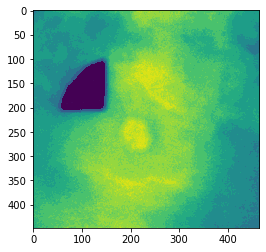

In [198]:
import cv2 
  
# path 
files_dict, files_list = frames_matrix_from_images_folder('/mnt/data/interim/_melanoma_20200728/checkyourskin/A63/2019-03-25_11-39-21')
src = files_list[0]
# Using cv2.rotate() method 
# Using cv2.ROTATE_180 rotate by  
# 180 degrees clockwise 
image = cv2.rotate(src, cv2.ROTATE_180) 
  
imshow(image) 

In [200]:
image.shape

(448, 466)

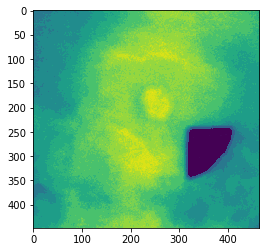

In [199]:
imshow(src)

In [201]:
src.shape

(448, 466)